#1. Using All Features

##Data Loading

In [1]:
#Connect to GDrive to load the dataset
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
#Specify file path and load it into a DataFrame
import pandas as pd
data=pd.read_excel('/content/drive/My Drive/Colab Notebooks/Research Project/Research Project Dataset.xlsx')
df=pd.DataFrame(data)

##Data Pre-processing

Ensuring Reproducibility

In [3]:
# Import libraries
import random
import numpy as np

#Set seed value
random.seed(42)
np.random.seed(42)

Visualising the dataset and its dimensions

In [ ]:
# Visualise the dataset
df.head(140)

,Nr,Sex,Age,Fatigue,General weakness,Pain,Focal symptoms,Cranial Nerve Symptoms,CN3,CN4,...,Pathological CSF,Increased protein,Increased protein (g/l),Pleocytosis,Pleocytosis (cells/ml),OCB + in CSF,IgG levels in CSF,VEP +,BAEP +,MS
0,2,0,56,0,0,0,1,1,0,0,...,1,0,0.37,0,4,0,,0,0,0
1,3,0,47,0,0,1,1,0,0,0,...,0,0,0.28,0,0,0,22.9,0,1,0
2,4,0,43,0,0,1,1,1,0,0,...,0,0,0.38,0,2,,25.3,1,0,0
3,5,0,39,0,0,1,0,0,0,0,...,0,,,0,1,0,,,,0
4,6,0,61,0,0,1,1,0,0,0,...,1,1,0.57,0,0,1,,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
133,165,0,65,0,0,0,1,0,0,0,...,,,NaN,,NaN,,,1,0,0
134,166,1,61,0,0,0,0,1,1,0,...,1,1,0.96,1,6,0,117,,,0
135,167,0,28,0,1,1,0,0,0,0,...,0,0,0.23,0,4,,,0,,1
136,169,0,22,0,0,0,1,0,0,0,...,0,0,0.16,0,4,1,14.9,0,0,1


In [ ]:
# Number of observations and features in the dataset
print(df.shape)

(138, 44)


Dropping columns not needed for the analysis

In [4]:
# Remove unnecessary columns
df = df.drop(['Nr', 'Increased protein (g/l)', 'Pleocytosis (cells/ml)', 'Sum of symptoms'], axis=1)

Converting the data type for use by the model

In [5]:
# Convert all columns to numeric data types
df = df.apply(pd.to_numeric, errors='coerce')

# Check the data types of columns
print(df.dtypes)

Sex                                           int64
Age                                           int64
Fatigue                                       int64
General weakness                              int64
Pain                                          int64
Focal symptoms                                int64
Cranial Nerve Symptoms                        int64
CN3                                           int64
CN4                                           int64
CN5                                           int64
CN6                                           int64
CN8                                           int64
Pathological reflexes                         int64
Babinski's                                    int64
Rossolimo                                     int64
Muscle strength                               int64
Reflex asymmetry                              int64
Muscle tone abnormalities                     int64
Proprioception                              float64
Superficial 

Impute missing data

In [6]:
#Install library for imputation
!pip install impyute

In [7]:
#import library for Multiple Imputation by Chained Equations (MICE)
from impyute.imputation.cs import mice

# impute missing values using MICE
imputed_data = mice(df.values)

# convert imputed data back to a pandas DataFrame
imputed_df = pd.DataFrame(imputed_data, columns=df.columns)

Visualising correlation and multicollinearity as a correlation matrix, heatmap and Seaborn plots

In [ ]:
#Plotting a correlation matrix
print("Correlation Matrix")
imputed_df.corr()

Correlation Matrix


,Sex,Age,Fatigue,General weakness,Pain,Focal symptoms,Cranial Nerve Symptoms,CN3,CN4,CN5,...,Juxtacortical,MRI spinal lesions,Pathological CSF,Increased protein,Pleocytosis,OCB + in CSF,IgG levels in CSF,VEP +,BAEP +,MS
Sex,1.000000e+00,0.016061,-0.124726,-0.186682,-0.143824,0.013304,0.113312,0.091287,0.116754,0.153485,...,-0.124258,0.117442,0.256159,0.278291,0.166620,-0.063964,0.117360,-0.043531,-0.011385,0.149906
Age,1.606093e-02,1.000000,-0.018888,0.040808,0.069197,0.132232,0.028693,0.071353,-0.013823,0.148812,...,0.194098,-0.224160,0.043598,0.308322,0.055476,-0.115866,0.246406,0.229738,0.134672,-0.068102
Fatigue,-1.247262e-01,-0.018888,1.000000,0.239192,0.033463,0.061810,0.028266,-0.079701,-0.086645,0.095718,...,0.254364,-0.241124,-0.029798,-0.111382,-0.068132,-0.039067,-0.030295,0.031995,0.044666,-0.093820
General weakness,-1.866822e-01,0.040808,0.239192,1.000000,0.084867,-0.091215,-0.034265,-0.130136,-0.077672,0.019350,...,0.172669,-0.204313,-0.002075,0.061167,-0.045524,0.022591,-0.085118,-0.204259,0.027302,0.001454
Pain,-1.438243e-01,0.069197,0.033463,0.084867,1.000000,-0.008537,-0.021425,-0.074736,-0.155520,0.167866,...,0.062533,-0.139975,-0.040157,0.134558,-0.038100,-0.025400,0.072157,-0.005035,-0.178989,-0.139549
Focal symptoms,1.330380e-02,0.132232,0.061810,-0.091215,-0.008537,1.000000,0.218173,0.014574,0.108729,0.036171,...,-0.133988,0.101753,0.037959,0.019003,0.011279,0.087697,-0.040427,0.220444,0.203431,0.073790
Cranial Nerve Symptoms,1.133118e-01,0.028693,0.028266,-0.034265,-0.021425,0.218173,1.000000,0.349812,0.208787,0.224059,...,0.086896,-0.109319,0.067680,0.061416,0.172958,-0.024822,-0.170976,0.137961,0.049238,0.061327
CN3,9.128709e-02,0.071353,-0.079701,-0.130136,-0.074736,0.014574,0.349812,1.000000,0.596853,-0.096077,...,0.126301,0.061742,-0.056823,0.095822,0.011825,0.038583,0.016986,0.003610,-0.010968,0.072332
CN4,1.167536e-01,-0.013823,-0.086645,-0.077672,-0.155520,0.108729,0.208787,0.596853,1.000000,-0.057344,...,0.013543,0.088680,-0.225631,-0.003715,-0.129000,-0.162587,-0.149552,-0.077386,0.057650,-0.102512
CN5,1.534852e-01,0.148812,0.095718,0.019350,0.167866,0.036171,0.224059,-0.096077,-0.057344,1.000000,...,-0.035239,0.125520,0.079393,0.082367,0.093909,-0.009715,-0.065336,0.016948,-0.030433,0.075129


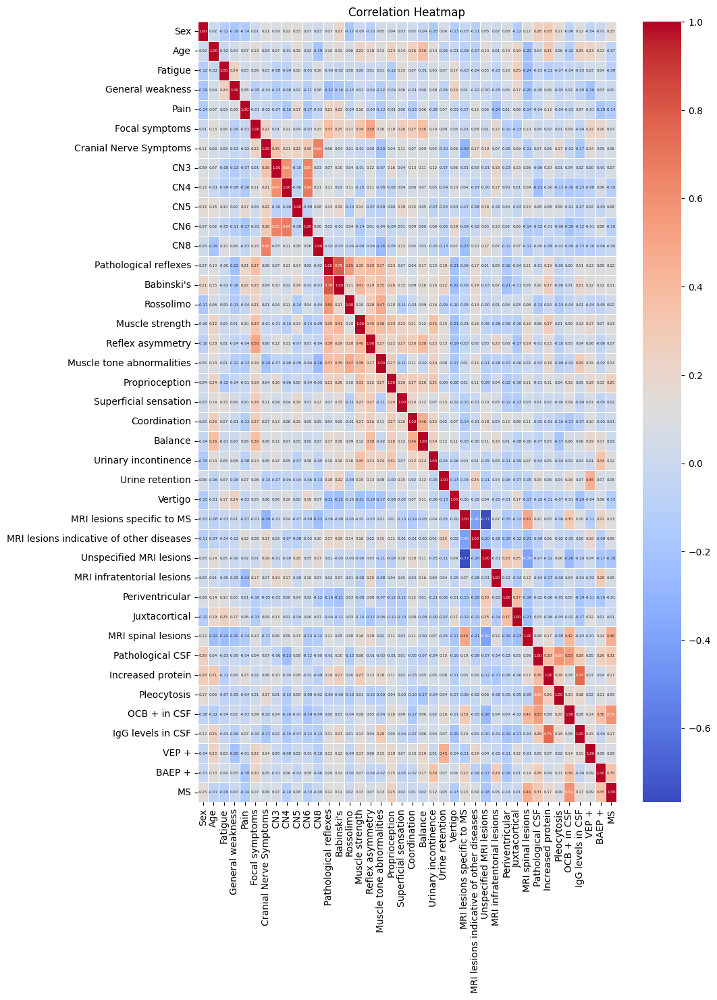

In [ ]:
#Visualise correlation and multicollinearity as a heatmap

#Import libraries
import seaborn as sns
import matplotlib.pyplot as plt

# Computing the correlation matrix
corr_matrix = imputed_df.corr()

# Plotting a heatmap
plt.figure(figsize=(10, 15))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5, annot_kws={"size": 4})
plt.title("Correlation Heatmap")
plt.show()

In [ ]:
#Visualise pairwise correlation as Seaborn plots
import seaborn as sns
sns.pairplot(imputed_df)

In [ ]:
# Print features with multicollinearity
highly_correlated_features = []
abs_corr_matrix = corr_matrix.abs()
for i in range(len(abs_corr_matrix.columns)):
    for j in range(i+1, len(abs_corr_matrix.columns)):
        if abs_corr_matrix.iloc[i, j] > 0.7:
            feature_i = abs_corr_matrix.columns[i]
            feature_j = abs_corr_matrix.columns[j]
            highly_correlated_features.append((feature_i, feature_j))

if len(highly_correlated_features) == 0:
    print("No Multicollinearity Observed")
else:
    print("Features with multicollinearity (absolute correlation coefficient > 0.7):")
    for feature_i, feature_j in highly_correlated_features:
        print(f"{feature_i} - {feature_j}")

Features with multicollinearity (absolute correlation coefficient > 0.7):
Pathological reflexes - Babinski's
MRI lesions specific to MS - Unspecified MRI lesions
Increased protein - IgG levels in CSF


Specify features and target variable

In [8]:
#Specify x and y
x = imputed_df.drop('MS', axis=1)
y = imputed_df['MS']

#Print dimensions
print(x.shape)
print(y.shape)

(138, 39)
(138,)


Checking for imbalanced classes in the dataset

0.0    64.492754
1.0    35.507246
Name: MS, dtype: float64


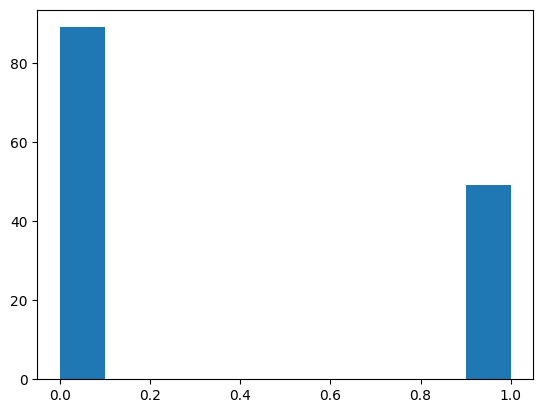

The baseline accuracy is: 0.644927536231884


In [9]:
# Check if dataset is imbalanced
print(y.value_counts() * 100.0 / len(y))

# Visualise dataset imbalance
import matplotlib.pyplot as plt
plt.figure()
y.hist(grid=False)
plt.show()

# Find baseline accuracy
from sklearn.dummy import DummyClassifier

clf = DummyClassifier(strategy='most_frequent')
clf.fit(x, y)
baseline_accuracy = clf.score(x, y)
print("The baseline accuracy is:", baseline_accuracy)


##Data Splitting Into Train and Test Sets

In [10]:
#Import train_test_split function
from sklearn.model_selection import train_test_split

# Split data into train and test sets with stratification to resolve class imbalances
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=1, stratify=y, shuffle=True)

# Print dimensions
print('x_train:', x_train.shape)
print('x_test:', x_test.shape)
print('y_train:', y_train.shape)
print('y_test:', y_test.shape)

x_train: (110, 39)
x_test: (28, 39)
y_train: (110,)
y_test: (28,)


##Importing Libraries for Following Steps

In [11]:
from sklearn.metrics import f1_score
import warnings
from sklearn.exceptions import ConvergenceWarning
import numpy as np
from sklearn.model_selection import StratifiedKFold
from sklearn.naive_bayes import GaussianNB
from sklearn.model_selection import GridSearchCV

# Ignore convergence warnings
warnings.filterwarnings("ignore", category=ConvergenceWarning)

##Hyperparameter tuning

In [12]:
# Define parameters to tune for Naive Bayes
nb_param_grid = {'var_smoothing': [1e-12, 1e-11, 1e-10, 1e-9, 1e-8, 1e-7, 1e-6, 1e-5, 1e-4, 1e-3]}


##Stratified K-Fold Cross Validation:

In [13]:
# Creating an instance of StratifiedKFold
nb_skfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=1)


##Training and Model Validation:



In [14]:
# Creating lists to store evaluation metrics for each fold
train_f1_scores = []
val_f1_scores = []

# Iterating over each fold
for train_index, val_index in nb_skfold.split(x_train, y_train):
    x_train_fold, x_val_fold = x_train.iloc[train_index], x_train.iloc[val_index]
    y_train_fold, y_val_fold = y_train.iloc[train_index], y_train.iloc[val_index]

    # Create an instance of Logistic Regression model
    nb = GaussianNB()

    # Create an instance of GridSearchCV for Logistic Regression Classifier
    nb_cv = GridSearchCV(nb, nb_param_grid, cv=nb_skfold)

    # Fit GridSearchCV on the training fold
    nb_cv.fit(x_train_fold, y_train_fold)

    # Get the best estimator from GridSearchCV
    best_nb_model = nb_cv.best_estimator_

    # Print best parameters and F1 score
    print("Best Parameters:", nb_cv.best_params_)
    print("F1 Score:", nb_cv.best_score_)

    # Fitting the best estimator on the training fold and making predictions
    y_train_pred = best_nb_model.predict(x_train_fold)

    # Calculating F1 score for the train set
    train_f1 = f1_score(y_train_fold, y_train_pred)

    # Appending train F1 score to the list
    train_f1_scores.append(train_f1)

    # Making predictions for the validation fold
    y_val_pred = best_nb_model.predict(x_val_fold)

    # Calculating F1 score for the validation set
    val_f1 = f1_score(y_val_fold, y_val_pred)

    # Appending validation F1 score to the list
    val_f1_scores.append(val_f1)


Best Parameters: {'var_smoothing': 0.001}
F1 Score: 0.7843137254901962
Best Parameters: {'var_smoothing': 0.0001}
F1 Score: 0.726797385620915
Best Parameters: {'var_smoothing': 0.0001}
F1 Score: 0.6699346405228759
Best Parameters: {'var_smoothing': 1e-10}
F1 Score: 0.6915032679738562
Best Parameters: {'var_smoothing': 0.0001}
F1 Score: 0.6836601307189543


##Average F1 Scores and Standard Deviation:

In [15]:
# Calculating the average and standard deviation of F1 scores for train and validation sets
avg_train_f1 = np.mean(train_f1_scores)
std_train_f1 = np.std(train_f1_scores)
avg_val_f1 = np.mean(val_f1_scores)
std_val_f1 = np.std(val_f1_scores)

# Print the average and standard deviation for train and validation F1 scores
print("Average Train F1 Score:", avg_train_f1)
print("Standard Deviation of Train F1 Score:", std_train_f1)
print("Average Validation F1 Score:", avg_val_f1)
print("Standard Deviation of Validation F1 Score:", std_val_f1)


Average Train F1 Score: 0.6734091270242549
Standard Deviation of Train F1 Score: 0.06734723235025933
Average Validation F1 Score: 0.4558241758241759
Standard Deviation of Validation F1 Score: 0.1024996134252447


##Model Predictions on Train and Test Sets:

In [16]:
# Make predictions on the train set using best model
best_model = nb_cv.best_estimator_
y_train_pred = best_model.predict(x_train)

# Make predictions on the test set using best model
best_model = nb_cv.best_estimator_
y_test_pred = best_model.predict(x_test)

##Visualise Various Classification Metrics

In [17]:
#Print Classification Report
from sklearn.metrics import classification_report
print("Classification Report of Train Data:")
print(classification_report(y_train, y_train_pred))

print()

print("Classification Report of Test Data: ")
print(classification_report(y_test, y_test_pred))


Classification Report of Train Data:
              precision    recall  f1-score   support

         0.0       0.80      0.89      0.84        71
         1.0       0.74      0.59      0.66        39

    accuracy                           0.78       110
   macro avg       0.77      0.74      0.75       110
weighted avg       0.78      0.78      0.78       110


Classification Report of Test Data: 
              precision    recall  f1-score   support

         0.0       0.84      0.89      0.86        18
         1.0       0.78      0.70      0.74        10

    accuracy                           0.82        28
   macro avg       0.81      0.79      0.80        28
weighted avg       0.82      0.82      0.82        28



Text(0.5, 1.0, 'Confusion Matrix of Test Data')

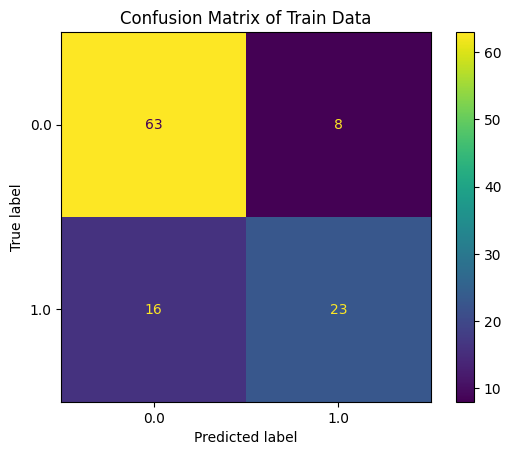

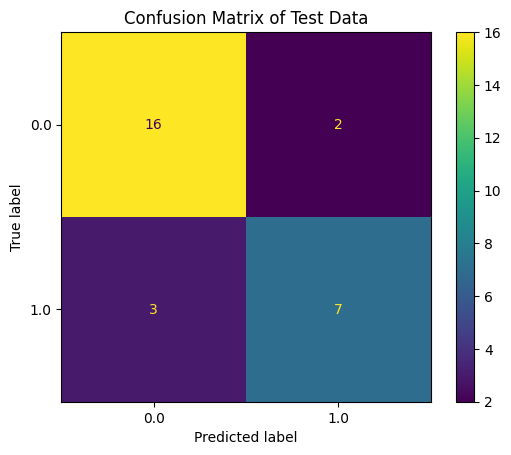

In [18]:
#Plot Confusion Matrix for Train and Test Data
from sklearn.metrics import ConfusionMatrixDisplay
import matplotlib.pyplot as plt

#Confusion Matrix of Train Data
ConfusionMatrixDisplay.from_predictions(y_train, y_train_pred)
plt.title('Confusion Matrix of Train Data')

#Confusion Matrix of Test Data
ConfusionMatrixDisplay.from_predictions(y_test, y_test_pred)
plt.title('Confusion Matrix of Test Data')

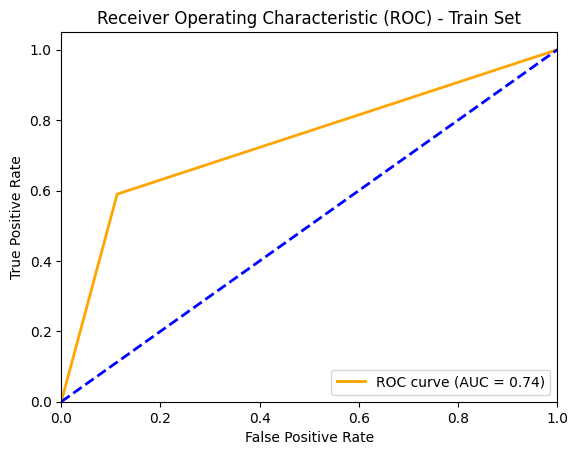

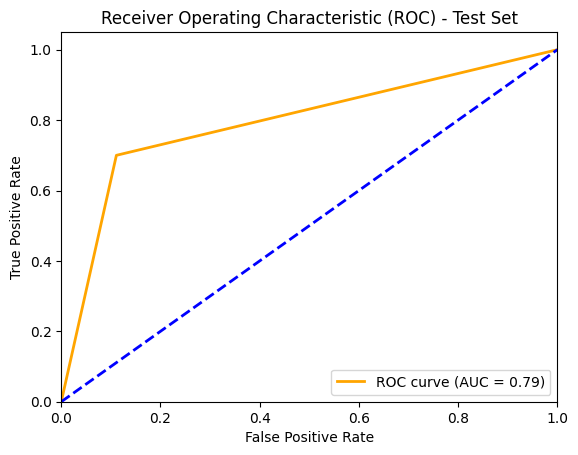

In [19]:
#Plot ROC Curve for Train and Test Data
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve
from sklearn.metrics import auc

# Map actual "YES" and "NO" values to 1 and 0 respectively
mapping = {1.0: 1, 0.0: 0}
y_train_mapped = [mapping[val] for val in y_train]
y_test_mapped = [mapping[val] for val in y_test]

# Map predicted "YES" and "NO" values to 1 and 0 respectively
y_train_pred_mapped = [mapping[val] for val in y_train_pred]
y_test_pred_mapped = [mapping[val] for val in y_test_pred]

# ROC curve and AUC for train data
fpr_train, tpr_train, thresholds_train = roc_curve(y_train_mapped, y_train_pred_mapped)
roc_auc_train = auc(fpr_train, tpr_train)

# ROC curve and AUC for test data
fpr_test, tpr_test, thresholds_test = roc_curve(y_test_mapped, y_test_pred_mapped)
roc_auc_test = auc(fpr_test, tpr_test)

# Plot ROC curve for train data
plt.figure()
plt.plot(fpr_train, tpr_train, color='orange', lw=2, label='ROC curve (AUC = %0.2f)' % roc_auc_train)
plt.plot([0, 1], [0, 1], color='blue', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) - Train Set')
plt.legend(loc="lower right")

# Plot ROC curve for test data
plt.figure()
plt.plot(fpr_test, tpr_test, color='orange', lw=2, label='ROC curve (AUC = %0.2f)' % roc_auc_test)
plt.plot([0, 1], [0, 1], color='blue', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) - Test Set')
plt.legend(loc="lower right")

plt.show()

#2. Using All Except Multicollinear Features

##Data Loading

In [ ]:
#Connect to GDrive to load the dataset
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [20]:
#Specify file path and load it into a DataFrame
import pandas as pd
data=pd.read_excel('/content/drive/My Drive/Colab Notebooks/Research Project/Research Project Dataset.xlsx')
df=pd.DataFrame(data)

##Data Pre-processing

Ensuring Reproducibility

In [21]:
# Import libraries
import random
import numpy as np

#Set seed value
random.seed(42)
np.random.seed(42)

Visualising the dataset and its dimensions

In [ ]:
# Visualise the dataset
df.head(140)

,Nr,Sex,Age,Fatigue,General weakness,Pain,Focal symptoms,Cranial Nerve Symptoms,CN3,CN4,...,Pathological CSF,Increased protein,Increased protein (g/l),Pleocytosis,Pleocytosis (cells/ml),OCB + in CSF,IgG levels in CSF,VEP +,BAEP +,MS
0,2,0,56,0,0,0,1,1,0,0,...,1,0,0.37,0,4,0,,0,0,0
1,3,0,47,0,0,1,1,0,0,0,...,0,0,0.28,0,0,0,22.9,0,1,0
2,4,0,43,0,0,1,1,1,0,0,...,0,0,0.38,0,2,,25.3,1,0,0
3,5,0,39,0,0,1,0,0,0,0,...,0,,,0,1,0,,,,0
4,6,0,61,0,0,1,1,0,0,0,...,1,1,0.57,0,0,1,,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
133,165,0,65,0,0,0,1,0,0,0,...,,,NaN,,NaN,,,1,0,0
134,166,1,61,0,0,0,0,1,1,0,...,1,1,0.96,1,6,0,117,,,0
135,167,0,28,0,1,1,0,0,0,0,...,0,0,0.23,0,4,,,0,,1
136,169,0,22,0,0,0,1,0,0,0,...,0,0,0.16,0,4,1,14.9,0,0,1


In [ ]:
# Number of observations and features in the dataset
print(df.shape)

(138, 44)


Dropping columns not needed for the analysis

In [22]:
# Remove unnecessary columns
df = df.drop(['Nr', 'Increased protein (g/l)', 'Pleocytosis (cells/ml)', 'Sum of symptoms'], axis=1)

Drop features with multicollinearity that also have a low correlation with target variable

In [23]:
columns_to_drop = ["Babinski's", "Unspecified MRI lesions", "Increased protein"]
df.drop(columns=columns_to_drop, inplace=True)

Converting the data type for use by the model

In [24]:
# Convert all columns to numeric data types
df = df.apply(pd.to_numeric, errors='coerce')

# Check the data types of columns
print(df.dtypes)

Sex                                           int64
Age                                           int64
Fatigue                                       int64
General weakness                              int64
Pain                                          int64
Focal symptoms                                int64
Cranial Nerve Symptoms                        int64
CN3                                           int64
CN4                                           int64
CN5                                           int64
CN6                                           int64
CN8                                           int64
Pathological reflexes                         int64
Rossolimo                                     int64
Muscle strength                               int64
Reflex asymmetry                              int64
Muscle tone abnormalities                     int64
Proprioception                              float64
Superficial sensation                       float64
Coordination

Impute missing data

In [25]:
#Install library for imputation
!pip install impyute

In [26]:
#import library for Multiple Imputation by Chained Equations (MICE)
from impyute.imputation.cs import mice

# impute missing values using MICE
imputed_data = mice(df.values)

# convert imputed data back to a pandas DataFrame
imputed_df = pd.DataFrame(imputed_data, columns=df.columns)

Visualising correlation and multicollinearity as a correlation matrix, heatmap and Seaborn plots

In [ ]:
#Plotting a correlation matrix
print("Correlation Matrix")
imputed_df.corr()

Correlation Matrix


,Sex,Age,Fatigue,General weakness,Pain,Focal symptoms,Cranial Nerve Symptoms,CN3,CN4,CN5,...,Periventricular,Juxtacortical,MRI spinal lesions,Pathological CSF,Pleocytosis,OGB + in CSF,IgG levels in CSF,VEP +,BAEP +,MS
Sex,1.000000e+00,0.016061,-0.124726,-0.186682,-0.143824,0.013304,0.113312,0.091287,0.116754,0.153485,...,0.094542,-0.105958,0.125444,0.243080,0.178173,-0.048138,0.005579,-0.057869,-0.004314,0.149906
Age,1.606093e-02,1.000000,-0.018888,0.040808,0.069197,0.132232,0.028693,0.071353,-0.013823,0.148812,...,0.139244,0.195399,0.085186,0.031809,0.037781,-0.149899,0.240232,0.242817,0.139332,-0.068102
Fatigue,-1.247262e-01,-0.018888,1.000000,0.239192,0.033463,0.061810,0.028266,-0.079701,-0.086645,0.095718,...,0.102698,0.238302,-0.111317,-0.028414,-0.060553,-0.034315,0.023302,0.139524,0.023777,-0.093820
General weakness,-1.866822e-01,0.040808,0.239192,1.000000,0.084867,-0.091215,-0.034265,-0.130136,-0.077672,0.019350,...,0.048775,0.143303,-0.187123,0.001092,-0.034323,0.017347,-0.055048,-0.154771,-0.018543,0.001454
Pain,-1.438243e-01,0.069197,0.033463,0.084867,1.000000,-0.008537,-0.021425,-0.074736,-0.155520,0.167866,...,-0.004080,0.036253,-0.201428,-0.036298,-0.076684,-0.068398,0.122203,-0.057584,-0.133100,-0.139549
Focal symptoms,1.330380e-02,0.132232,0.061810,-0.091215,-0.008537,1.000000,0.218173,0.014574,0.108729,0.036171,...,-0.092496,-0.095371,0.086989,0.044754,-0.005424,0.066171,0.072911,0.265760,0.195272,0.073790
Cranial Nerve Symptoms,1.133118e-01,0.028693,0.028266,-0.034265,-0.021425,0.218173,1.000000,0.349812,0.208787,0.224059,...,-0.052459,0.056558,-0.055059,0.067118,0.149994,-0.077656,-0.041499,0.132557,-0.019921,0.061327
CN3,9.128709e-02,0.071353,-0.079701,-0.130136,-0.074736,0.014574,0.349812,1.000000,0.596853,-0.096077,...,-0.031465,0.106806,0.146362,-0.055679,-0.011778,0.040993,0.108632,0.058525,-0.062796,0.072332
CN4,1.167536e-01,-0.013823,-0.086645,-0.077672,-0.155520,0.108729,0.208787,0.596853,1.000000,-0.057344,...,0.000548,0.003074,0.208747,-0.228508,-0.121118,-0.149523,-0.123336,-0.082771,0.050026,-0.102512
CN5,1.534852e-01,0.148812,0.095718,0.019350,0.167866,0.036171,0.224059,-0.096077,-0.057344,1.000000,...,0.037922,-0.045536,0.165067,0.077212,0.059120,-0.019240,-0.026449,0.063097,-0.017645,0.075129


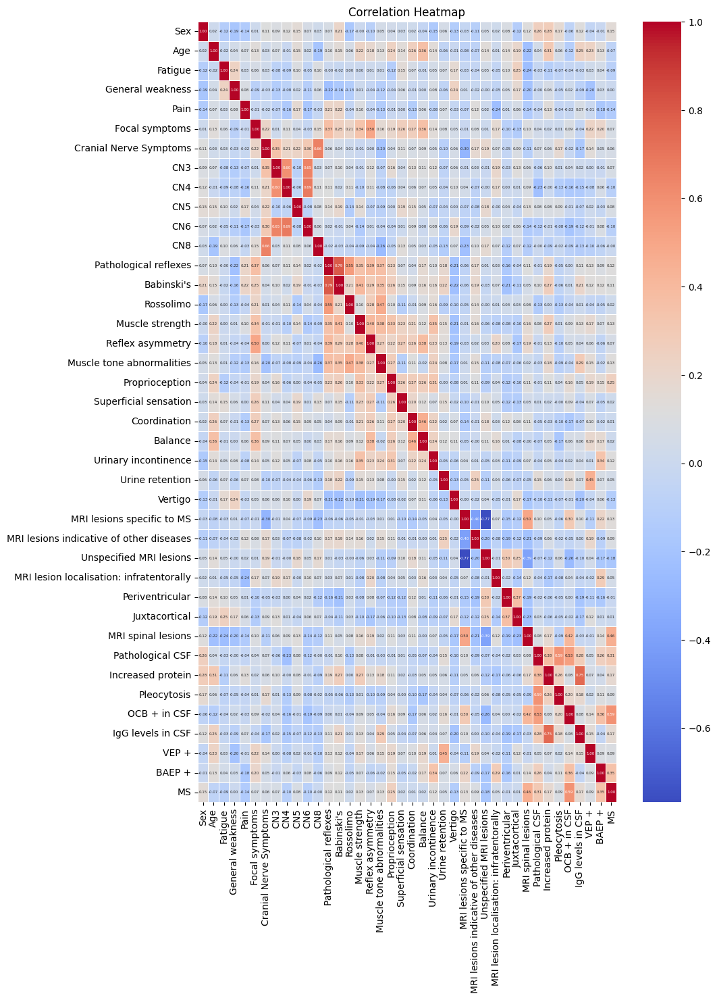

In [ ]:
#Visualise correlation and multicollinearity as a heatmap

#Import libraries
import seaborn as sns
import matplotlib.pyplot as plt

# Computing the correlation matrix
corr_matrix = imputed_df.corr()

# Plotting a heatmap
plt.figure(figsize=(10, 15))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5, annot_kws={"size": 4})
plt.title("Correlation Heatmap")
plt.show()

In [ ]:
#Visualise pairwise correlation as Seaborn plots
import seaborn as sns
sns.pairplot(imputed_df)

In [ ]:
# Print features with multicollinearity
highly_correlated_features = []
abs_corr_matrix = corr_matrix.abs()
for i in range(len(abs_corr_matrix.columns)):
    for j in range(i+1, len(abs_corr_matrix.columns)):
        if abs_corr_matrix.iloc[i, j] > 0.7:
            feature_i = abs_corr_matrix.columns[i]
            feature_j = abs_corr_matrix.columns[j]
            highly_correlated_features.append((feature_i, feature_j))

if len(highly_correlated_features) == 0:
    print("No Multicollinearity Observed")
else:
    print("Features with multicollinearity (absolute correlation coefficient > 0.7):")
    for feature_i, feature_j in highly_correlated_features:
        print(f"{feature_i} - {feature_j}")

Features with multicollinearity (absolute correlation coefficient > 0.7):
Pathological reflexes - Babinski's
MRI lesions specific to MS - Unspecified MRI lesions
Increased protein - IgG levels in CSF


Specify features and target variable

In [27]:
#Specify x and y
x = imputed_df.drop('MS', axis=1)
y = imputed_df['MS']

#Print dimensions
print(x.shape)
print(y.shape)

(138, 36)
(138,)


Checking for imbalanced classes in the dataset

0.0    64.492754
1.0    35.507246
Name: MS, dtype: float64


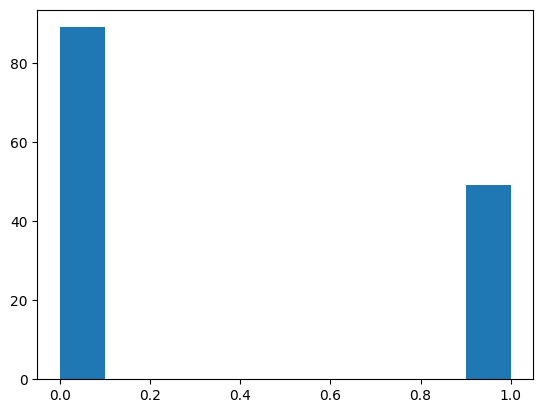

The baseline accuracy is: 0.644927536231884


In [28]:
# Check if dataset is imbalanced
print(y.value_counts() * 100.0 / len(y))

# Visualise dataset imbalance
import matplotlib.pyplot as plt
plt.figure()
y.hist(grid=False)
plt.show()

# Find baseline accuracy
from sklearn.dummy import DummyClassifier

clf = DummyClassifier(strategy='most_frequent')
clf.fit(x, y)
baseline_accuracy = clf.score(x, y)
print("The baseline accuracy is:", baseline_accuracy)


##Data Splitting

Split data into train and test sets

In [29]:
#Import train_test_split function
from sklearn.model_selection import train_test_split

# Split data into train and test sets with stratification to resolve class imbalances
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=1, stratify=y, shuffle=True)

# Print dimensions
print('x_train:', x_train.shape)
print('x_test:', x_test.shape)
print('y_train:', y_train.shape)
print('y_test:', y_test.shape)

x_train: (110, 36)
x_test: (28, 36)
y_train: (110,)
y_test: (28,)


##Importing Libraries for Following Steps

In [30]:
from sklearn.metrics import f1_score
import warnings
from sklearn.exceptions import ConvergenceWarning
import numpy as np
from sklearn.model_selection import StratifiedKFold
from sklearn.naive_bayes import GaussianNB
from sklearn.model_selection import GridSearchCV

# Ignore convergence warnings
warnings.filterwarnings("ignore", category=ConvergenceWarning)

##Hyperparameter tuning

In [31]:
# Define parameters to tune for Naive Bayes
nb_param_grid = {'var_smoothing': [1e-12, 1e-11, 1e-10, 1e-9, 1e-8, 1e-7, 1e-6, 1e-5, 1e-4, 1e-3]}

##Stratified K-Fold Cross Validation:

In [32]:
# Creating an instance of StratifiedKFold
nb_skfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=1)

##Training and Model Validation:



In [33]:
# Creating lists to store evaluation metrics for each fold
train_f1_scores = []
val_f1_scores = []

# Iterating over each fold
for train_index, val_index in nb_skfold.split(x_train, y_train):
    x_train_fold, x_val_fold = x_train.iloc[train_index], x_train.iloc[val_index]
    y_train_fold, y_val_fold = y_train.iloc[train_index], y_train.iloc[val_index]

    # Create an instance of Logistic Regression model
    nb = GaussianNB()

    # Create an instance of GridSearchCV for Logistic Regression Classifier
    nb_cv = GridSearchCV(nb, nb_param_grid, cv=nb_skfold)

    # Fit GridSearchCV on the training fold
    nb_cv.fit(x_train_fold, y_train_fold)

    # Get the best estimator from GridSearchCV
    best_nb_model = nb_cv.best_estimator_

    # Print best parameters and F1 score
    print("Best Parameters:", nb_cv.best_params_)
    print("F1 Score:", nb_cv.best_score_)

    # Fitting the best estimator on the training fold and making predictions
    y_train_pred = best_nb_model.predict(x_train_fold)

    # Calculating F1 score for the train set
    train_f1 = f1_score(y_train_fold, y_train_pred)

    # Appending train F1 score to the list
    train_f1_scores.append(train_f1)

    # Making predictions for the validation fold
    y_val_pred = best_nb_model.predict(x_val_fold)

    # Calculating F1 score for the validation set
    val_f1 = f1_score(y_val_fold, y_val_pred)

    # Appending validation F1 score to the list
    val_f1_scores.append(val_f1)


Best Parameters: {'var_smoothing': 0.0001}
F1 Score: 0.7725490196078432
Best Parameters: {'var_smoothing': 0.0001}
F1 Score: 0.7379084967320262
Best Parameters: {'var_smoothing': 0.0001}
F1 Score: 0.6712418300653595
Best Parameters: {'var_smoothing': 1e-08}
F1 Score: 0.681045751633987
Best Parameters: {'var_smoothing': 1e-05}
F1 Score: 0.6823529411764706


##Average F1 Scores and Standard Deviation:

In [34]:
# Calculating the average and standard deviation of F1 scores for train and validation sets
avg_train_f1 = np.mean(train_f1_scores)
std_train_f1 = np.std(train_f1_scores)
avg_val_f1 = np.mean(val_f1_scores)
std_val_f1 = np.std(val_f1_scores)

# Print the average and standard deviation for train and validation F1 scores
print("Average Train F1 Score:", avg_train_f1)
print("Standard Deviation of Train F1 Score:", std_train_f1)
print("Average Validation F1 Score:", avg_val_f1)
print("Standard Deviation of Validation F1 Score:", std_val_f1)


Average Train F1 Score: 0.6725802806099744
Standard Deviation of Train F1 Score: 0.06677701437319172
Average Validation F1 Score: 0.4465312465312466
Standard Deviation of Validation F1 Score: 0.1015256894853758


##Model Predictions on Train and Test Sets:

In [35]:
# Calculating the average and standard deviation of F1 scores for train and validation sets
avg_train_f1 = np.mean(train_f1_scores)
std_train_f1 = np.std(train_f1_scores)
avg_val_f1 = np.mean(val_f1_scores)
std_val_f1 = np.std(val_f1_scores)

# Print the average and standard deviation for train and validation F1 scores
print("Average Train F1 Score:", avg_train_f1)
print("Standard Deviation of Train F1 Score:", std_train_f1)
print("Average Validation F1 Score:", avg_val_f1)
print("Standard Deviation of Validation F1 Score:", std_val_f1)


Average Train F1 Score: 0.6725802806099744
Standard Deviation of Train F1 Score: 0.06677701437319172
Average Validation F1 Score: 0.4465312465312466
Standard Deviation of Validation F1 Score: 0.1015256894853758


##Visualise Various Classification Metrics

In [36]:
from sklearn.metrics import classification_report
import numpy as np

# Convert y_train_pred to an array and reshape it if necessary
y_train_pred = np.array(y_train_pred).reshape(-1)

# Trim y_train to match the length of y_train_pred
y_train = y_train[:len(y_train_pred)]

print("Classification Report of Train Data:")
print(classification_report(y_train, y_train_pred))
print()

# Do the same for the test data
y_test_pred = np.array(y_test_pred).reshape(-1)
y_test = y_test[:len(y_test_pred)]

print("Classification Report of Test Data: ")
print(classification_report(y_test, y_test_pred))


Classification Report of Train Data:
              precision    recall  f1-score   support

         0.0       0.55      0.55      0.55        55
         1.0       0.24      0.24      0.24        33

    accuracy                           0.43        88
   macro avg       0.39      0.39      0.39        88
weighted avg       0.43      0.43      0.43        88


Classification Report of Test Data: 
              precision    recall  f1-score   support

         0.0       0.84      0.89      0.86        18
         1.0       0.78      0.70      0.74        10

    accuracy                           0.82        28
   macro avg       0.81      0.79      0.80        28
weighted avg       0.82      0.82      0.82        28



Text(0.5, 1.0, 'Confusion Matrix of Test Data')

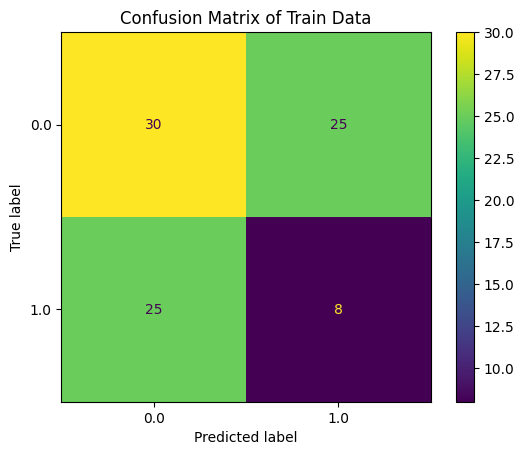

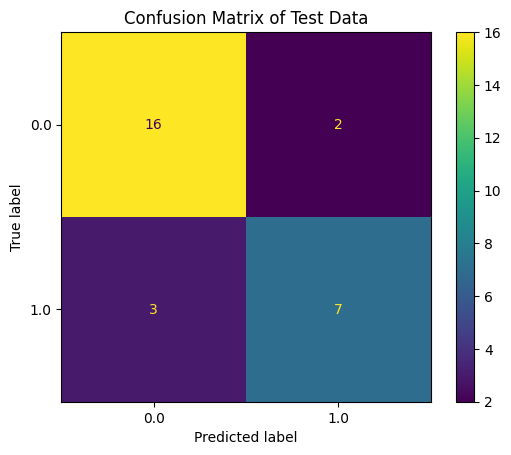

In [37]:
#Plot Confusion Matrix for Train and Test Data
from sklearn.metrics import ConfusionMatrixDisplay

#Confusion Matrix of Train Data
ConfusionMatrixDisplay.from_predictions(y_train, y_train_pred)
plt.title('Confusion Matrix of Train Data')

#Confusion Matrix of Test Data
ConfusionMatrixDisplay.from_predictions(y_test, y_test_pred)
plt.title('Confusion Matrix of Test Data')

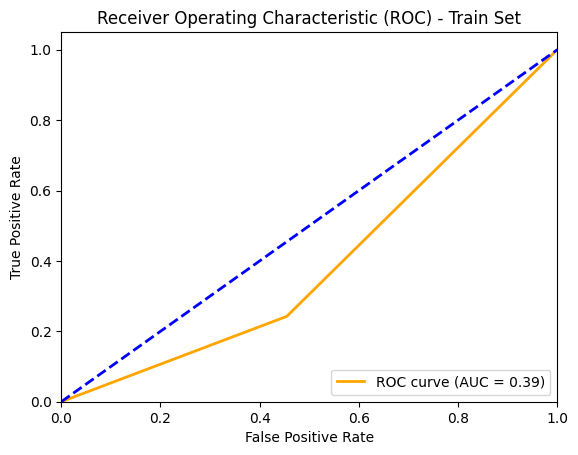

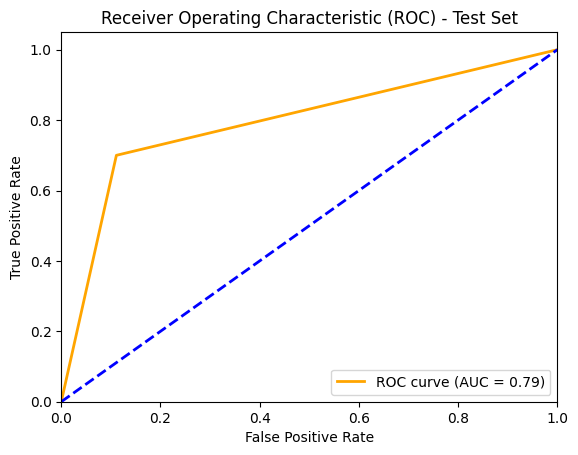

In [38]:
#Plot ROC Curve for Train and Test Data
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve
from sklearn.metrics import auc

# Map actual "YES" and "NO" values to 1 and 0 respectively
mapping = {1.0: 1, 0.0: 0}
y_train_mapped = [mapping[val] for val in y_train]
y_test_mapped = [mapping[val] for val in y_test]

# Map predicted "YES" and "NO" values to 1 and 0 respectively
y_train_pred_mapped = [mapping[val] for val in y_train_pred]
y_test_pred_mapped = [mapping[val] for val in y_test_pred]

# ROC curve and AUC for train data
fpr_train, tpr_train, thresholds_train = roc_curve(y_train_mapped, y_train_pred_mapped)
roc_auc_train = auc(fpr_train, tpr_train)

# ROC curve and AUC for test data
fpr_test, tpr_test, thresholds_test = roc_curve(y_test_mapped, y_test_pred_mapped)
roc_auc_test = auc(fpr_test, tpr_test)

# Plot ROC curve for train data
plt.figure()
plt.plot(fpr_train, tpr_train, color='orange', lw=2, label='ROC curve (AUC = %0.2f)' % roc_auc_train)
plt.plot([0, 1], [0, 1], color='blue', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) - Train Set')
plt.legend(loc="lower right")

# Plot ROC curve for test data
plt.figure()
plt.plot(fpr_test, tpr_test, color='orange', lw=2, label='ROC curve (AUC = %0.2f)' % roc_auc_test)
plt.plot([0, 1], [0, 1], color='blue', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) - Test Set')
plt.legend(loc="lower right")

plt.show()

#3. Using only important features from feature selection

##Data Loading

In [39]:
#Connect to GDrive to load the dataset
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [40]:
#Specify file path and load it into a DataFrame
import pandas as pd
data=pd.read_excel('/content/drive/My Drive/Colab Notebooks/Research Project/Research Project Dataset.xlsx')
df=pd.DataFrame(data)

##Data Pre-processing

Ensuring Reproducibility

In [41]:
# Import libraries
import random
import numpy as np

#Set seed value
random.seed(42)
np.random.seed(42)

Visualising the dataset and its dimensions

In [ ]:
# Visualise the dataset
df.head(140)

,Nr,Sex,Age,Fatigue,General weakness,Pain,Focal symptoms,Cranial Nerve Symptoms,CN3,CN4,...,Pathological CSF,Increased protein,Increased protein (g/l),Pleocytosis,Pleocytosis (cells/ml),OCB + in CSF,IgG levels in CSF,VEP +,BAEP +,MS
0,2,0,56,0,0,0,1,1,0,0,...,1,0,0.37,0,4,0,,0,0,0
1,3,0,47,0,0,1,1,0,0,0,...,0,0,0.28,0,0,0,22.9,0,1,0
2,4,0,43,0,0,1,1,1,0,0,...,0,0,0.38,0,2,,25.3,1,0,0
3,5,0,39,0,0,1,0,0,0,0,...,0,,,0,1,0,,,,0
4,6,0,61,0,0,1,1,0,0,0,...,1,1,0.57,0,0,1,,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
133,165,0,65,0,0,0,1,0,0,0,...,,,NaN,,NaN,,,1,0,0
134,166,1,61,0,0,0,0,1,1,0,...,1,1,0.96,1,6,0,117,,,0
135,167,0,28,0,1,1,0,0,0,0,...,0,0,0.23,0,4,,,0,,1
136,169,0,22,0,0,0,1,0,0,0,...,0,0,0.16,0,4,1,14.9,0,0,1


In [ ]:
# Number of observations and features in the dataset
print(df.shape)

(138, 44)


Dropping columns not needed for the analysis

In [42]:
# Remove unnecessary columns
df = df.drop(['Nr', 'Increased protein (g/l)', 'Pleocytosis (cells/ml)', 'Sum of symptoms'], axis=1)

Converting the data type for use by the model

In [43]:
# Convert all columns to numeric data types
df = df.apply(pd.to_numeric, errors='coerce')

# Check the data types of columns
print(df.dtypes)

Sex                                           int64
Age                                           int64
Fatigue                                       int64
General weakness                              int64
Pain                                          int64
Focal symptoms                                int64
Cranial Nerve Symptoms                        int64
CN3                                           int64
CN4                                           int64
CN5                                           int64
CN6                                           int64
CN8                                           int64
Pathological reflexes                         int64
Babinski's                                    int64
Rossolimo                                     int64
Muscle strength                               int64
Reflex asymmetry                              int64
Muscle tone abnormalities                     int64
Proprioception                              float64
Superficial 

Impute missing data

In [44]:
#Install library for imputation
!pip install impyute

In [45]:
#import library for Multiple Imputation by Chained Equations (MICE)
from impyute.imputation.cs import mice

# impute missing values using MICE
imputed_data = mice(df.values)

# convert imputed data back to a pandas DataFrame
imputed_df = pd.DataFrame(imputed_data, columns=df.columns)

Specify features and target variable

In [46]:
#Specify x and y
x = imputed_df[['Sex', 'General weakness', 'Cranial Nerve Symptoms', 'MRI lesions indicative of other diseases', 'Periventricular', 'MRI spinal lesions', 'OCB + in CSF', 'BAEP +', 'Pathological reflexes', 'Muscle tone abnormalities', 'Proprioception', ]]
y = imputed_df['MS']

#Print dimensions
print(x.shape)
print(y.shape)

(138, 11)
(138,)


Visualising Relationship between Target Variable and Each Feature in X

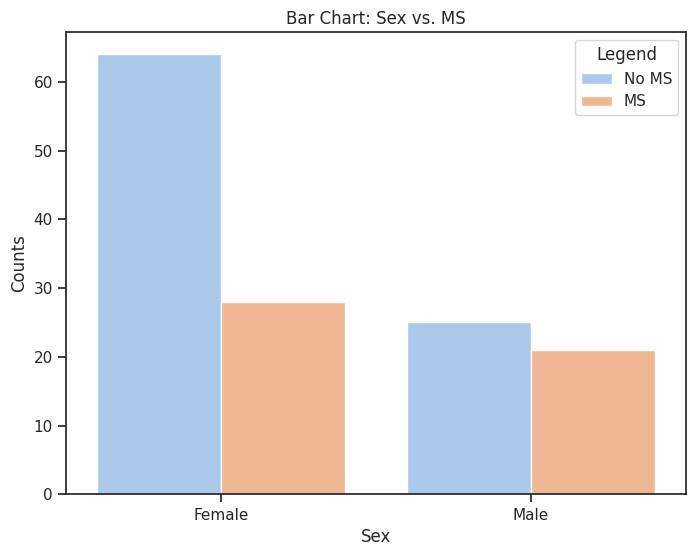

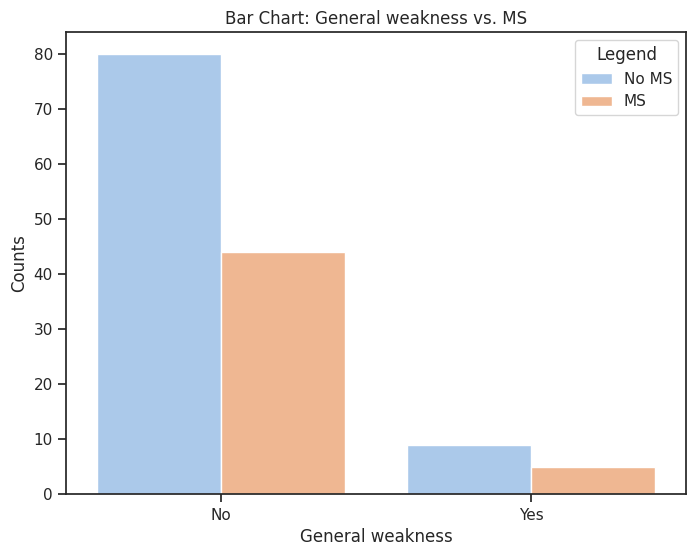

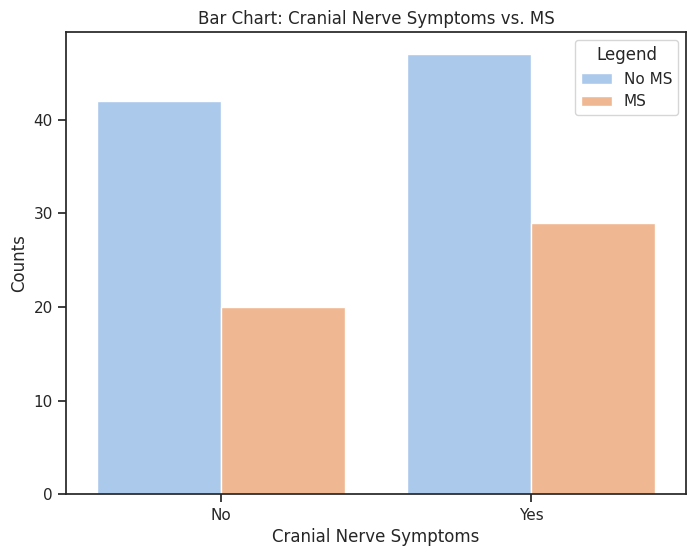

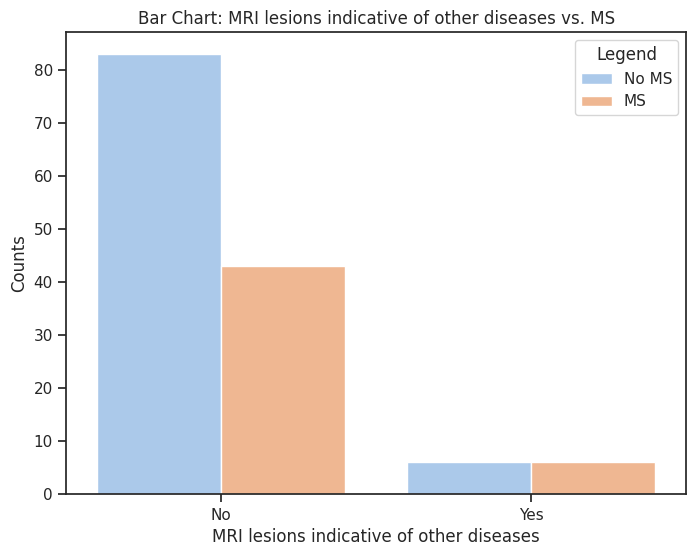

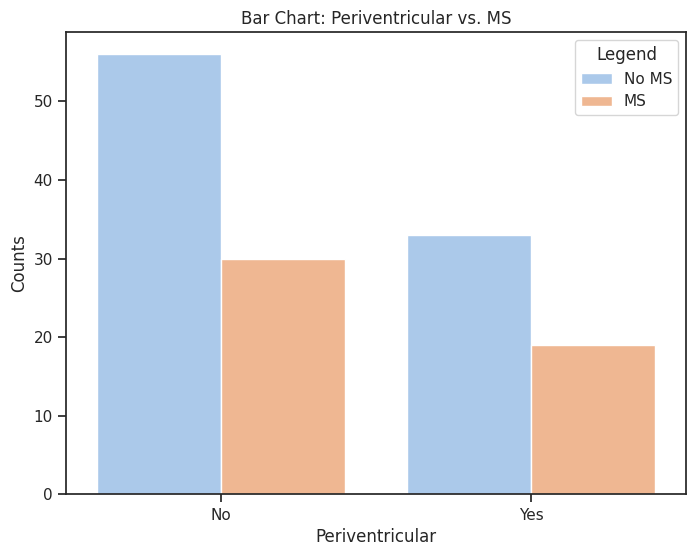

...

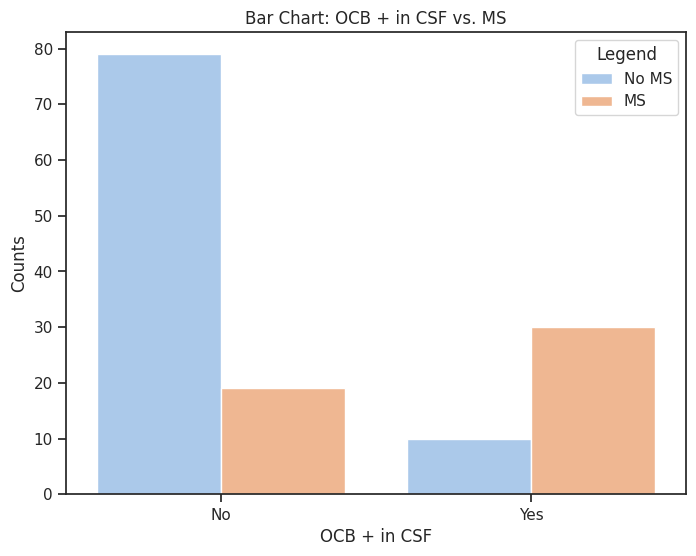

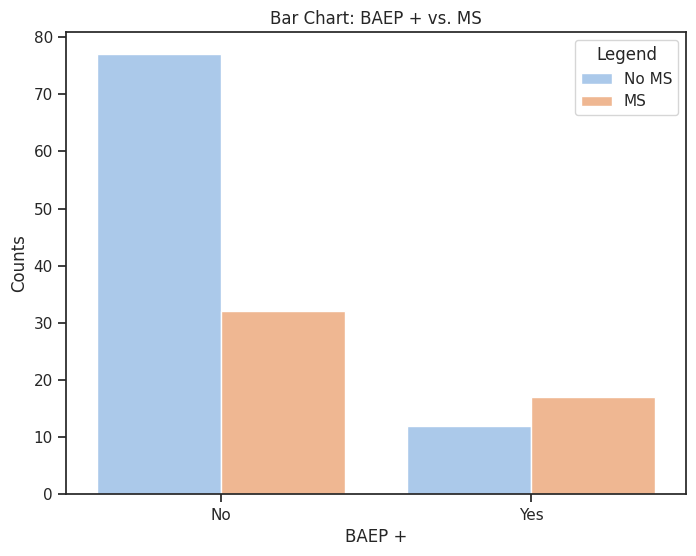

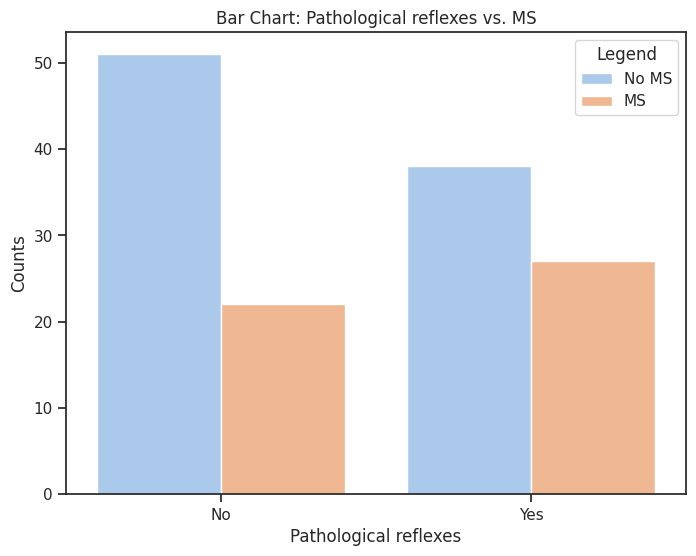

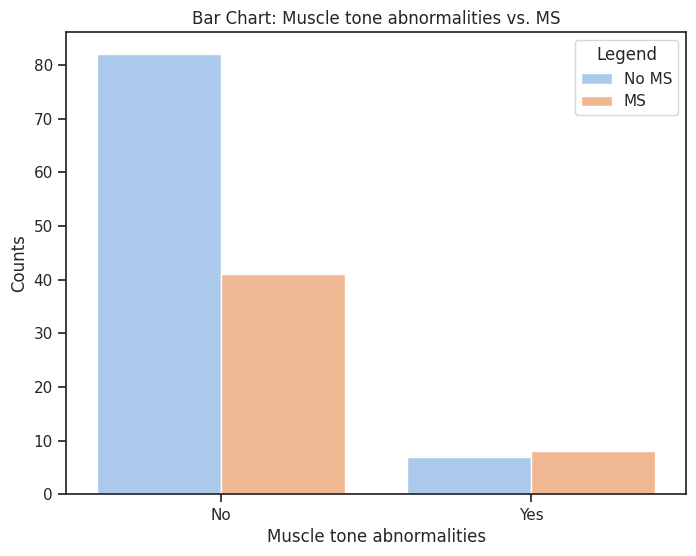

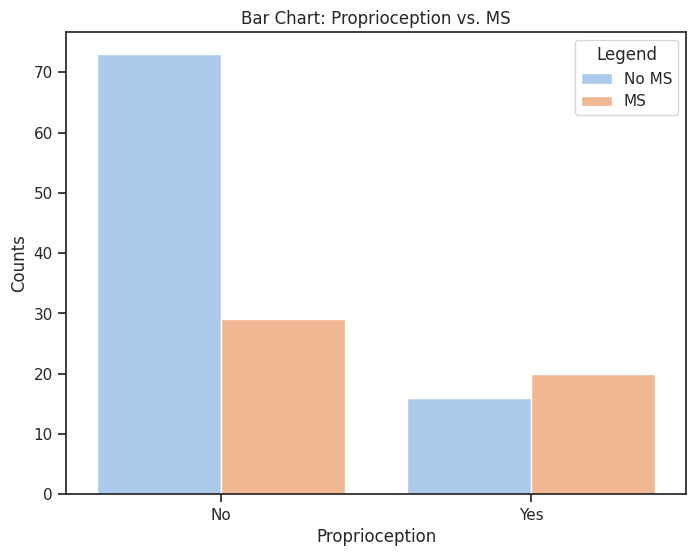

In [ ]:
# Import libraries
import seaborn as sns
import matplotlib.pyplot as plt

# Setting style and palette for plots
sns.set(style="ticks")
sns.set_palette("pastel")

# Plot Bar chart: Sex vs. MS
plt.figure(figsize=(8, 6))
ax = sns.countplot(x='Sex', hue='MS', data=imputed_df)
ax.set_ylabel("Counts")
ax.set_xlabel("Sex")
ax.set_xticklabels(["Female", "Male"])
plt.title("Bar Chart: Sex vs. MS")
plt.legend(title="Legend", labels=["No MS", "MS"])
plt.show()


# Plot Bar chart: General weakness vs. MS
plt.figure(figsize=(8, 6))
ax = sns.countplot(x='General weakness', hue='MS', data=imputed_df)
ax.set_ylabel("Counts")
ax.set_xlabel("General weakness")
ax.set_xticklabels(["No", "Yes"])
plt.title("Bar Chart: General weakness vs. MS")
plt.legend(title="Legend", labels=["No MS", "MS"])
plt.show()


# Plot Bar chart: Cranial Nerve Symptoms vs. MS
plt.figure(figsize=(8, 6))
ax = sns.countplot(x='Cranial Nerve Symptoms', hue='MS', data=imputed_df)
ax.set_ylabel("Counts")
ax.set_xlabel("Cranial Nerve Symptoms")
ax.set_xticklabels(["No", "Yes"])  # Modify x-axis labels
plt.title("Bar Chart: Cranial Nerve Symptoms vs. MS")
plt.legend(title="Legend", labels=["No MS", "MS"])
plt.show()

# Define a function to convert values to 0.0 or 1.0
def convert_to_binary(value):
    if value == 0.0:
        return 0.0
    elif value == 1.0:
        return 1.0
    else:
        return 0.0

# Filter the data and convert the variables to binary values
filtered_df = imputed_df.copy()
filtered_df['MRI lesions indicative of other diseases'] = filtered_df['MRI lesions indicative of other diseases'].apply(convert_to_binary)
filtered_df['Periventricular'] = filtered_df['Periventricular'].apply(convert_to_binary)
filtered_df['MRI spinal lesions'] = filtered_df['MRI spinal lesions'].apply(convert_to_binary)
filtered_df['OCB + in CSF'] = filtered_df['OCB + in CSF'].apply(convert_to_binary)
filtered_df['BAEP +'] = filtered_df['BAEP +'].apply(convert_to_binary)
filtered_df['Pathological reflexes'] = filtered_df['Pathological reflexes'].apply(convert_to_binary)
filtered_df['Muscle tone abnormalities'] = filtered_df['Muscle tone abnormalities'].apply(convert_to_binary)
filtered_df['Proprioception'] = filtered_df['Proprioception'].apply(convert_to_binary)

# Setting style and palette for plots
sns.set(style="ticks")
sns.set_palette("pastel")

# Plot Bar chart for each variable
variables = ['MRI lesions indicative of other diseases', 'Periventricular', 'MRI spinal lesions',
             'OCB + in CSF', 'BAEP +', 'Pathological reflexes', 'Muscle tone abnormalities', 'Proprioception']

for variable in variables:
    plt.figure(figsize=(8, 6))
    ax = sns.countplot(x=variable, hue='MS', data=filtered_df)
    ax.set_ylabel("Counts")
    ax.set_xlabel(variable)
    ax.set_xticklabels(["No", "Yes"])  # Modify x-axis labels
    plt.title(f"Bar Chart: {variable} vs. MS")
    plt.legend(title="Legend", labels=["No MS", "MS"])
    plt.show()


Visualising correlation and multicollinearity as a correlation matrix, heatmap and Seaborn plots

In [ ]:
#Plotting a correlation matrix

#Import libraries
import seaborn as sns
import matplotlib.pyplot as plt

# Concatenate x and y
data = pd.concat([x, y], axis=1)

#Calculate and print the correlation matrix
print("Correlation Matrix")
data.corr()


Correlation Matrix


,Sex,General weakness,Cranial Nerve Symptoms,MRI lesions indicative of other diseases,Periventricular,MRI spinal lesions,OCB + in CSF,BAEP +,Pathological reflexes,Muscle tone abnormalities,Proprioception,MS
Sex,1.000000,-0.186682,0.113312,-0.110560,0.083652,0.117442,-0.063964,-0.011385,0.071856,0.049386,0.037235,0.149906
General weakness,-0.186682,1.000000,-0.034265,-0.019195,0.054778,-0.204313,0.022591,0.027302,-0.220900,-0.117340,-0.036196,0.001454
Cranial Nerve Symptoms,0.113312,-0.034265,1.000000,0.173181,-0.045527,-0.109319,-0.024822,0.049238,0.064291,-0.199424,0.040381,0.061327
MRI lesions indicative of other diseases,-0.110560,-0.019195,0.173181,1.000000,-0.194648,-0.208989,-0.046605,-0.094885,0.174661,0.145874,0.107943,0.092012
Periventricular,0.083652,0.054778,-0.045527,-0.194648,1.000000,-0.187674,0.001096,-0.161956,-0.160738,-0.074033,-0.122544,-0.008120
MRI spinal lesions,0.117442,-0.204313,-0.109319,-0.208989,-0.187674,1.000000,0.416571,0.135498,0.111375,0.022632,0.108183,0.457196
OCB + in CSF,-0.063964,0.022591,-0.024822,-0.046605,0.001096,0.416571,1.000000,0.360770,0.002650,-0.042284,0.162010,0.589130
BAEP +,-0.011385,0.027302,0.049238,-0.094885,-0.161956,0.135498,0.360770,1.000000,0.086663,-0.023446,0.154389,0.349223
Pathological reflexes,0.071856,-0.220900,0.064291,0.174661,-0.160738,0.111375,0.002650,0.086663,1.000000,0.370082,0.234687,0.118929
Muscle tone abnormalities,0.049386,-0.117340,-0.199424,0.145874,-0.074033,0.022632,-0.042284,-0.023446,0.370082,1.000000,0.269365,0.130087


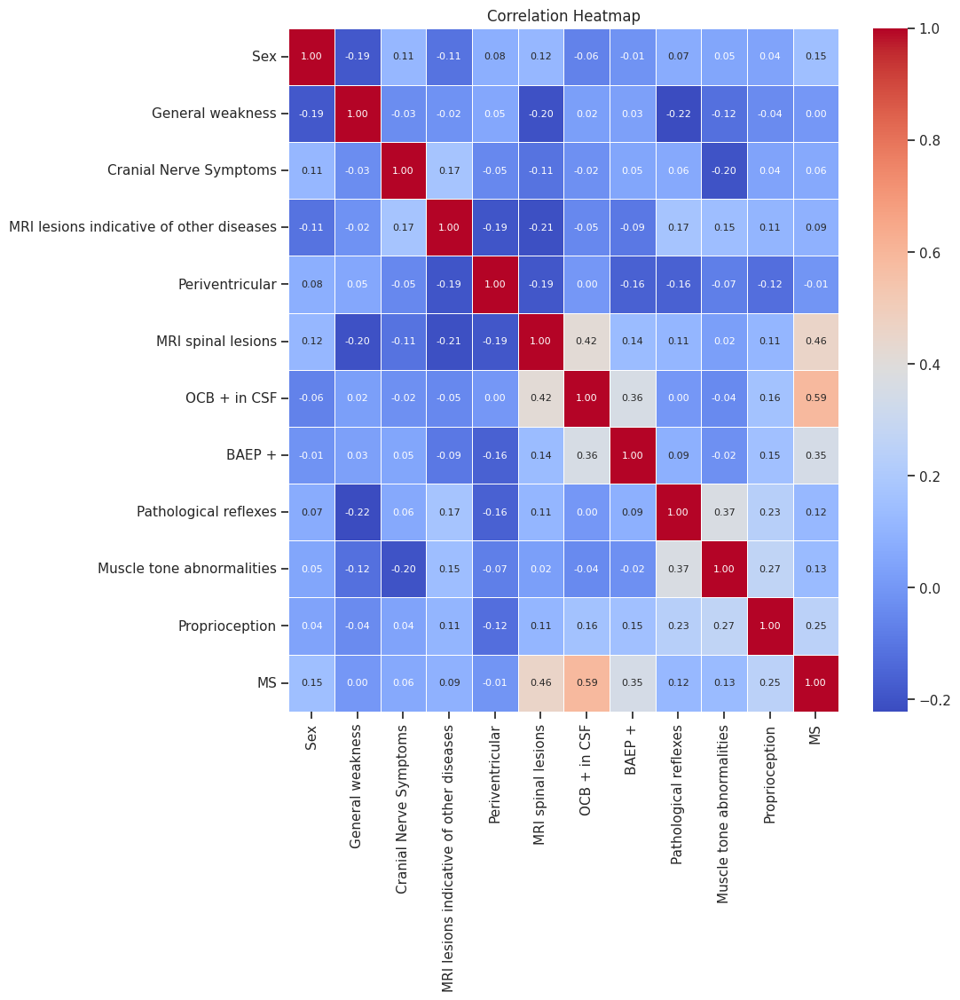

In [ ]:
#Visualise correlation and multicollinearity as a heatmap

#Import libraries
import seaborn as sns
import matplotlib.pyplot as plt

# Concatenate x and y
data = pd.concat([x, y], axis=1)

# Computing the correlation matrix
corr_matrix = data.corr()

# Plotting a heatmap
plt.figure(figsize=(10, 10))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5, annot_kws={"size": 8})
plt.title("Correlation Heatmap")
plt.show()

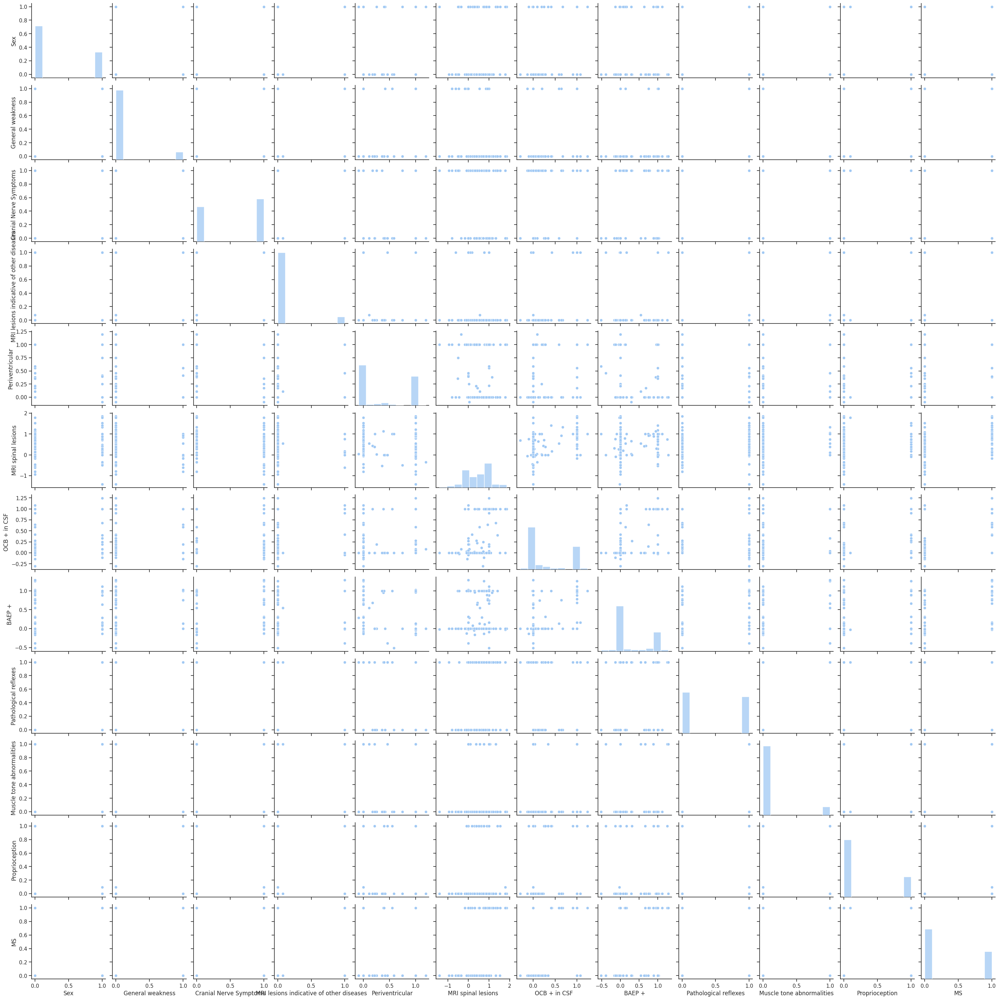

In [ ]:
# Import library
import seaborn as sns

# Concatenate x and y
data = pd.concat([x, y], axis=1)

# Set style and palette for plots
sns.set(style="ticks")
sns.set_palette("pastel")

# Visualise plots
sns.pairplot(data)

plt.show()


In [ ]:
# Print features with multicollinearity
highly_correlated_features = []
abs_corr_matrix = corr_matrix.abs()
for i in range(len(abs_corr_matrix.columns)):
    for j in range(i+1, len(abs_corr_matrix.columns)):
        if abs_corr_matrix.iloc[i, j] > 0.7:
            feature_i = abs_corr_matrix.columns[i]
            feature_j = abs_corr_matrix.columns[j]
            highly_correlated_features.append((feature_i, feature_j))

if len(highly_correlated_features) == 0:
    print("No Multicollinearity Observed")
else:
    print("Features with multicollinearity (absolute correlation coefficient > 0.7):")
    for feature_i, feature_j in highly_correlated_features:
        print(f"{feature_i} - {feature_j}")

No Multicollinearity Observed


Checking for imbalanced classes in the dataset

0.0    64.492754
1.0    35.507246
Name: MS, dtype: float64


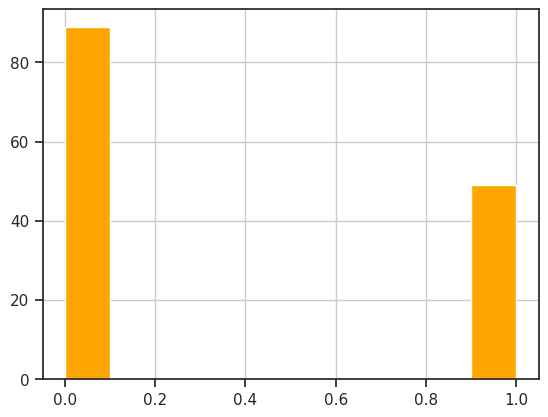

The baseline accuracy is: 0.644927536231884


In [ ]:
# Check if dataset is imbalanced
print(y.value_counts() * 100.0 / len(y))

# Visualise dataset imbalance
import matplotlib.pyplot as plt
y.hist(color=['orange'])
plt.show()

# Find baseline accuracy
from sklearn.dummy import DummyClassifier

clf = DummyClassifier(strategy='most_frequent')
clf.fit(x, y)
baseline_accuracy = clf.score(x, y)
print("The baseline accuracy is:", baseline_accuracy)


##Split data into train and test sets

In [47]:
#Import train_test_split function
from sklearn.model_selection import train_test_split

# Split data into train and test sets with stratification to resolve class imbalances
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=1, stratify=y, shuffle=True)

# Print dimensions
print('x_train:', x_train.shape)
print('x_test:', x_test.shape)
print('y_train:', y_train.shape)
print('y_test:', y_test.shape)

x_train: (110, 11)
x_test: (28, 11)
y_train: (110,)
y_test: (28,)


##Importing Libraries for Following Steps

In [48]:
#Import libraries
from sklearn.metrics import f1_score
import warnings
from sklearn.exceptions import ConvergenceWarning
import numpy as np
from sklearn.model_selection import StratifiedKFold
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import GridSearchCV

# Ignore convergence warnings
warnings.filterwarnings("ignore", category=ConvergenceWarning)

##Hyperparameter tuning

In [49]:
# Define parameters to tune for Logistic Regression Classifier
lr_param_grid = {
    'penalty': ['l1', 'l2', 'elasticnet'],
    'C': [0.1, 0.5, 1.0, 5.0, 10.0],
    'solver': ['liblinear', 'saga', 'newton-cg', 'lbfgs'],
    'class_weight': [None, 'balanced'],
    'random_state': [None, 42]
}


##Stratified K-Fold Cross Validation:

In [50]:
# Creating an instance of StratifiedKFold
lr_skfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=1)

##Training and Model Validation:



In [51]:
# Creating lists to store evaluation metrics for each fold
train_f1_scores = []
val_f1_scores = []

# Iterating over each fold
for train_index, val_index in lr_skfold.split(x_train, y_train):
    x_train_fold, x_val_fold = x_train.iloc[train_index], x_train.iloc[val_index]
    y_train_fold, y_val_fold = y_train.iloc[train_index], y_train.iloc[val_index]

    # Create an instance of Logistic Regression model
    lr = LogisticRegression(random_state=1)

    # Create an instance of GridSearchCV for Logistic Regression Classifier
    lr_cv = GridSearchCV(lr, lr_param_grid, cv=lr_skfold)

    # Fit GridSearchCV on the training fold
    lr_cv.fit(x_train_fold, y_train_fold)

    # Get the best estimator from GridSearchCV
    best_lr_model = lr_cv.best_estimator_

    # Print best parameters and F1 score
    print("Best Parameters:", lr_cv.best_params_)
    print("F1 Score:", lr_cv.best_score_)

    # Fitting the best estimator on the training fold and making predictions
    y_train_pred = best_lr_model.predict(x_train_fold)

    # Calculating F1 score for the train set
    train_f1 = f1_score(y_train_fold, y_train_pred)

    # Appending train F1 score to the list
    train_f1_scores.append(train_f1)

    # Making predictions for the validation fold
    y_val_pred = best_lr_model.predict(x_val_fold)

    # Calculating F1 score for the validation set
    val_f1 = f1_score(y_val_fold, y_val_pred)

    # Appending validation F1 score to the list
    val_f1_scores.append(val_f1)


/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:378: FitFailedWarning: 
600 fits failed out of a total of 1200.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
100 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py", line 1162, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py", line 54, in _check_solver
    raise ValueError(
ValueError: S

Best Parameters: {'C': 5.0, 'class_weight': None, 'penalty': 'l2', 'random_state': None, 'solver': 'liblinear'}
F1 Score: 0.8967320261437909


/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:378: FitFailedWarning: 
600 fits failed out of a total of 1200.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
100 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py", line 1162, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py", line 54, in _check_solver
    raise ValueError(
ValueError: S

Best Parameters: {'C': 0.5, 'class_weight': None, 'penalty': 'l1', 'random_state': None, 'solver': 'liblinear'}
F1 Score: 0.8300653594771242


/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:378: FitFailedWarning: 
600 fits failed out of a total of 1200.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
100 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py", line 1162, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py", line 54, in _check_solver
    raise ValueError(
ValueError: S

Best Parameters: {'C': 5.0, 'class_weight': 'balanced', 'penalty': 'l2', 'random_state': None, 'solver': 'liblinear'}
F1 Score: 0.8300653594771242


/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:378: FitFailedWarning: 
600 fits failed out of a total of 1200.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
100 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py", line 1162, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py", line 54, in _check_solver
    raise ValueError(
ValueError: S

Best Parameters: {'C': 0.5, 'class_weight': None, 'penalty': 'l1', 'random_state': None, 'solver': 'saga'}
F1 Score: 0.7947712418300654
Best Parameters: {'C': 1.0, 'class_weight': 'balanced', 'penalty': 'l2', 'random_state': None, 'solver': 'saga'}
F1 Score: 0.8411764705882353


/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:378: FitFailedWarning: 
600 fits failed out of a total of 1200.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
100 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py", line 1162, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py", line 54, in _check_solver
    raise ValueError(
ValueError: S

##Average F1 Scores and Standard Deviation:

In [52]:
# Calculating the average and standard deviation of F1 scores for train and validation sets
avg_train_f1 = np.mean(train_f1_scores)
std_train_f1 = np.std(train_f1_scores)
avg_val_f1 = np.mean(val_f1_scores)
std_val_f1 = np.std(val_f1_scores)

# Print the average and standard deviation for train and validation F1 scores
print("Average Train F1 Score:", avg_train_f1)
print("Standard Deviation of Train F1 Score:", std_train_f1)
print("Average Validation F1 Score:", avg_val_f1)
print("Standard Deviation of Validation F1 Score:", std_val_f1)


Average Train F1 Score: 0.8052792110996444
Standard Deviation of Train F1 Score: 0.0440725653629721
Average Validation F1 Score: 0.7481829573934837
Standard Deviation of Validation F1 Score: 0.14492474430779217


##Model Predictions on Train and Test Sets:

In [ ]:
# Make predictions on the train set using best model
best_model = lr_cv.best_estimator_
y_train_pred = best_model.predict(x_train)

# Make predictions on the test set using best model
best_model = lr_cv.best_estimator_
y_test_pred = best_model.predict(x_test)

##Visualise Various Classification Metrics

In [ ]:
#Print Classification Report
from sklearn.metrics import classification_report
print("Classification Report of Train Data:")
print(classification_report(y_train, y_train_pred))

print()

print("Classification Report of Test Data: ")
print(classification_report(y_test, y_test_pred))


Classification Report of Train Data:
              precision    recall  f1-score   support

         0.0       0.93      0.87      0.90        71
         1.0       0.79      0.87      0.83        39

    accuracy                           0.87       110
   macro avg       0.86      0.87      0.86       110
weighted avg       0.88      0.87      0.87       110


Classification Report of Test Data: 
              precision    recall  f1-score   support

         0.0       0.88      0.78      0.82        18
         1.0       0.67      0.80      0.73        10

    accuracy                           0.79        28
   macro avg       0.77      0.79      0.78        28
weighted avg       0.80      0.79      0.79        28



Text(0.5, 1.0, 'Confusion Matrix of Test Data')

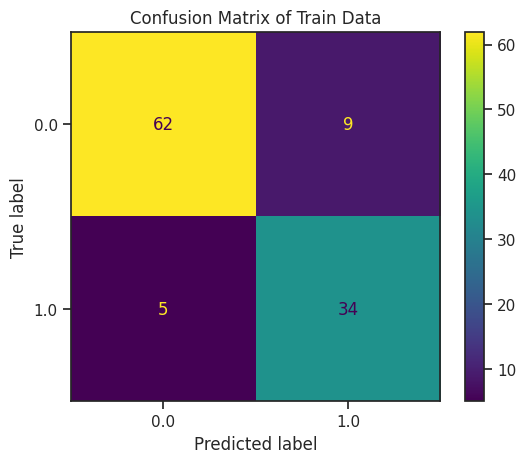

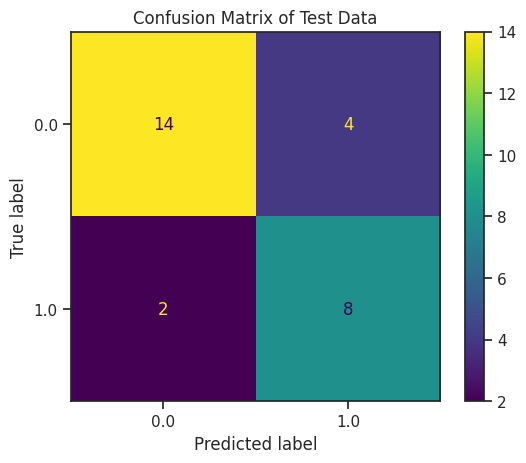

In [ ]:
#Plot Confusion Matrix for Train and Test Data
from sklearn.metrics import ConfusionMatrixDisplay

#Confusion Matrix of Train Data
ConfusionMatrixDisplay.from_predictions(y_train, y_train_pred)
plt.title('Confusion Matrix of Train Data')

#Confusion Matrix of Test Data
ConfusionMatrixDisplay.from_predictions(y_test, y_test_pred)
plt.title('Confusion Matrix of Test Data')

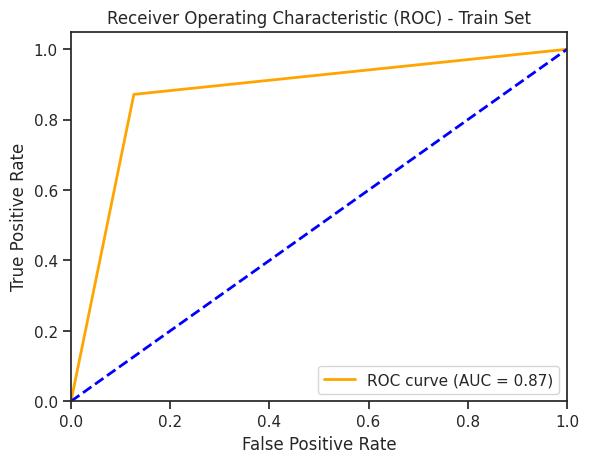

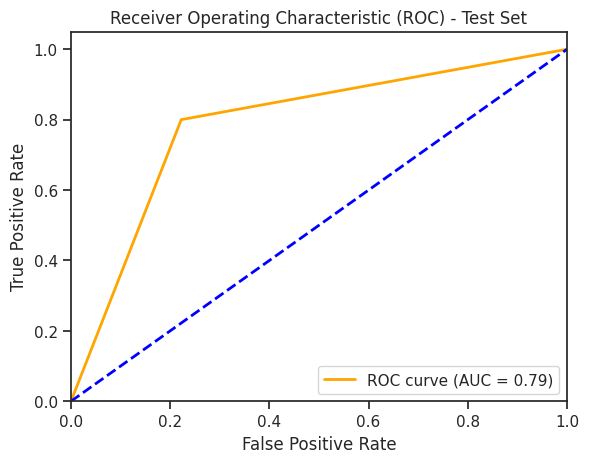

In [ ]:
#Plot ROC Curve for Train and Test Data
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve
from sklearn.metrics import auc

# Map actual "YES" and "NO" values to 1 and 0 respectively
mapping = {1.0: 1, 0.0: 0}
y_train_mapped = [mapping[val] for val in y_train]
y_test_mapped = [mapping[val] for val in y_test]

# Map predicted "YES" and "NO" values to 1 and 0 respectively
y_train_pred_mapped = [mapping[val] for val in y_train_pred]
y_test_pred_mapped = [mapping[val] for val in y_test_pred]

# ROC curve and AUC for train data
fpr_train, tpr_train, thresholds_train = roc_curve(y_train_mapped, y_train_pred_mapped)
roc_auc_train = auc(fpr_train, tpr_train)

# ROC curve and AUC for test data
fpr_test, tpr_test, thresholds_test = roc_curve(y_test_mapped, y_test_pred_mapped)
roc_auc_test = auc(fpr_test, tpr_test)

# Plot ROC curve for train data
plt.figure()
plt.plot(fpr_train, tpr_train, color='orange', lw=2, label='ROC curve (AUC = %0.2f)' % roc_auc_train)
plt.plot([0, 1], [0, 1], color='blue', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) - Train Set')
plt.legend(loc="lower right")

# Plot ROC curve for test data
plt.figure()
plt.plot(fpr_test, tpr_test, color='orange', lw=2, label='ROC curve (AUC = %0.2f)' % roc_auc_test)
plt.plot([0, 1], [0, 1], color='blue', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) - Test Set')
plt.legend(loc="lower right")

plt.show()

##Calculating Feature Importances

Sex: 0.87222
General weakness: 0.41533
Cranial Nerve Symptoms: 0.57140
MRI lesions indicative of other diseases: 1.29909
Periventricular: -0.07948
MRI spinal lesions: 1.43725
OCB + in CSF: 1.65403
BAEP +: 0.97531
Pathological reflexes: -0.38908
Muscle tone abnormalities: 0.87229
Proprioception: 0.46650


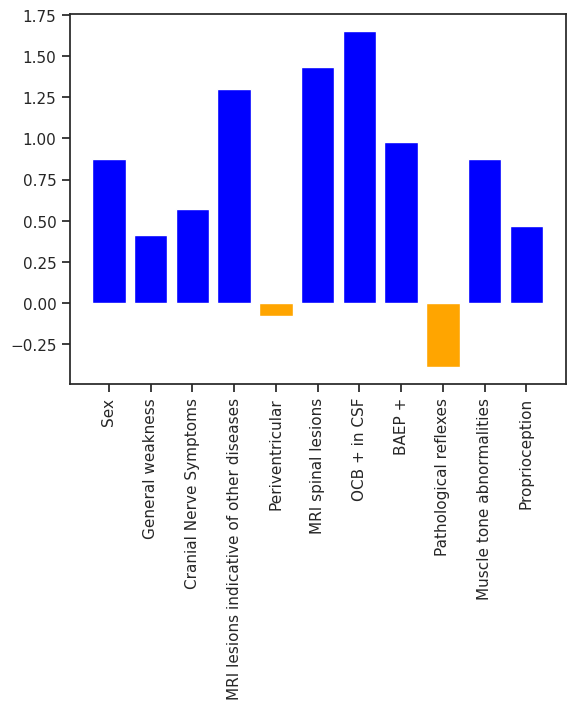

In [ ]:
importance = best_model.coef_[0]

# Summarize feature importance
for i, v in enumerate(importance):
    print('%s: %.5f' % (x_train.columns[i], v))

# Get feature names
feature_names = list(x_train.columns)

# Define colors for each bar
colors = ['blue' if v >= 0 else 'orange' for v in importance]

# Plot feature importances
plt.bar(feature_names, importance, color=colors)
plt.xticks(rotation=90)
plt.show()


#4. Using Only Predictors Identified in the Original Study

##Data Loading

In [ ]:
#Connect to GDrive to load the dataset
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
#Specify file path and load it into a DataFrame
import pandas as pd
data=pd.read_excel('/content/drive/My Drive/Colab Notebooks/Research Project/Research Project Dataset.xlsx')
df=pd.DataFrame(data)

##Data Pre-processing

Ensuring Reproducibility

In [ ]:
# Import libraries
import random
import numpy as np

#Set seed value
random.seed(42)
np.random.seed(42)

Visualising the dataset and its dimensions

In [ ]:
# Visualise the dataset
df.head()

,Nr,Sex,Age,Fatigue,General weakness,Pain,Focal symptoms,Cranial Nerve Symptoms,CN3,CN4,...,Pathological CSF,Increased protein,Increased protein (g/l),Pleocytosis,Pleocytosis (cells/ml),OCB + in CSF,IgG levels in CSF,VEP +,BAEP +,MS
0,2,0,56,0,0,0,1,1,0,0,...,1,0,0.37,0,4,0,,0,0,0
1,3,0,47,0,0,1,1,0,0,0,...,0,0,0.28,0,0,0,22.9,0,1,0
2,4,0,43,0,0,1,1,1,0,0,...,0,0,0.38,0,2,,25.3,1,0,0
3,5,0,39,0,0,1,0,0,0,0,...,0,,,0,1,0,,,,0
4,6,0,61,0,0,1,1,0,0,0,...,1,1,0.57,0,0,1,,1,0,0


In [ ]:
# Number of observations and features in the dataset
print(df.shape)

(138, 44)


Dropping columns not needed for the analysis

In [ ]:
# Remove unnecessary columns
df = df.drop(['Nr', 'Increased protein (g/l)', 'Pleocytosis (cells/ml)', 'Sum of symptoms'], axis=1)

Converting the data type for use by the model

In [ ]:
# Convert all columns to numeric data types
df = df.apply(pd.to_numeric, errors='coerce')

# Check the data types of columns
print(df.dtypes)

Sex                                           int64
Age                                           int64
Fatigue                                       int64
General weakness                              int64
Pain                                          int64
Focal symptoms                                int64
Cranial Nerve Symptoms                        int64
CN3                                           int64
CN4                                           int64
CN5                                           int64
CN6                                           int64
CN8                                           int64
Pathological reflexes                         int64
Babinski's                                    int64
Rossolimo                                     int64
Muscle strength                               int64
Reflex asymmetry                              int64
Muscle tone abnormalities                     int64
Proprioception                              float64
Superficial 

Impute missing data

In [ ]:
#Install library for imputation
!pip install impyute

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
#import library for Multiple Imputation by Chained Equations (MICE)
from impyute.imputation.cs import mice

# impute missing values using MICE
imputed_data = mice(df.values)

# convert imputed data back to a pandas DataFrame
imputed_df = pd.DataFrame(imputed_data, columns=df.columns)

Specify features and target variable

In [ ]:
#Specify x and y
x = imputed_df[['Proprioception', 'MRI spinal lesions', 'OCB + in CSF', 'BAEP +']]
y = imputed_df['MS']

#Print dimensions
print(x.shape)
print(y.shape)

(138, 4)
(138,)


Visualising Relationship between Target Variable and Each Feature in X

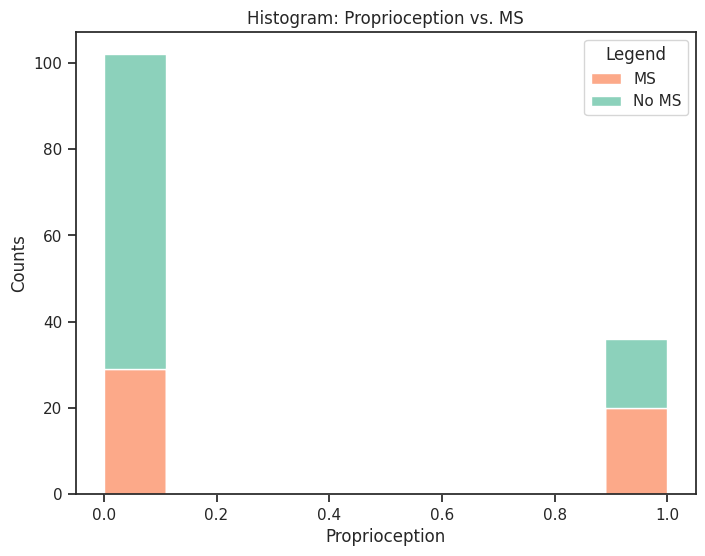

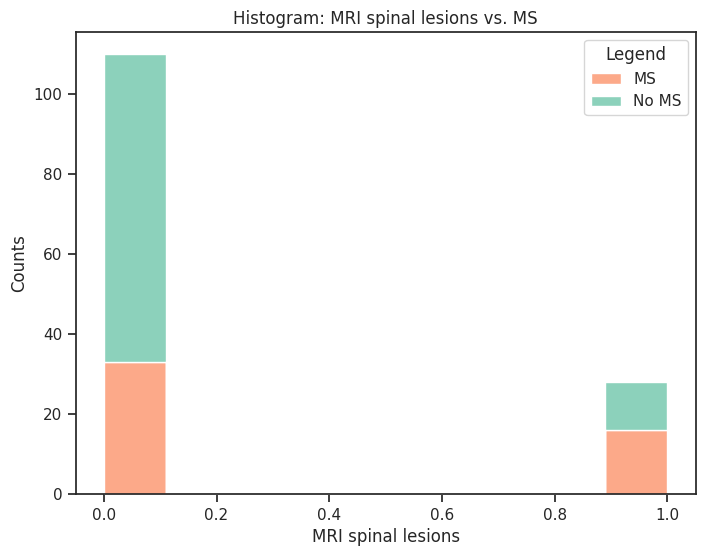

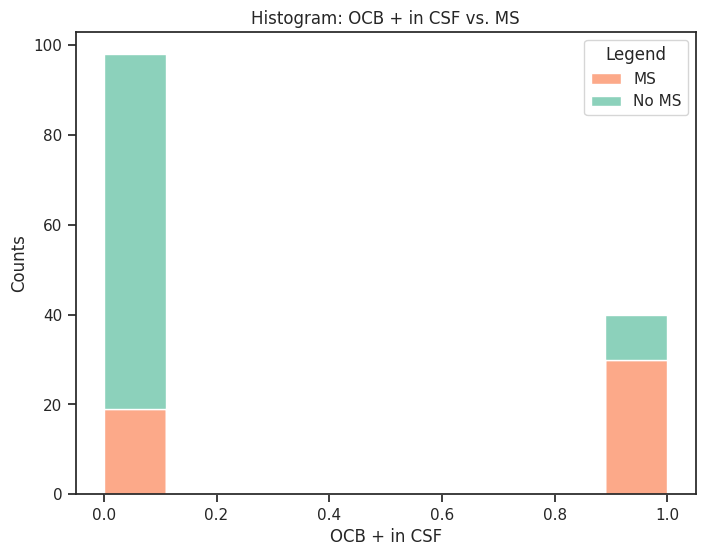

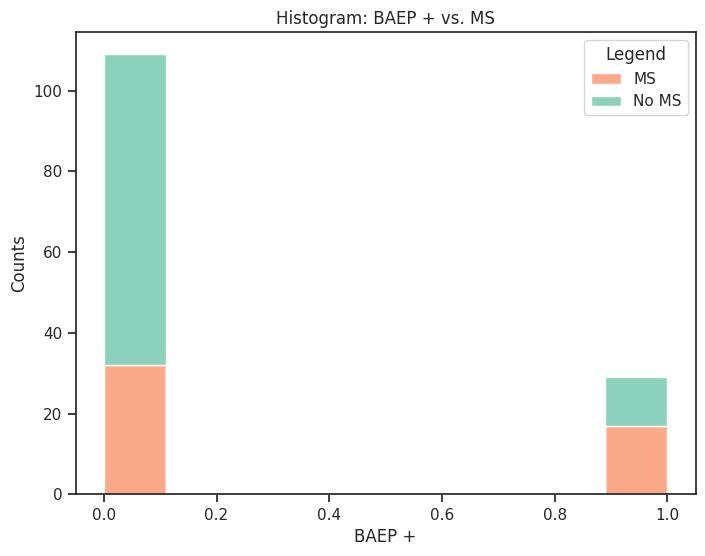

In [ ]:
# Import libraries
import seaborn as sns
import matplotlib.pyplot as plt

# Set style and palette for plots
sns.set(style="ticks")
sns.set_palette("Set2")

# Define a function to convert values to 0.0 or 1.0
def convert_to_binary(value):
    if value == 0.0:
        return 0.0
    elif value == 1.0:
        return 1.0
    else:
        return 0.0  # Convert any unexpected value to 0.0

# Filter the data and convert the variables to binary values
filtered_df = imputed_df.copy()
filtered_df['Proprioception'] = filtered_df['Proprioception'].apply(convert_to_binary)
filtered_df['MRI spinal lesions'] = filtered_df['MRI spinal lesions'].apply(convert_to_binary)
filtered_df['OCB + in CSF'] = filtered_df['OCB + in CSF'].apply(convert_to_binary)
filtered_df['BAEP +'] = filtered_df['BAEP +'].apply(convert_to_binary)

# Plot Histogram for each variable
variables = ['Proprioception', 'MRI spinal lesions', 'OCB + in CSF', 'BAEP +']

for variable in variables:
    plt.figure(figsize=(8, 6))
    sns.histplot(data=filtered_df, x=variable, hue='MS', element="step", multiple="stack")
    plt.xlabel(variable)
    plt.ylabel("Counts")
    plt.title(f"Histogram: {variable} vs. MS")
    plt.legend(title="Legend", labels=["MS", "No MS"])
    plt.show()


Visualising correlation and multicollinearity as a correlation matrix, heatmap and Seaborn plots

In [ ]:
#Plotting a correlation matrix

#Import libraries
import seaborn as sns
import matplotlib.pyplot as plt

# Concatenate x and y
data = pd.concat([x, y], axis=1)

#Calculate and print the correlation matrix
print("Correlation Matrix")
data.corr()


Correlation Matrix


,Proprioception,MRI spinal lesions,OCB + in CSF,BAEP +,MS
Proprioception,1.000000,0.108183,0.162010,0.154389,0.251181
MRI spinal lesions,0.108183,1.000000,0.416571,0.135498,0.457196
OCB + in CSF,0.162010,0.416571,1.000000,0.360770,0.589130
BAEP +,0.154389,0.135498,0.360770,1.000000,0.349223
MS,0.251181,0.457196,0.589130,0.349223,1.000000


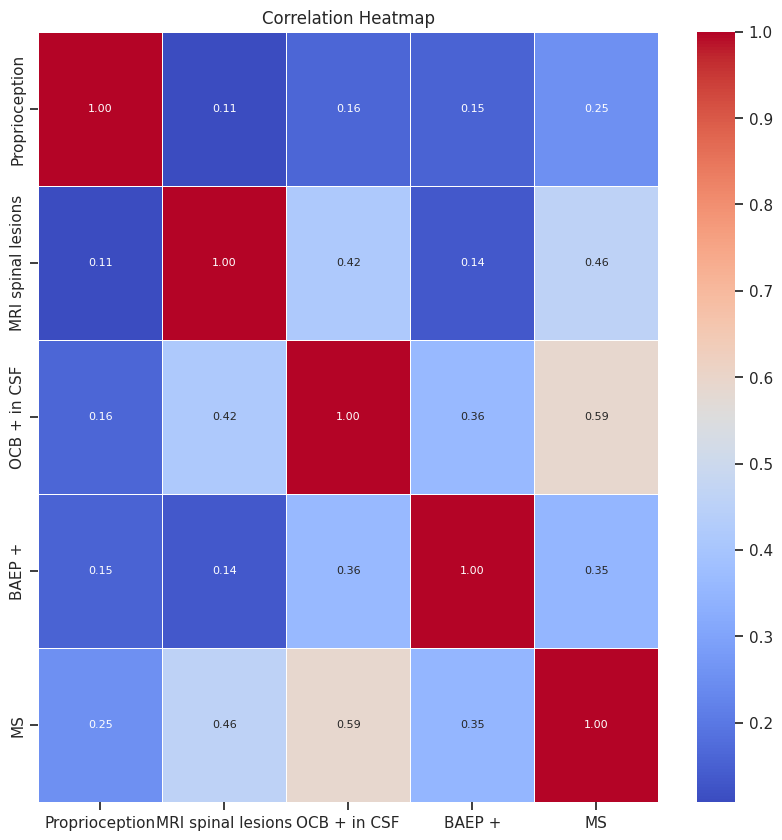

In [ ]:
#Visualise correlation and multicollinearity as a heatmap

#Import libraries
import seaborn as sns
import matplotlib.pyplot as plt

# Concatenate x and y
data = pd.concat([x, y], axis=1)

# Computing the correlation matrix
corr_matrix = data.corr()

# Plotting a heatmap
plt.figure(figsize=(10, 10))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5, annot_kws={"size": 8})
plt.title("Correlation Heatmap")
plt.show()

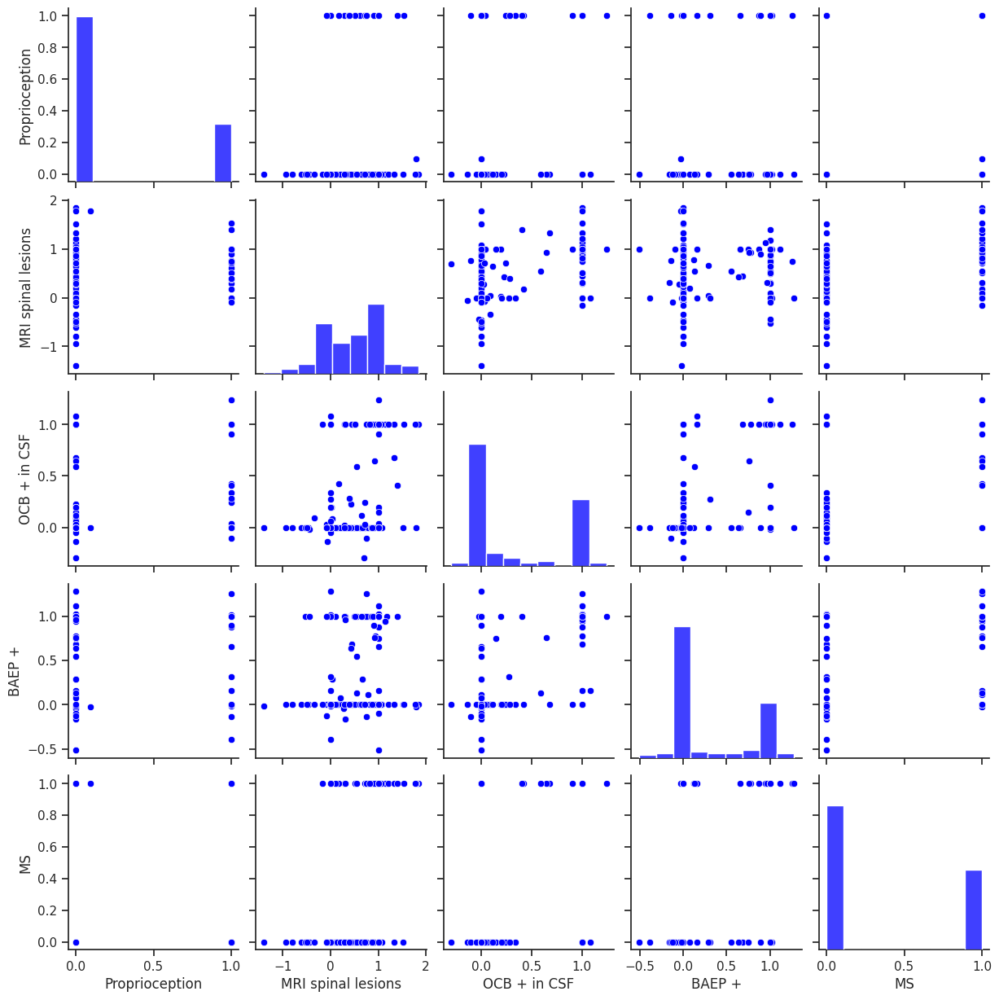

In [ ]:
# Import library
import seaborn as sns

# Concatenate x and y
data = pd.concat([x, y], axis=1)

# Set color
color = 'blue'

# Visualise plots
sns.pairplot(data, diag_kws={'color': color}, plot_kws={'color': color})


In [ ]:
# Print features with multicollinearity
highly_correlated_features = []
abs_corr_matrix = corr_matrix.abs()
for i in range(len(abs_corr_matrix.columns)):
    for j in range(i+1, len(abs_corr_matrix.columns)):
        if abs_corr_matrix.iloc[i, j] > 0.7:
            feature_i = abs_corr_matrix.columns[i]
            feature_j = abs_corr_matrix.columns[j]
            highly_correlated_features.append((feature_i, feature_j))

if len(highly_correlated_features) == 0:
    print("No Multicollinearity Observed")
else:
    print("Features with multicollinearity (absolute correlation coefficient > 0.7):")
    for feature_i, feature_j in highly_correlated_features:
        print(f"{feature_i} - {feature_j}")

No Multicollinearity Observed


Checking for imbalanced classes in the dataset

0.0    64.492754
1.0    35.507246
Name: MS, dtype: float64


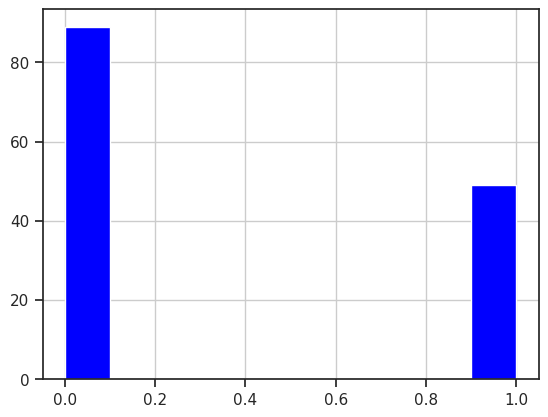

The baseline accuracy is: 0.644927536231884


In [ ]:
# Check if dataset is imbalanced
print(y.value_counts() * 100.0 / len(y))

# Visualize dataset imbalance
import matplotlib.pyplot as plt
y.hist(color=['blue'])
plt.show()

# Find baseline accuracy
from sklearn.dummy import DummyClassifier

clf = DummyClassifier(strategy='most_frequent')
clf.fit(x, y)
baseline_accuracy = clf.score(x, y)
print("The baseline accuracy is:", baseline_accuracy)


##Data Splitting

Split data into train and test sets

In [ ]:
#Import train_test_split function
from sklearn.model_selection import train_test_split

# Split data into train and test sets with stratification to resolve class imbalances
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=1, stratify=y, shuffle=True)

# Print dimensions
print('x_train:', x_train.shape)
print('x_test:', x_test.shape)
print('y_train:', y_train.shape)
print('y_test:', y_test.shape)

x_train: (110, 4)
x_test: (28, 4)
y_train: (110,)
y_test: (28,)


##Importing Libraries for Following Steps

In [ ]:
from sklearn.metrics import f1_score
import warnings
from sklearn.exceptions import ConvergenceWarning
import numpy as np
from sklearn.model_selection import StratifiedKFold
from sklearn.naive_bayes import GaussianNB
from sklearn.model_selection import GridSearchCV

# Ignore convergence warnings
warnings.filterwarnings("ignore", category=ConvergenceWarning)

##Hyperparameter tuning

In [ ]:
# Define parameters to tune for Naive Bayes
nb_param_grid = {'var_smoothing': [1e-12, 1e-11, 1e-10, 1e-9, 1e-8, 1e-7, 1e-6, 1e-5, 1e-4, 1e-3]}



##Stratified K-Fold Cross Validation:

In [ ]:
# Creating an instance of StratifiedKFold
nb_skfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=1)

##Training and Model Validation:



In [ ]:
# Creating lists to store evaluation metrics for each fold
train_f1_scores = []
val_f1_scores = []

# Iterating over each fold
for train_index, val_index in nb_skfold.split(x_train, y_train):
    x_train_fold, x_val_fold = x_train.iloc[train_index], x_train.iloc[val_index]
    y_train_fold, y_val_fold = y_train.iloc[train_index], y_train.iloc[val_index]

    # Create an instance of Logistic Regression model
    nb = GaussianNB()

    # Create an instance of GridSearchCV for Logistic Regression Classifier
    nb_cv = GridSearchCV(nb, nb_param_grid, cv=nb_skfold)

    # Fit GridSearchCV on the training fold
    nb_cv.fit(x_train_fold, y_train_fold)

    # Get the best estimator from GridSearchCV
    best_nb_model = nb_cv.best_estimator_

    # Print best parameters and F1 score
    print("Best Parameters:", nb_cv.best_params_)
    print("F1 Score:", nb_cv.best_score_)

    # Fitting the best estimator on the training fold and making predictions
    y_train_pred = best_nb_model.predict(x_train_fold)

    # Calculating F1 score for the train set
    train_f1 = f1_score(y_train_fold, y_train_pred)

    # Appending train F1 score to the list
    train_f1_scores.append(train_f1)

    # Making predictions for the validation fold
    y_val_pred = best_nb_model.predict(x_val_fold)

    # Calculating F1 score for the validation set
    val_f1 = f1_score(y_val_fold, y_val_pred)

    # Appending validation F1 score to the list
    val_f1_scores.append(val_f1)


Best Parameters: {'var_smoothing': 1e-12}
F1 Score: 0.861437908496732
Best Parameters: {'var_smoothing': 1e-12}
F1 Score: 0.807843137254902
Best Parameters: {'var_smoothing': 1e-12}
F1 Score: 0.7830065359477125
Best Parameters: {'var_smoothing': 1e-12}
F1 Score: 0.7601307189542483
Best Parameters: {'var_smoothing': 1e-12}
F1 Score: 0.761437908496732


##Average F1 Scores and Standard Deviation:

In [ ]:
# Calculating the average and standard deviation of F1 scores for train and validation sets
avg_train_f1 = np.mean(train_f1_scores)
std_train_f1 = np.std(train_f1_scores)
avg_val_f1 = np.mean(val_f1_scores)
std_val_f1 = np.std(val_f1_scores)

# Print the average and standard deviation for train and validation F1 scores
print("Average Train F1 Score:", avg_train_f1)
print("Standard Deviation of Train F1 Score:", std_train_f1)
print("Average Validation F1 Score:", avg_val_f1)
print("Standard Deviation of Validation F1 Score:", std_val_f1)


Average Train F1 Score: 0.7330198651357754
Standard Deviation of Train F1 Score: 0.04011083462963935
Average Validation F1 Score: 0.69
Standard Deviation of Validation F1 Score: 0.16628289148315892


##Model Predictions on Train and Test Sets:

In [ ]:
# Make predictions on the train set using best model
best_model = nb_cv.best_estimator_
y_train_pred = best_model.predict(x_train)

# Make predictions on the test set using best model
best_model = nb_cv.best_estimator_
y_test_pred = best_model.predict(x_test)

##Visualise Various Classification Metrics

In [ ]:
#Print Classification Report
from sklearn.metrics import classification_report
print("Classification Report of Train Data:")
print(classification_report(y_train, y_train_pred))

print()

print("Classification Report of Test Data: ")
print(classification_report(y_test, y_test_pred))


Classification Report of Train Data:
              precision    recall  f1-score   support

         0.0       0.86      0.86      0.86        71
         1.0       0.74      0.74      0.74        39

    accuracy                           0.82       110
   macro avg       0.80      0.80      0.80       110
weighted avg       0.82      0.82      0.82       110


Classification Report of Test Data: 
              precision    recall  f1-score   support

         0.0       0.93      0.78      0.85        18
         1.0       0.69      0.90      0.78        10

    accuracy                           0.82        28
   macro avg       0.81      0.84      0.82        28
weighted avg       0.85      0.82      0.82        28



Text(0.5, 1.0, 'Confusion Matrix of Test Data')

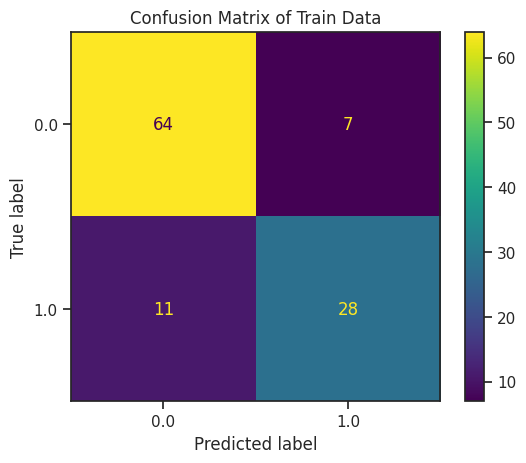

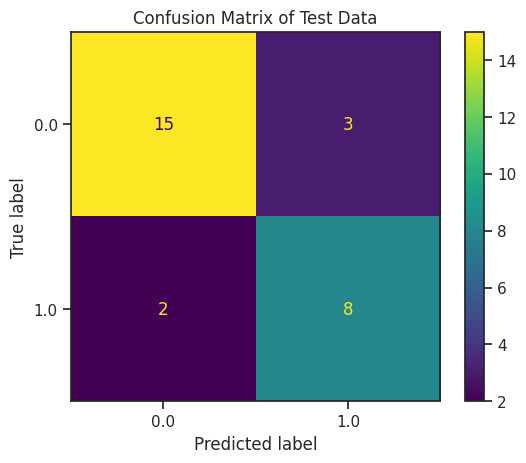

In [ ]:
#Plot Confusion Matrix for Train and Test Data
from sklearn.metrics import ConfusionMatrixDisplay

#Confusion Matrix of Train Data
ConfusionMatrixDisplay.from_predictions(y_train, y_train_pred)
plt.title('Confusion Matrix of Train Data')

#Confusion Matrix of Test Data
ConfusionMatrixDisplay.from_predictions(y_test, y_test_pred)
plt.title('Confusion Matrix of Test Data')

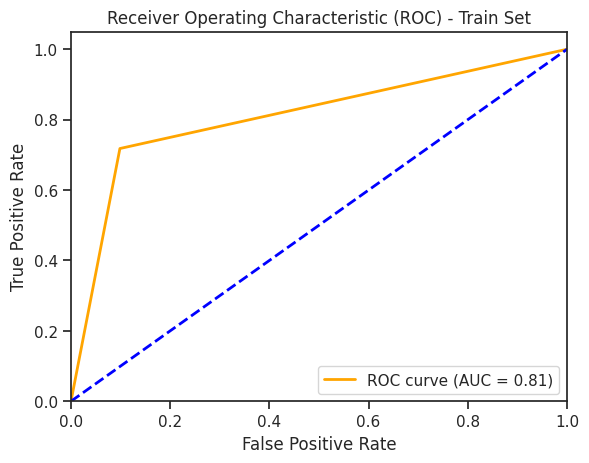

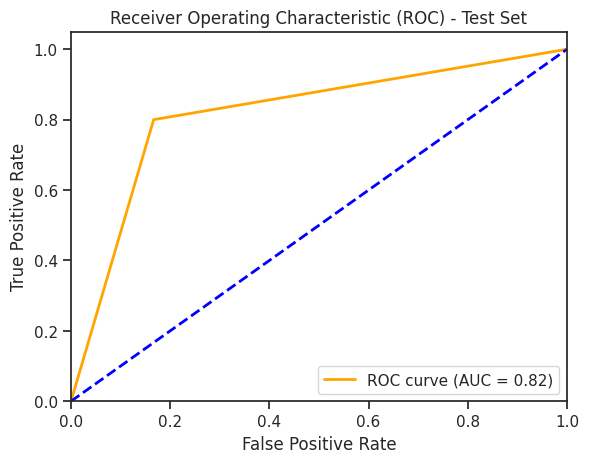

In [ ]:
#Plot ROC Curve for Train and Test Data
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve
from sklearn.metrics import auc

# Map actual "YES" and "NO" values to 1 and 0 respectively
mapping = {1.0: 1, 0.0: 0}
y_train_mapped = [mapping[val] for val in y_train]
y_test_mapped = [mapping[val] for val in y_test]

# Map predicted "YES" and "NO" values to 1 and 0 respectively
y_train_pred_mapped = [mapping[val] for val in y_train_pred]
y_test_pred_mapped = [mapping[val] for val in y_test_pred]

# ROC curve and AUC for train data
fpr_train, tpr_train, thresholds_train = roc_curve(y_train_mapped, y_train_pred_mapped)
roc_auc_train = auc(fpr_train, tpr_train)

# ROC curve and AUC for test data
fpr_test, tpr_test, thresholds_test = roc_curve(y_test_mapped, y_test_pred_mapped)
roc_auc_test = auc(fpr_test, tpr_test)

# Plot ROC curve for train data
plt.figure()
plt.plot(fpr_train, tpr_train, color='orange', lw=2, label='ROC curve (AUC = %0.2f)' % roc_auc_train)
plt.plot([0, 1], [0, 1], color='blue', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) - Train Set')
plt.legend(loc="lower right")

# Plot ROC curve for test data
plt.figure()
plt.plot(fpr_test, tpr_test, color='orange', lw=2, label='ROC curve (AUC = %0.2f)' % roc_auc_test)
plt.plot([0, 1], [0, 1], color='blue', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) - Test Set')
plt.legend(loc="lower right")

plt.show()

##Calculate Feature Importance Scores

Proprioception: 0.11124
MRI spinal lesions: 0.38979
OCB + in CSF: 0.44046
BAEP +: 0.30248


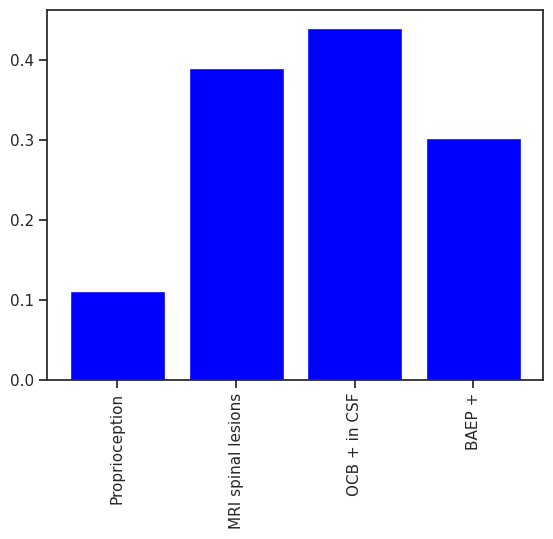

In [ ]:
importance = best_model.coef_[0]

# Summarize feature importance
for i, v in enumerate(importance):
    print('%s: %.5f' % (x_train.columns[i], v))

# Get feature names
feature_names = list(x_train.columns)

# Define colors for each bar
colors = ['blue' if v >= 0 else 'orange' for v in importance]

# Plot feature importances
plt.bar(feature_names, importance, color=colors)
plt.xticks(rotation=90)
plt.show()



#5. Testing on Mexican Dataset

In [ ]:
#Connect to GDrive to load the dataset
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
#Specify file paths and load them into DataFrames
import pandas as pd
train_data=pd.read_excel('/content/drive/My Drive/Colab Notebooks/Research Project/Research Project Dataset.xlsx')
df_train=pd.DataFrame(train_data)
test_data=pd.read_excel('/content/drive/My Drive/Colab Notebooks/Research Project/Updated Mexican Research Dataset.xlsx')
df_test=pd.DataFrame(test_data)

##Data Pre-processing

Ensuring Reproducibility

In [ ]:
# Import libraries
import random
import numpy as np

#Set seed value
random.seed(42)
np.random.seed(42)

Visualising the datasets and their dimensions

In [ ]:
# Visualise the train dataset
df_train.head(400)

,Nr,Sex,Age,Fatigue,General weakness,Pain,Focal symptoms,Cranial Nerve Symptoms,CN3,CN4,...,Pathological CSF,Increased protein,Increased protein (g/l),Pleocytosis,Pleocytosis (cells/ml),OCB + in CSF,IgG levels in CSF,VEP +,BAEP +,MS
0,2,0,56,0,0,0,1,1,0,0,...,1,0,0.37,0,4,0,,0,0,0
1,3,0,47,0,0,1,1,0,0,0,...,0,0,0.28,0,0,0,22.9,0,1,0
2,4,0,43,0,0,1,1,1,0,0,...,0,0,0.38,0,2,,25.3,1,0,0
3,5,0,39,0,0,1,0,0,0,0,...,0,,,0,1,0,,,,0
4,6,0,61,0,0,1,1,0,0,0,...,1,1,0.57,0,0,1,,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
133,165,0,65,0,0,0,1,0,0,0,...,,,NaN,,NaN,,,1,0,0
134,166,1,61,0,0,0,0,1,1,0,...,1,1,0.96,1,6,0,117,,,0
135,167,0,28,0,1,1,0,0,0,0,...,0,0,0.23,0,4,,,0,,1
136,169,0,22,0,0,0,1,0,0,0,...,0,0,0.16,0,4,1,14.9,0,0,1


In [ ]:
# Visualise the test dataset
df_test.head(400)

,Nr,Sex,Age,OCB + in CSF,VEP +,BAEP +,Periventricular,MRI spinal lesions,MRI infratentorial lesions,MS
0,1,1,34,0.0,0,0,0,1,0,1
1,2,1,61,1.0,1,0,0,1,0,1
2,3,1,22,1.0,0,0,0,0,0,1
3,4,0,41,1.0,1,0,1,0,0,1
4,5,0,34,0.0,0,0,1,0,0,1
...,...,...,...,...,...,...,...,...,...,...
267,268,0,31,0.0,0,0,0,0,0,0
268,269,1,21,1.0,0,0,0,1,0,0
269,270,0,19,0.0,1,0,0,1,0,0
270,271,0,32,1.0,1,0,1,0,1,0


In [ ]:
# Number of observations and features in both datasets
print("The train dataset dimensions are: ")
print(df_train.shape)
print("The test dataset dimensions are: ")
print(df_test.shape)

The train dataset dimensions are: 
(138, 44)
The test dataset dimensions are: 
(272, 10)


Dropping columns not needed for the analysis

In [ ]:
# Remove unnecessary columns from train dataset
df_train = df_train.drop(['Nr','Age', 'Fatigue',	'General weakness',	'Pain',	'Focal symptoms',	'Cranial Nerve Symptoms','CN3',	'CN4'	,'CN5',	'CN6',	'CN8',	'Pathological reflexes',	"Babinski's",	'Rossolimo',	'Muscle strength',	'Reflex asymmetry',	'Muscle tone abnormalities',	'Proprioception',	'Superficial sensation',	'Coordination',	'Balance',	'Urinary incontinence',	'Urine retention',	'Vertigo',	'Sum of symptoms',	'MRI lesions specific to MS',	'MRI lesions indicative of other diseases',	'Unspecified MRI lesions',	'MRI infratentorial lesions',	'Periventricular',	'Juxtacortical',		'Pathological CSF','Increased protein', 'Increased protein (g/l)',	'Pleocytosis',	'Pleocytosis (cells/ml)',		'IgG levels in CSF',	'VEP +'		], axis=1)


In [ ]:
# Remove unnecessary columns from test dataset
df_test = df_test.drop(['Nr','VEP +','Age', 'Periventricular', 'MRI infratentorial lesions'], axis=1)

Converting the data type for use by the model

In [ ]:
# Convert all columns to numeric data types
df_train = df_train.apply(pd.to_numeric, errors='coerce')
df_test = df_test.apply(pd.to_numeric, errors='coerce')

# Check the data types of columns
print("Data types of Train Dataset Columns: ")
print(df_train.dtypes)
print()
print("Data types of Test Dataset Columns: ")
print(df_train.dtypes)

Data types of Train Dataset Columns: 
Sex                     int64
MRI spinal lesions    float64
OCB + in CSF          float64
BAEP +                float64
MS                      int64
dtype: object

Data types of Test Dataset Columns: 
Sex                     int64
MRI spinal lesions    float64
OCB + in CSF          float64
BAEP +                float64
MS                      int64
dtype: object


Impute missing data

In [ ]:
#Install library for imputation
!pip install impyute

In [ ]:
#import library for Multiple Imputation by Chained Equations (MICE)
from impyute.imputation.cs import mice

# impute missing values using MICE
imputed_train = mice(df_train.values)
imputed_test = mice(df_test.values)

# convert imputed data back to a pandas DataFrame
imputed_df_train = pd.DataFrame(imputed_train, columns=df_train.columns)
imputed_df_test = pd.DataFrame(imputed_test, columns=df_test.columns)

Specify features and target variable

In [ ]:
#Specify x and y in both datasets
x_train =imputed_df_train[['Sex',  'MRI spinal lesions', 'BAEP +', 'OCB + in CSF']]  # Features in Dataset 1
y_train =imputed_df_train['MS']  # Target variable in Dataset 1

x_test = imputed_df_test[['Sex', 'MRI spinal lesions', 'BAEP +', 'OCB + in CSF']]  # Features in Dataset 2
y_test = imputed_df_test['MS']  # Target variable in Dataset 2


#Print train dimensions
print(x_train.shape)
print(y_train.shape)

#Print test dimensions
print(x_test.shape)
print(y_test.shape)

(138, 4)
(138,)
(272, 4)
(272,)


Visualising Relationship between Target Variable and Each Feature in x

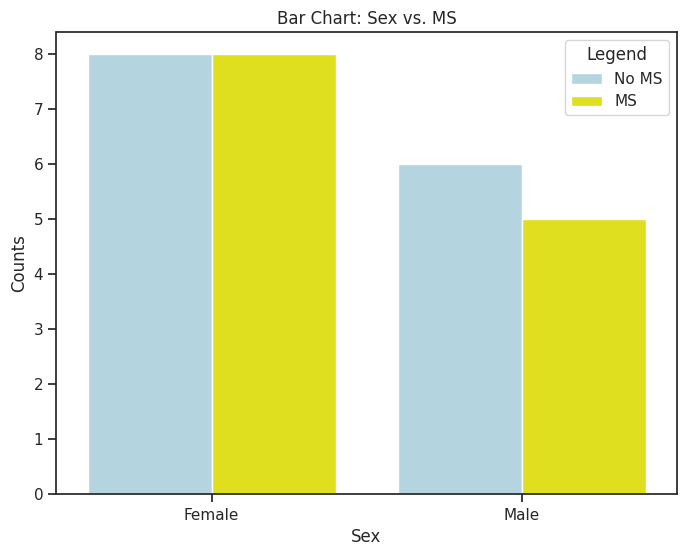

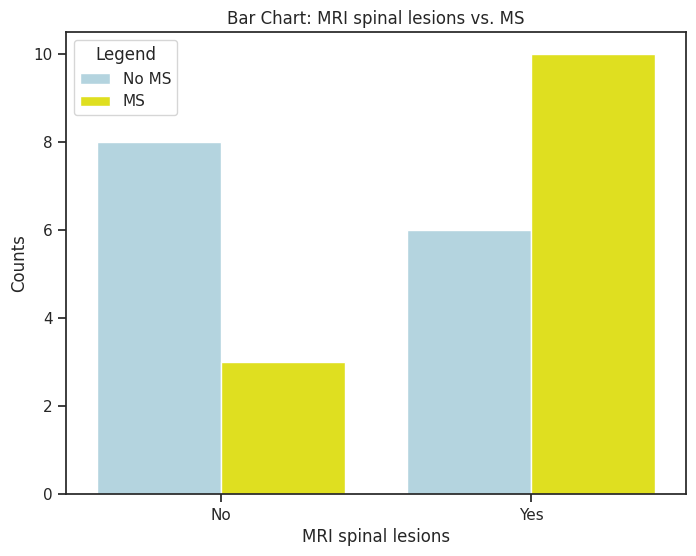

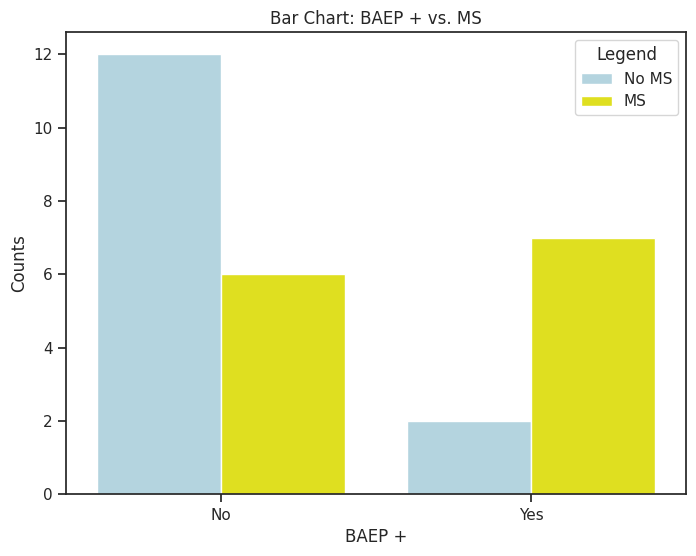

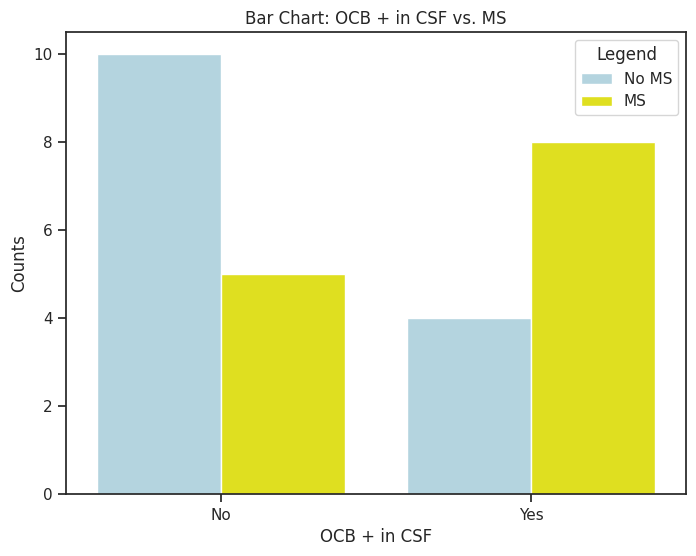

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Setting style and palette for plots
sns.set(style="ticks")
sns.set_palette(["lightblue", "yellow"])

# Define a function to convert values to 0.0 or 1.0
def convert_to_binary(value):
    if value == 0.0:
        return 0.0
    elif value == 1.0:
        return 1.0
    else:
        return None

# Filter the data and convert the variables to binary values
filtered_df = imputed_df_train.copy()
filtered_df['Sex'] = filtered_df['Sex'].apply(convert_to_binary)
filtered_df['MRI spinal lesions'] = filtered_df['MRI spinal lesions'].apply(convert_to_binary)
filtered_df['OCB + in CSF'] = filtered_df['OCB + in CSF'].apply(convert_to_binary)
filtered_df['BAEP +'] = filtered_df['BAEP +'].apply(convert_to_binary)

# Remove rows with null values
filtered_df = filtered_df.dropna()

# Plot Bar chart for each variable
variables = ['Sex', 'MRI spinal lesions', 'BAEP +', 'OCB + in CSF']

for variable in variables:
    plt.figure(figsize=(8, 6))
    ax = sns.countplot(x=variable, hue='MS', data=filtered_df)
    ax.set_ylabel("Counts")
    ax.set_xlabel(variable)
    if variable == 'Sex':
        ax.set_xticklabels(["Female", "Male"])
    else:
        ax.set_xticklabels(["No", "Yes"])
    plt.title(f"Bar Chart: {variable} vs. MS")
    plt.legend(title="Legend", labels=["No MS", "MS"])
    plt.show()




Visualising correlation and multicollinearity in the train dataset (x) as a correlation matrix, heatmap and Seaborn plots

In [ ]:
# Import libraries
import pandas as pd

# Calculate the correlation matrix
corr_matrix = imputed_df_train[['Sex', 'BAEP +', 'MRI spinal lesions', 'OCB + in CSF', 'MS']].corr()

# Display the correlation table
corr_table = corr_matrix.style.set_properties(**{'background-color': 'transparent'})

# Display the correlation table
print("Correlation Matrix: ")
corr_table

Correlation Matrix: 


,Sex,BAEP +,MRI spinal lesions,OCB + in CSF,MS
Sex,1.000000,0.060780,0.141574,-0.109466,0.149906
BAEP +,0.060780,1.000000,-0.065796,0.359631,0.354526
MRI spinal lesions,0.141574,-0.065796,1.000000,0.716623,0.597938
OCB + in CSF,-0.109466,0.359631,0.716623,1.000000,0.586713
MS,0.149906,0.354526,0.597938,0.586713,1.000000


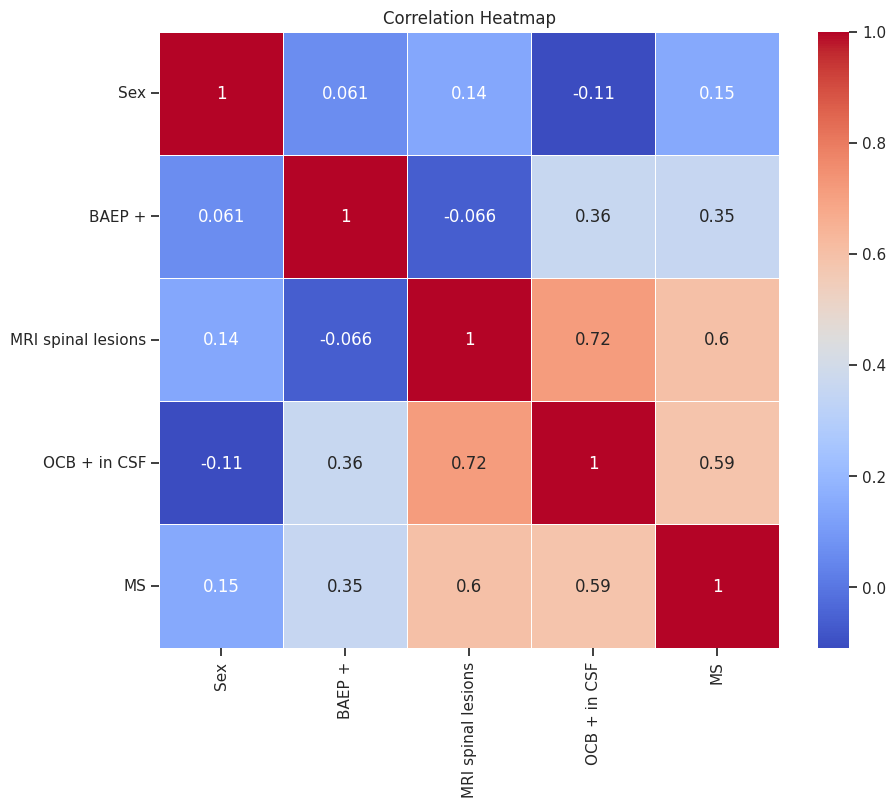

In [ ]:
#Import libraries
import seaborn as sns
import matplotlib.pyplot as plt

# Calculate the correlation matrix
corr_matrix = imputed_df_train[['Sex', 'BAEP +', 'MRI spinal lesions', 'OCB + in CSF', 'MS']].corr()

# Plot the correlation matrix using a heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Correlation Heatmap')
plt.xticks(rotation=90)
plt.yticks(rotation=0)
plt.show()


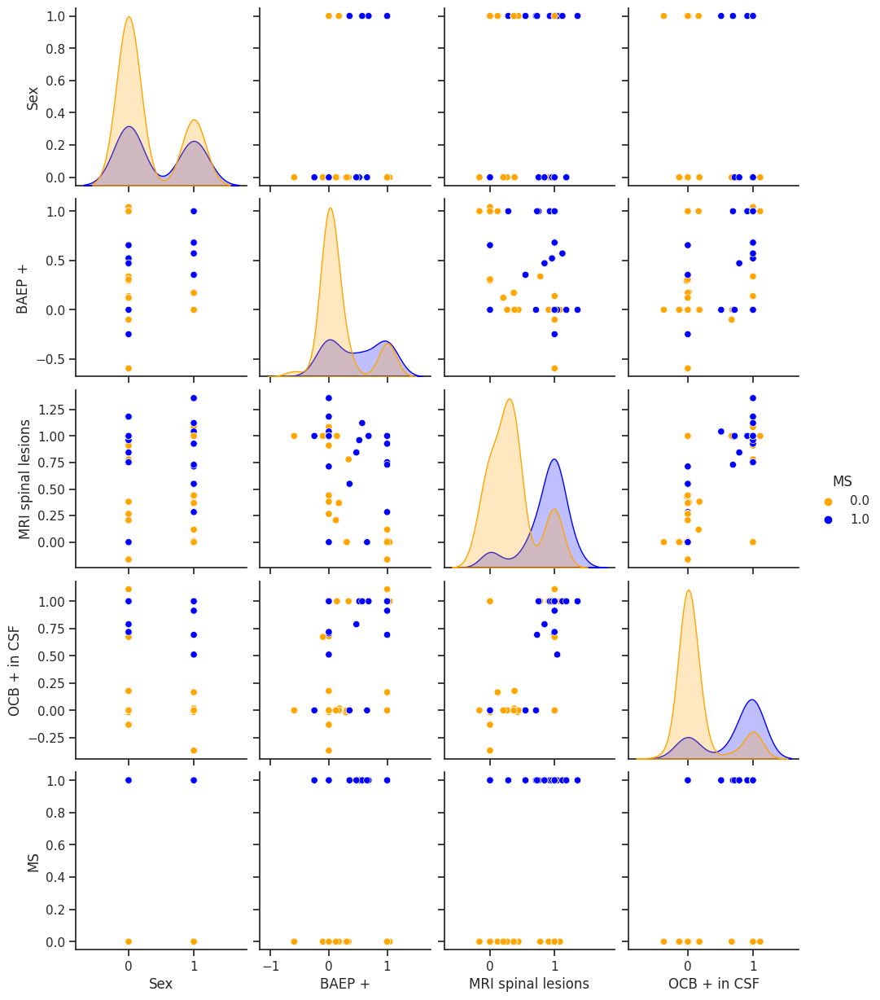

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Specify the features and target variable
selected_features = ['Sex', 'BAEP +', 'MRI spinal lesions', 'OCB + in CSF']
target_variable = 'MS'

# Concatenate the selected features and the target variable
data = imputed_df_train[selected_features + [target_variable]]

# Set the color palette
colors = ["orange", "blue"]

# Plot pairwise relationships
sns.pairplot(data, x_vars=selected_features, y_vars=selected_features + [target_variable], hue=target_variable, palette=colors)
plt.show()


In [ ]:
# Print features with multicollinearity
highly_correlated_features = []
abs_corr_matrix = imputed_df_train[selected_features].corr().abs()

for i in range(len(abs_corr_matrix.columns)):
    for j in range(i + 1, len(abs_corr_matrix.columns)):
        if abs_corr_matrix.iloc[i, j] > 0.7:
            feature_i = abs_corr_matrix.columns[i]
            feature_j = abs_corr_matrix.columns[j]
            highly_correlated_features.append((feature_i, feature_j))

if len(highly_correlated_features) == 0:
    print("No Multicollinearity Observed")
else:
    print("Features with multicollinearity (absolute correlation coefficient > 0.7):")
    for feature_i, feature_j in highly_correlated_features:
        print(f"{feature_i} - {feature_j}")


Features with multicollinearity (absolute correlation coefficient > 0.7):
MRI spinal lesions - OCB + in CSF


Checking for imbalanced classes in the dataset

0.0    64.492754
1.0    35.507246
Name: MS, dtype: float64


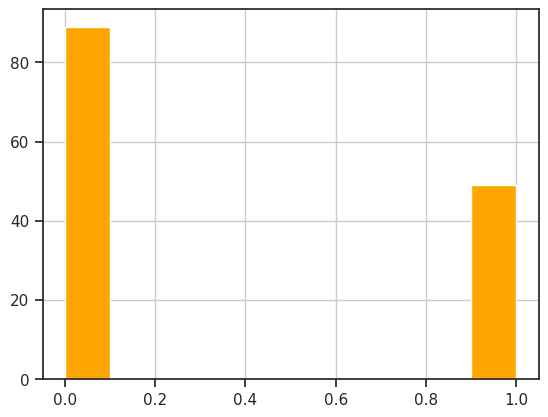

The baseline accuracy is: 0.644927536231884


In [ ]:
# Check if dataset is imbalanced
print(imputed_df_train['MS'].value_counts() * 100.0 / len(imputed_df_train['MS']))

# Visualise dataset imbalance
import matplotlib.pyplot as plt
imputed_df_train['MS'].hist(color='orange')
plt.show()

# Find baseline accuracy
from sklearn.dummy import DummyClassifier

features = imputed_df_train[selected_features]
outcome = imputed_df_train['MS']

clf = DummyClassifier(strategy='most_frequent')
clf.fit(features, outcome)
baseline_accuracy = clf.score(features, outcome)
print("The baseline accuracy is:", baseline_accuracy)


#Data splitting not done as y is a new dataset

##Importing Libraries for Following Steps

In [ ]:
from sklearn.metrics import f1_score
import warnings
from sklearn.exceptions import ConvergenceWarning
import numpy as np
from sklearn.model_selection import StratifiedKFold
from sklearn.naive_bayes import GaussianNB
from sklearn.model_selection import GridSearchCV

# Ignore convergence warnings
warnings.filterwarnings("ignore", category=ConvergenceWarning)

##Hyperparameter tuning

In [ ]:
# Define parameters to tune for Naive Bayes
nb_param_grid = {'var_smoothing': [1e-12, 1e-11, 1e-10, 1e-9, 1e-8, 1e-7, 1e-6, 1e-5, 1e-4, 1e-3]}


##Stratified K-Fold Cross Validation:

In [ ]:
# Creating an instance of StratifiedKFold
nb_skfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=1)

##Training and Model Validation:



In [ ]:
# Creating lists to store evaluation metrics for each fold
train_f1_scores = []
val_f1_scores = []

# Iterating over each fold
for train_index, val_index in nb_skfold.split(x_train, y_train):
    x_train_fold, x_val_fold = x_train.iloc[train_index], x_train.iloc[val_index]
    y_train_fold, y_val_fold = y_train.iloc[train_index], y_train.iloc[val_index]

    # Create an instance of Logistic Regression model
    nb = GaussianNB()

    # Create an instance of GridSearchCV for Logistic Regression Classifier
    nb_cv = GridSearchCV(nb, nb_param_grid, cv=nb_skfold)

    # Fit GridSearchCV on the training fold
    nb_cv.fit(x_train_fold, y_train_fold)

    # Get the best estimator from GridSearchCV
    best_nb_model = nb_cv.best_estimator_

    # Print best parameters and F1 score
    print("Best Parameters:", nb_cv.best_params_)
    print("F1 Score:", nb_cv.best_score_)

    # Fitting the best estimator on the training fold and making predictions
    y_train_pred = best_nb_model.predict(x_train_fold)

    # Calculating F1 score for the train set
    train_f1 = f1_score(y_train_fold, y_train_pred)

    # Appending train F1 score to the list
    train_f1_scores.append(train_f1)

    # Making predictions for the validation fold
    y_val_pred = best_nb_model.predict(x_val_fold)

    # Calculating F1 score for the validation set
    val_f1 = f1_score(y_val_fold, y_val_pred)

    # Appending validation F1 score to the list
    val_f1_scores.append(val_f1)


Best Parameters: {'var_smoothing': 1e-12}
F1 Score: 0.8272727272727274
Best Parameters: {'var_smoothing': 1e-12}
F1 Score: 0.8454545454545455
Best Parameters: {'var_smoothing': 1e-12}
F1 Score: 0.7909090909090909
Best Parameters: {'var_smoothing': 1e-12}
F1 Score: 0.8189723320158102
Best Parameters: {'var_smoothing': 1e-12}
F1 Score: 0.8375494071146246


##Average F1 Scores and Standard Deviation:

In [ ]:
# Calculating the average and standard deviation of F1 scores for train and validation sets
avg_train_f1 = np.mean(train_f1_scores)
std_train_f1 = np.std(train_f1_scores)
avg_val_f1 = np.mean(val_f1_scores)
std_val_f1 = np.std(val_f1_scores)

# Print the average and standard deviation for train and validation F1 scores
print("Average Train F1 Score:", avg_train_f1)
print("Standard Deviation of Train F1 Score:", std_train_f1)
print("Average Validation F1 Score:", avg_val_f1)
print("Standard Deviation of Validation F1 Score:", std_val_f1)



Average Train F1 Score: 0.756985718322605
Standard Deviation of Train F1 Score: 0.033350501590247994
Average Validation F1 Score: 0.7611408199643493
Standard Deviation of Validation F1 Score: 0.12102323544401539


##Model Predictions on Train and Test Sets:

In [ ]:
# Make predictions on the train set using best model
best_model = nb_cv.best_estimator_
y_train_pred = best_model.predict(x_train)

# Make predictions on the test set using best model
best_model = nb_cv.best_estimator_
y_test_pred = best_model.predict(x_test)

##Visualise Various Classification Metrics

In [ ]:
#Print Classification Report
from sklearn.metrics import classification_report
print("Classification Report of Train Data:")
print(classification_report(y_train, y_train_pred))

print()

print("Classification Report of Test Data: ")
print(classification_report(y_test, y_test_pred))


Classification Report of Train Data:
              precision    recall  f1-score   support

         0.0       0.87      0.89      0.88        89
         1.0       0.79      0.76      0.77        49

    accuracy                           0.84       138
   macro avg       0.83      0.82      0.82       138
weighted avg       0.84      0.84      0.84       138


Classification Report of Test Data: 
              precision    recall  f1-score   support

         0.0       0.59      0.92      0.72       148
         1.0       0.71      0.23      0.35       124

    accuracy                           0.61       272
   macro avg       0.65      0.58      0.53       272
weighted avg       0.64      0.61      0.55       272



Text(0.5, 1.0, 'Confusion Matrix of Test Data')

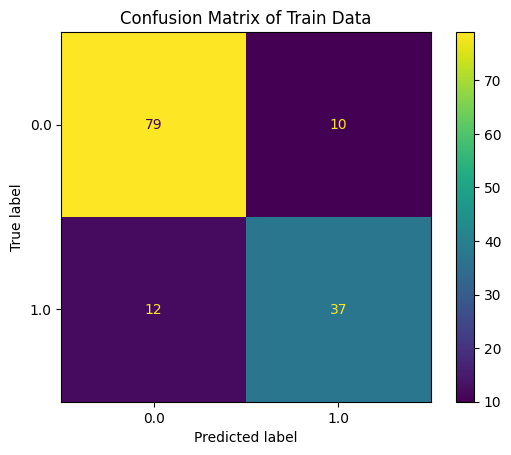

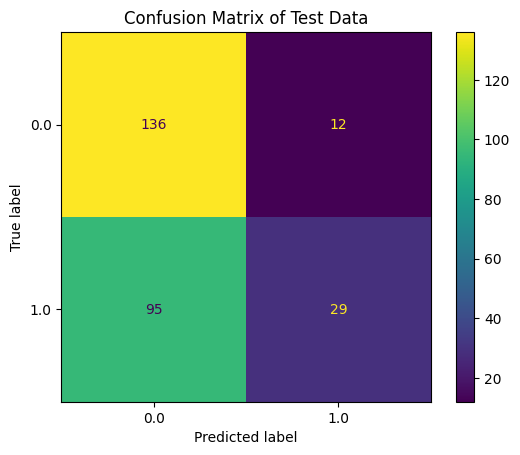

In [ ]:
#Plot Confusion Matrix for Train and Test Data
from sklearn.metrics import ConfusionMatrixDisplay
import matplotlib.pyplot as plt

#Confusion Matrix of Train Data
ConfusionMatrixDisplay.from_predictions(y_train, y_train_pred)
plt.title('Confusion Matrix of Train Data')

#Confusion Matrix of Test Data
ConfusionMatrixDisplay.from_predictions(y_test, y_test_pred)
plt.title('Confusion Matrix of Test Data')

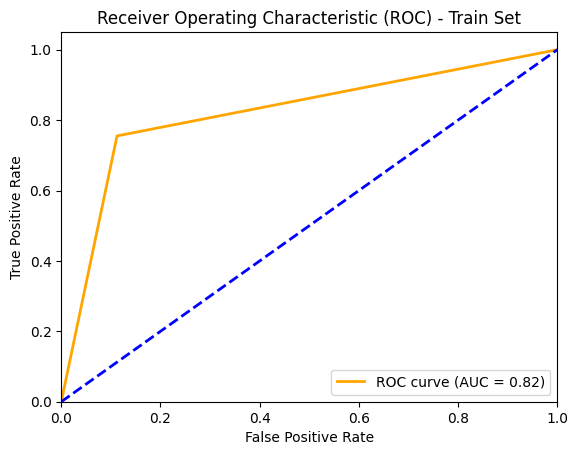

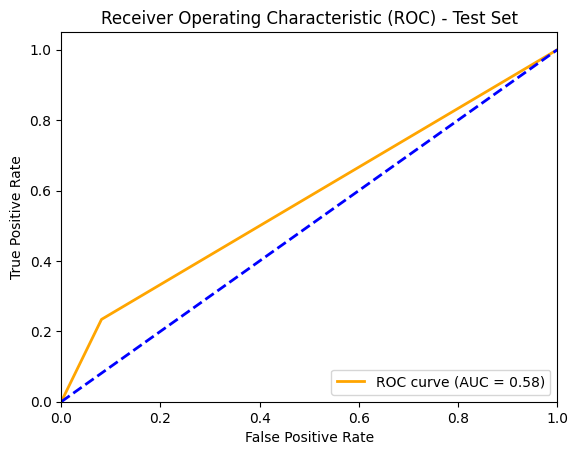

In [ ]:
#Plot ROC Curve for Train and Test Data
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve
from sklearn.metrics import auc

# Map actual "YES" and "NO" values to 1 and 0 respectively
mapping = {1.0: 1, 0.0: 0}
y_train_mapped = [mapping[val] for val in y_train]
y_test_mapped = [mapping[val] for val in y_test]

# Map predicted "YES" and "NO" values to 1 and 0 respectively
y_train_pred_mapped = [mapping[val] for val in y_train_pred]
y_test_pred_mapped = [mapping[val] for val in y_test_pred]

# ROC curve and AUC for train data
fpr_train, tpr_train, thresholds_train = roc_curve(y_train_mapped, y_train_pred_mapped)
roc_auc_train = auc(fpr_train, tpr_train)

# ROC curve and AUC for test data
fpr_test, tpr_test, thresholds_test = roc_curve(y_test_mapped, y_test_pred_mapped)
roc_auc_test = auc(fpr_test, tpr_test)

# Plot ROC curve for train data
plt.figure()
plt.plot(fpr_train, tpr_train, color='orange', lw=2, label='ROC curve (AUC = %0.2f)' % roc_auc_train)
plt.plot([0, 1], [0, 1], color='blue', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) - Train Set')
plt.legend(loc="lower right")

# Plot ROC curve for test data
plt.figure()
plt.plot(fpr_test, tpr_test, color='orange', lw=2, label='ROC curve (AUC = %0.2f)' % roc_auc_test)
plt.plot([0, 1], [0, 1], color='blue', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) - Test Set')
plt.legend(loc="lower right")

plt.show()

#6. Testing on Lithuanian Dataset

In [ ]:
#Connect to GDrive to load the dataset
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
#Specify file paths and load them into DataFrames
import pandas as pd
train_data=pd.read_excel('/content/drive/My Drive/Colab Notebooks/Research Project/Updated Mexican Research Dataset.xlsx')
df_train=pd.DataFrame(train_data)
test_data=pd.read_excel('/content/drive/My Drive/Colab Notebooks/Research Project/Research Project Dataset.xlsx')
df_test=pd.DataFrame(test_data)

##Data Pre-processing

Ensuring Reproducibility

In [ ]:
# Import libraries
import random
import numpy as np

#Set seed value
random.seed(42)
np.random.seed(42)

Visualising the datasets and their dimensions

In [ ]:
# Visualise the train dataset
df_train.head(400)

,Nr,Sex,Age,OCB + in CSF,VEP +,BAEP +,Periventricular,MRI spinal lesions,MRI infratentorial lesions,MS
0,1,1,34,0.0,0,0,0,1,0,1
1,2,1,61,1.0,1,0,0,1,0,1
2,3,1,22,1.0,0,0,0,0,0,1
3,4,0,41,1.0,1,0,1,0,0,1
4,5,0,34,0.0,0,0,1,0,0,1
...,...,...,...,...,...,...,...,...,...,...
267,268,0,31,0.0,0,0,0,0,0,0
268,269,1,21,1.0,0,0,0,1,0,0
269,270,0,19,0.0,1,0,0,1,0,0
270,271,0,32,1.0,1,0,1,0,1,0


In [ ]:
# Visualise the test dataset
df_test.head(400)

,Nr,Sex,Age,Fatigue,General weakness,Pain,Focal symptoms,Cranial Nerve Symptoms,CN3,CN4,...,Pathological CSF,Increased protein,Increased protein (g/l),Pleocytosis,Pleocytosis (cells/ml),OCB + in CSF,IgG levels in CSF,VEP +,BAEP +,MS
0,2,0,56,0,0,0,1,1,0,0,...,1,0,0.37,0,4,0,,0,0,0
1,3,0,47,0,0,1,1,0,0,0,...,0,0,0.28,0,0,0,22.9,0,1,0
2,4,0,43,0,0,1,1,1,0,0,...,0,0,0.38,0,2,,25.3,1,0,0
3,5,0,39,0,0,1,0,0,0,0,...,0,,,0,1,0,,,,0
4,6,0,61,0,0,1,1,0,0,0,...,1,1,0.57,0,0,1,,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
133,165,0,65,0,0,0,1,0,0,0,...,,,NaN,,NaN,,,1,0,0
134,166,1,61,0,0,0,0,1,1,0,...,1,1,0.96,1,6,0,117,,,0
135,167,0,28,0,1,1,0,0,0,0,...,0,0,0.23,0,4,,,0,,1
136,169,0,22,0,0,0,1,0,0,0,...,0,0,0.16,0,4,1,14.9,0,0,1


In [ ]:
# Number of observations and features in both datasets
print("The train dataset dimensions are: ")
print(df_train.shape)
print("The test dataset dimensions are: ")
print(df_test.shape)

The train dataset dimensions are: 
(272, 10)
The test dataset dimensions are: 
(138, 44)


In [ ]:
# Remove unnecessary columns from train dataset
df_train = df_train.drop(['Nr','VEP +','Age', 'Periventricular', 'MRI infratentorial lesions'], axis=1)

In [ ]:
# Remove unnecessary columns from test dataset
df_test = df_test.drop(['Nr', 'Fatigue',	'Age', 'General weakness',	'Pain',	'Focal symptoms',	'Cranial Nerve Symptoms','CN3',	'CN4'	,'CN5',	'CN6',	'CN8',	'Pathological reflexes',	"Babinski's",	'Rossolimo',	'Muscle strength',	'Reflex asymmetry',	'Muscle tone abnormalities',	'Proprioception',	'Superficial sensation',	'Coordination',	'Balance',	'Urinary incontinence',	'Urine retention',	'Vertigo',	'Sum of symptoms',	'MRI lesions specific to MS',	'MRI lesions indicative of other diseases',	'Unspecified MRI lesions',	'MRI infratentorial lesions',	'Periventricular',	'Juxtacortical',		'Pathological CSF','Increased protein', 'Increased protein (g/l)',	'Pleocytosis',	'Pleocytosis (cells/ml)',		'IgG levels in CSF',	'VEP +'		], axis=1)


Converting the data type for use by the model

In [ ]:
# Convert all columns to numeric data types
df_train = df_train.apply(pd.to_numeric, errors='coerce')
df_test = df_test.apply(pd.to_numeric, errors='coerce')

# Check the data types of columns
print("Data types of Train Dataset Columns: ")
print(df_train.dtypes)
print()
print("Data types of Test Dataset Columns: ")
print(df_train.dtypes)

Data types of Train Dataset Columns: 
Sex                     int64
OCB + in CSF          float64
BAEP +                  int64
MRI spinal lesions      int64
MS                      int64
dtype: object

Data types of Test Dataset Columns: 
Sex                     int64
OCB + in CSF          float64
BAEP +                  int64
MRI spinal lesions      int64
MS                      int64
dtype: object


Impute missing data

In [ ]:
#Install library for imputation
!pip install impyute

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
#import library for Multiple Imputation by Chained Equations (MICE)
from impyute.imputation.cs import mice

# impute missing values using MICE
imputed_train = mice(df_train.values)
imputed_test = mice(df_test.values)

# convert imputed data back to a pandas DataFrame
imputed_df_train = pd.DataFrame(imputed_train, columns=df_train.columns)
imputed_df_test = pd.DataFrame(imputed_test, columns=df_test.columns)

Specify features and target variable

In [ ]:
#Specify x and y in both datasets
x_train =imputed_df_train[['Sex','MRI spinal lesions', 'BAEP +', 'OCB + in CSF']]  # Features in Dataset 1
y_train =imputed_df_train['MS']  # Target variable in Dataset 1

x_test = imputed_df_test[['Sex', 'MRI spinal lesions', 'BAEP +', 'OCB + in CSF']]  # Features in Dataset 2
y_test = imputed_df_test['MS']  # Target variable in Dataset 2


#Print train dimensions
print(x_train.shape)
print(y_train.shape)

#Print test dimensions
print(x_test.shape)
print(y_test.shape)

(272, 4)
(272,)
(138, 4)
(138,)


Visualising Relationship between Target Variable and Each Feature in x

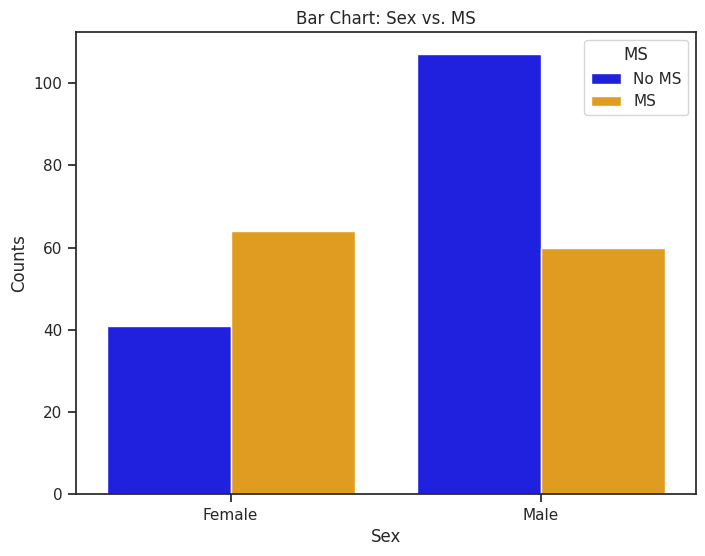

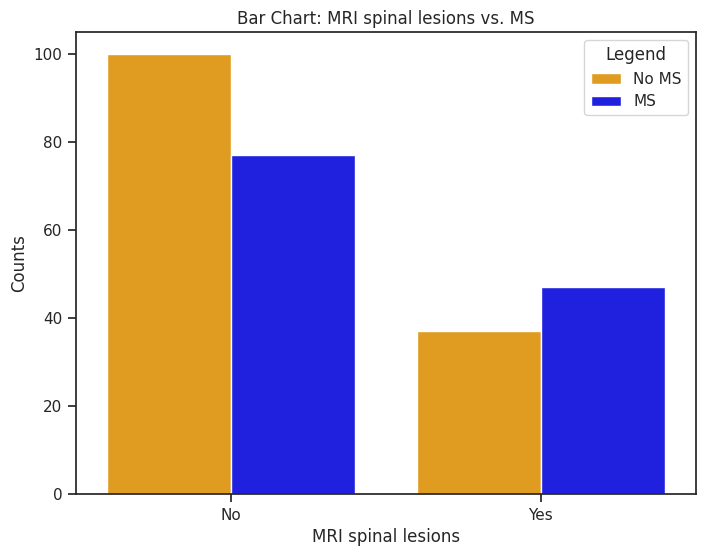

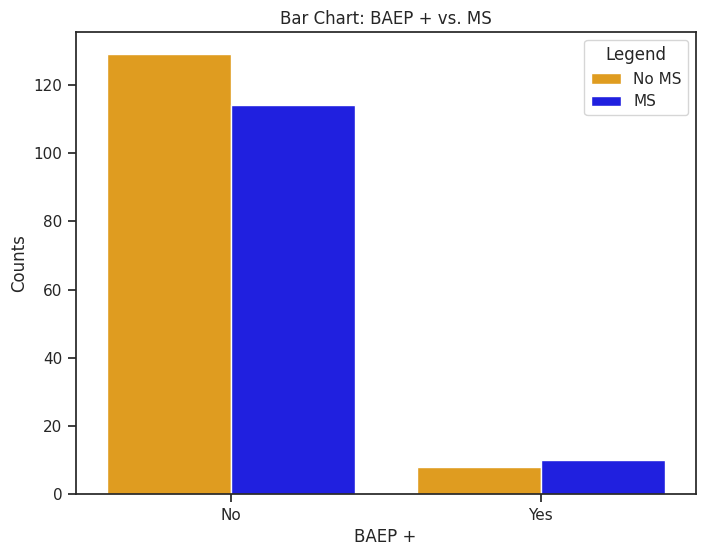

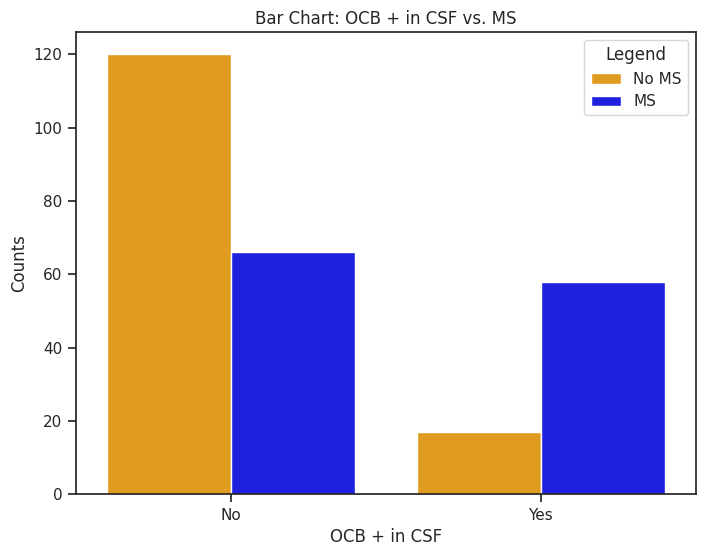

In [ ]:
# Import libraries
import seaborn as sns
import matplotlib.pyplot as plt

# Filter the data
filtered_df = imputed_df_train.copy()
filtered_df = filtered_df.dropna()

# Convert Sex values to strings
filtered_df['Sex'] = filtered_df['Sex'].replace({0.0: 'Female', 1.0: 'Male'})

# Plot bar graph
plt.figure(figsize=(8, 6))
sns.countplot(x='Sex', hue='MS', data=filtered_df, palette={"orange", "blue"})

plt.xlabel("Sex")
plt.ylabel("Counts")
plt.title("Bar Chart: Sex vs. MS")
plt.legend(title="MS", labels=["No MS", "MS"])

# Set x-axis tick labels
plt.xticks([0, 1], ["Female", "Male"])

plt.show()

# Setting style and palette for plots
sns.set(style="ticks")
sns.set_palette(["orange", "blue"])

# Define a function to convert values to 0.0 or 1.0
def convert_to_binary(value):
    if value == 0.0:
        return 0.0
    elif value == 1.0:
        return 1.0
    else:
        return None

# Filter the data and convert the variables to binary values
filtered_df = imputed_df_train.copy()
filtered_df['MRI spinal lesions'] = filtered_df['MRI spinal lesions'].apply(convert_to_binary)
filtered_df['OCB + in CSF'] = filtered_df['OCB + in CSF'].apply(convert_to_binary)
filtered_df['BAEP +'] = filtered_df['BAEP +'].apply(convert_to_binary)

# Remove rows with null values
filtered_df = filtered_df.dropna()

# Plot Bar chart for each variable
variables = ['MRI spinal lesions', 'BAEP +', 'OCB + in CSF']

for variable in variables:
    plt.figure(figsize=(8, 6))
    ax = sns.countplot(x=variable, hue='MS', data=filtered_df)
    ax.set_ylabel("Counts")
    ax.set_xlabel(variable)
    ax.set_xticks([0, 1])
    ax.set_xticklabels(["No", "Yes"])
    plt.title(f"Bar Chart: {variable} vs. MS")
    plt.legend(title="Legend", labels=["No MS", "MS"])
    plt.show()



Visualising correlation and multicollinearity in the train dataset (x) as a correlation matrix, heatmap and Seaborn plots

In [ ]:
# Import libraries
import pandas as pd

# Calculate the correlation matrix
corr_matrix = imputed_df_train[['Sex', 'BAEP +', 'MRI spinal lesions', 'OCB + in CSF', 'MS']].corr()

# Display the correlation table
corr_table = corr_matrix.style.set_properties(**{'background-color': 'transparent'})

# Display the correlation table
print("Correlation Matrix: ")
corr_table

Correlation Matrix: 


,Sex,BAEP +,MRI spinal lesions,OCB + in CSF,MS
Sex,1.000000,0.153455,-0.003224,0.176835,0.244609
BAEP +,0.153455,1.000000,0.073435,0.164702,0.053275
MRI spinal lesions,-0.003224,0.073435,1.000000,0.148240,0.123734
OCB + in CSF,0.176835,0.164702,0.148240,1.000000,0.385584
MS,0.244609,0.053275,0.123734,0.385584,1.000000


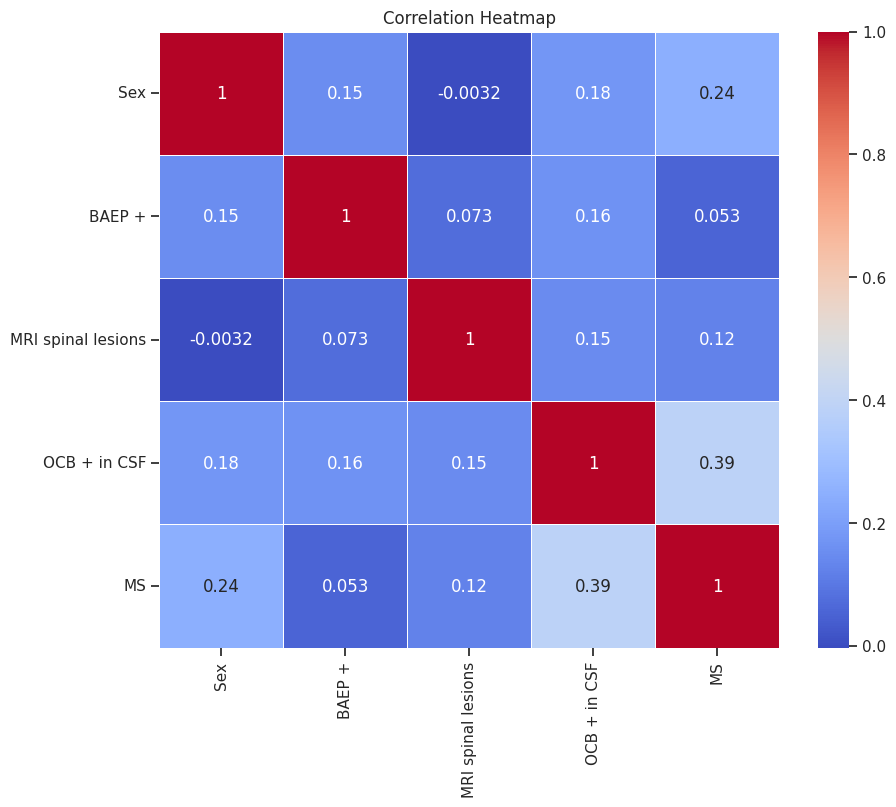

In [ ]:
#Import libraries
import seaborn as sns
import matplotlib.pyplot as plt

# Calculate the correlation matrix
corr_matrix = imputed_df_train[['Sex','BAEP +', 'MRI spinal lesions', 'OCB + in CSF', 'MS']].corr()

# Plot the correlation matrix using a heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Correlation Heatmap')
plt.xticks(rotation=90)
plt.yticks(rotation=0)
plt.show()


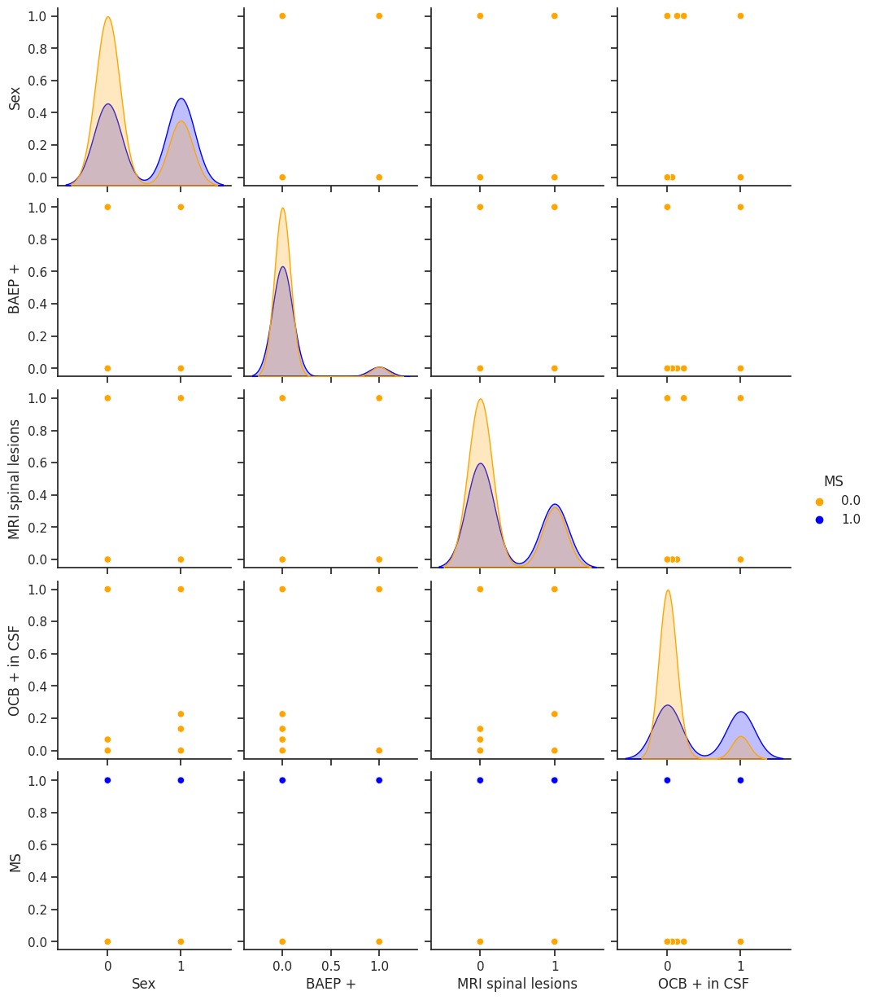

In [ ]:
# Import libraries
import seaborn as sns
import matplotlib.pyplot as plt

# Specify the features and target variable
selected_features = ['Sex', 'BAEP +', 'MRI spinal lesions', 'OCB + in CSF']
target_variable = 'MS'

# Concatenate the selected features and the target variable
data = imputed_df_train[selected_features + [target_variable]]

# Set the color palette
colours = ["orange", "blue"]

# Plot pairwise relationships
sns.pairplot(data, x_vars=selected_features, y_vars=selected_features + [target_variable], hue=target_variable, palette=colours)
plt.show()


In [ ]:
# Print features with multicollinearity
highly_correlated_features = []
abs_corr_matrix = imputed_df_train[selected_features].corr().abs()

for i in range(len(abs_corr_matrix.columns)):
    for j in range(i + 1, len(abs_corr_matrix.columns)):
        if abs_corr_matrix.iloc[i, j] > 0.7:
            feature_i = abs_corr_matrix.columns[i]
            feature_j = abs_corr_matrix.columns[j]
            highly_correlated_features.append((feature_i, feature_j))

if len(highly_correlated_features) == 0:
    print("No Multicollinearity Observed")
else:
    print("Features with multicollinearity (absolute correlation coefficient > 0.7):")
    for feature_i, feature_j in highly_correlated_features:
        print(f"{feature_i} - {feature_j}")


No Multicollinearity Observed


Checking for imbalanced classes in the dataset

0.0    54.411765
1.0    45.588235
Name: MS, dtype: float64


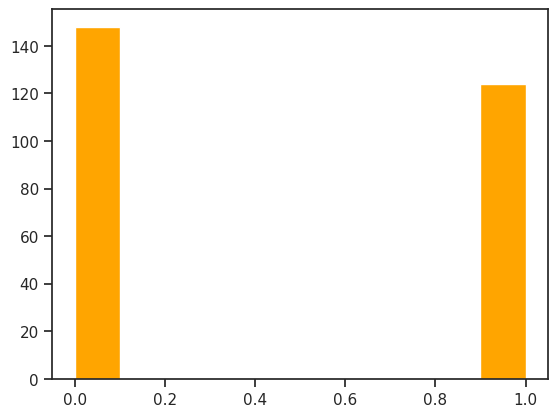

The baseline accuracy is: 0.5441176470588235


In [ ]:
# Check if dataset is imbalanced
print(imputed_df_train['MS'].value_counts() * 100.0 / len(imputed_df_train['MS']))

# Visualise dataset imbalance
import matplotlib.pyplot as plt
plt.hist(imputed_df_train['MS'], color='orange')
plt.grid(False)  # Remove grid lines
plt.show()

# Find baseline accuracy
from sklearn.dummy import DummyClassifier

features = imputed_df_train[selected_features]
outcome = imputed_df_train['MS']

clf = DummyClassifier(strategy='most_frequent')
clf.fit(features, outcome)
baseline_accuracy = clf.score(features, outcome)
print("The baseline accuracy is:", baseline_accuracy)



#Data splitting not done as y is a new dataset

##Importing Libraries for Following Steps

In [ ]:
from sklearn.metrics import f1_score
import warnings
from sklearn.exceptions import ConvergenceWarning
import numpy as np
from sklearn.model_selection import StratifiedKFold
from sklearn.naive_bayes import GaussianNB
from sklearn.model_selection import GridSearchCV

# Ignore convergence warnings
warnings.filterwarnings("ignore", category=ConvergenceWarning)

##Hyperparameter tuning

In [ ]:
# Define parameters to tune for Naive Bayes
nb_param_grid = {'var_smoothing': [1e-12, 1e-11, 1e-10, 1e-9, 1e-8, 1e-7, 1e-6, 1e-5, 1e-4, 1e-3]}


##Stratified K-Fold Cross Validation:

In [ ]:
# Creating an instance of StratifiedKFold
nb_skfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=1)

##Training and Model Validation:



##Average F1 Scores and Standard Deviation:

In [ ]:
# Creating lists to store evaluation metrics for each fold
train_f1_scores = []
val_f1_scores = []

# Iterating over each fold
for train_index, val_index in nb_skfold.split(x_train, y_train):
    x_train_fold, x_val_fold = x_train.iloc[train_index], x_train.iloc[val_index]
    y_train_fold, y_val_fold = y_train.iloc[train_index], y_train.iloc[val_index]

    # Create an instance of Logistic Regression model
    nb = GaussianNB()

    # Create an instance of GridSearchCV for Logistic Regression Classifier
    nb_cv = GridSearchCV(nb, nb_param_grid, cv=nb_skfold)

    # Fit GridSearchCV on the training fold
    nb_cv.fit(x_train_fold, y_train_fold)

    # Get the best estimator from GridSearchCV
    best_nb_model = nb_cv.best_estimator_

    # Print best parameters and F1 score
    print("Best Parameters:", nb_cv.best_params_)
    print("F1 Score:", nb_cv.best_score_)

    # Fitting the best estimator on the training fold and making predictions
    y_train_pred = best_nb_model.predict(x_train_fold)

    # Calculating F1 score for the train set
    train_f1 = f1_score(y_train_fold, y_train_pred)

    # Appending train F1 score to the list
    train_f1_scores.append(train_f1)

    # Making predictions for the validation fold
    y_val_pred = best_nb_model.predict(x_val_fold)

    # Calculating F1 score for the validation set
    val_f1 = f1_score(y_val_fold, y_val_pred)

    # Appending validation F1 score to the list
    val_f1_scores.append(val_f1)


Best Parameters: {'var_smoothing': 1e-12}
F1 Score: 0.6863636363636363
Best Parameters: {'var_smoothing': 1e-12}
F1 Score: 0.7005285412262156
Best Parameters: {'var_smoothing': 1e-12}
F1 Score: 0.6788583509513743
Best Parameters: {'var_smoothing': 1e-12}
F1 Score: 0.6741014799154333
Best Parameters: {'var_smoothing': 1e-12}
F1 Score: 0.6785412262156448


##Average F1 Scores and Standard Deviation:

In [ ]:
# Calculating the average and standard deviation of F1 scores for train and validation sets
avg_train_f1 = np.mean(train_f1_scores)
std_train_f1 = np.std(train_f1_scores)
avg_val_f1 = np.mean(val_f1_scores)
std_val_f1 = np.std(val_f1_scores)

# Print the average and standard deviation for train and validation F1 scores
print("Average Train F1 Score:", avg_train_f1)
print("Standard Deviation of Train F1 Score:", std_train_f1)
print("Average Validation F1 Score:", avg_val_f1)
print("Standard Deviation of Validation F1 Score:", std_val_f1)


Average Train F1 Score: 0.6123138161273756
Standard Deviation of Train F1 Score: 0.020531807885932448
Average Validation F1 Score: 0.6183202216248653
Standard Deviation of Validation F1 Score: 0.0568635021488992


##Model Predictions on Train and Test Sets:

In [ ]:
# Make predictions on the train set using best model
best_model = nb_cv.best_estimator_
y_train_pred = best_model.predict(x_train)

# Make predictions on the test set using best model
best_model = nb_cv.best_estimator_
y_test_pred = best_model.predict(x_test)

##Visualise Various Classification Metrics

In [ ]:
#Print Classification Report
from sklearn.metrics import classification_report
print("Classification Report of Train Data:")
print(classification_report(y_train, y_train_pred))

print()

print("Classification Report of Test Data: ")
print(classification_report(y_test, y_test_pred))


Classification Report of Train Data:
              precision    recall  f1-score   support

         0.0       0.66      0.84      0.74       148
         1.0       0.72      0.49      0.58       124

    accuracy                           0.68       272
   macro avg       0.69      0.66      0.66       272
weighted avg       0.69      0.68      0.67       272


Classification Report of Test Data: 
              precision    recall  f1-score   support

         0.0       0.91      0.72      0.81        89
         1.0       0.63      0.88      0.74        49

    accuracy                           0.78       138
   macro avg       0.77      0.80      0.77       138
weighted avg       0.81      0.78      0.78       138



Text(0.5, 1.0, 'Confusion Matrix of Test Data')

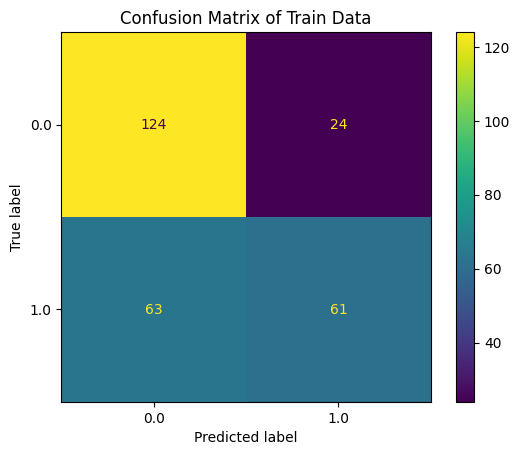

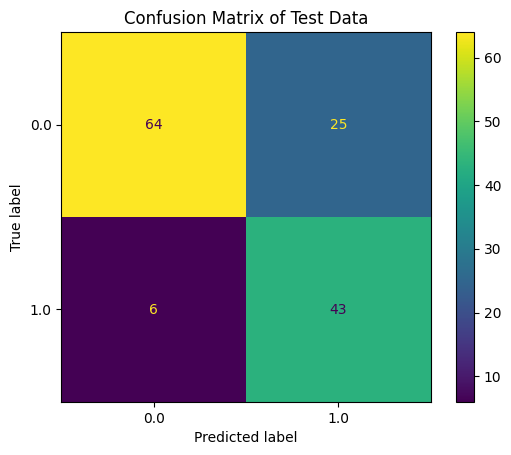

In [ ]:
#Plot Confusion Matrix for Train and Test Data
from sklearn.metrics import ConfusionMatrixDisplay

#Confusion Matrix of Train Data
ConfusionMatrixDisplay.from_predictions(y_train, y_train_pred)
plt.title('Confusion Matrix of Train Data')

#Confusion Matrix of Test Data
ConfusionMatrixDisplay.from_predictions(y_test, y_test_pred)
plt.title('Confusion Matrix of Test Data')

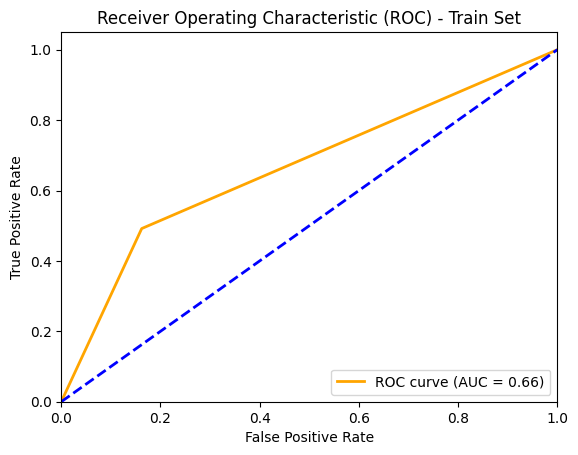

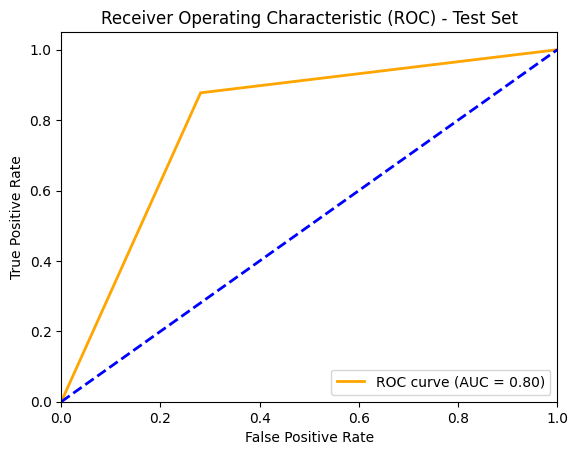

In [ ]:
#Plot ROC Curve for Train and Test Data
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve
from sklearn.metrics import auc

# Map actual "YES" and "NO" values to 1 and 0 respectively
mapping = {1.0: 1, 0.0: 0}
y_train_mapped = [mapping[val] for val in y_train]
y_test_mapped = [mapping[val] for val in y_test]

# Map predicted "YES" and "NO" values to 1 and 0 respectively
y_train_pred_mapped = [mapping[val] for val in y_train_pred]
y_test_pred_mapped = [mapping[val] for val in y_test_pred]

# ROC curve and AUC for train data
fpr_train, tpr_train, thresholds_train = roc_curve(y_train_mapped, y_train_pred_mapped)
roc_auc_train = auc(fpr_train, tpr_train)

# ROC curve and AUC for test data
fpr_test, tpr_test, thresholds_test = roc_curve(y_test_mapped, y_test_pred_mapped)
roc_auc_test = auc(fpr_test, tpr_test)

# Plot ROC curve for train data
plt.figure()
plt.plot(fpr_train, tpr_train, color='orange', lw=2, label='ROC curve (AUC = %0.2f)' % roc_auc_train)
plt.plot([0, 1], [0, 1], color='blue', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) - Train Set')
plt.legend(loc="lower right")

# Plot ROC curve for test data
plt.figure()
plt.plot(fpr_test, tpr_test, color='orange', lw=2, label='ROC curve (AUC = %0.2f)' % roc_auc_test)
plt.plot([0, 1], [0, 1], color='blue', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) - Test Set')
plt.legend(loc="lower right")

plt.show()

#7. Using Concatenated Dataset (Mexican+Lithuanian Combined)

##Data Loading

In [ ]:
#Connect to GDrive to load the dataset
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
#Specify file path and load it into a DataFrame
import pandas as pd
data=pd.read_excel('/content/drive/My Drive/Colab Notebooks/Research Project/Concatenated Dataset.xlsx')
df=pd.DataFrame(data)

##Data Pre-processing

Ensuring Reproducibility

In [ ]:
# Import libraries
import random
import numpy as np

#Set seed value
random.seed(42)
np.random.seed(42)

Visualising the dataset and its dimensions

In [ ]:
# Visualise the dataset
df.head(140)

,Nr,Sex,Age,OCB + in CSF,VEP +,BAEP +,Periventricular,MRI spinal lesions,MRI infratentorial lesions,MS
0,1,1,34,0,0.0,0.0,0.0,1.0,0.0,1
1,2,1,61,1,1.0,0.0,0.0,1.0,0.0,1
2,3,1,22,1,0.0,0.0,0.0,0.0,0.0,1
3,4,0,41,1,1.0,0.0,1.0,0.0,0.0,1
4,5,0,34,0,0.0,0.0,1.0,0.0,0.0,1
...,...,...,...,...,...,...,...,...,...,...
135,136,0,37,0,0.0,0.0,1.0,0.0,0.0,0
136,137,0,52,0,0.0,0.0,0.0,1.0,0.0,0
137,138,0,48,0,1.0,1.0,1.0,0.0,0.0,0
138,139,0,25,1,1.0,0.0,1.0,1.0,0.0,0


In [ ]:
# Number of observations and features in the dataset
print(df.shape)

(410, 10)


Dropping columns not needed for the analysis

In [ ]:
# Remove unnecessary columns
df = df.drop(['Nr', 'Periventricular', 'VEP +', 'MRI infratentorial lesions', 'Age'], axis=1)

Converting the data type for use by the model

In [ ]:
# Convert all columns to numeric data types
df = df.apply(pd.to_numeric, errors='coerce')

# Check the data types of columns
print(df.dtypes)

Sex                     int64
OCB + in CSF          float64
BAEP +                float64
MRI spinal lesions    float64
MS                      int64
dtype: object


Impute missing data

In [ ]:
#Install library for imputation
!pip install impyute

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
#import library for Multiple Imputation by Chained Equations (MICE)
from impyute.imputation.cs import mice

# impute missing values using MICE
imputed_data = mice(df.values)

# convert imputed data back to a pandas DataFrame
imputed_df = pd.DataFrame(imputed_data, columns=df.columns)

Specify features and target variable

In [ ]:
#Specify x and y
x = imputed_df[[ 'MRI spinal lesions', 'OCB + in CSF', 'BAEP +', 'Sex']]
y = imputed_df['MS']

#Print dimensions
print(x.shape)
print(y.shape)

(410, 4)
(410,)


Visualising Relationship between Target Variable and Each Feature in X

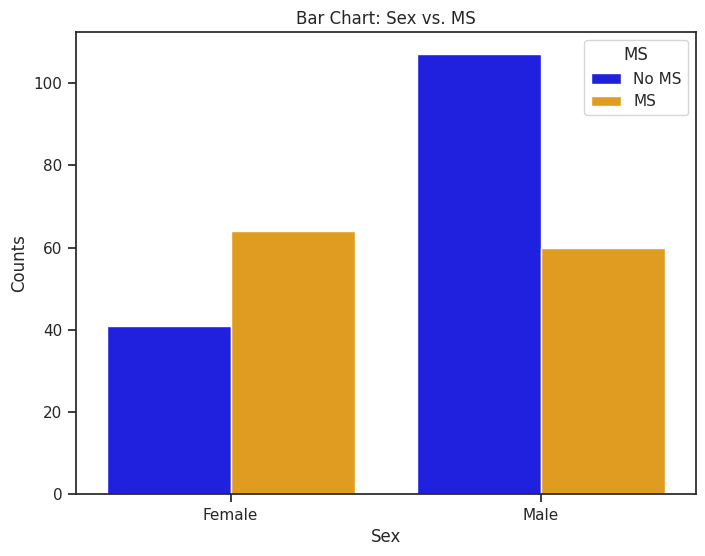

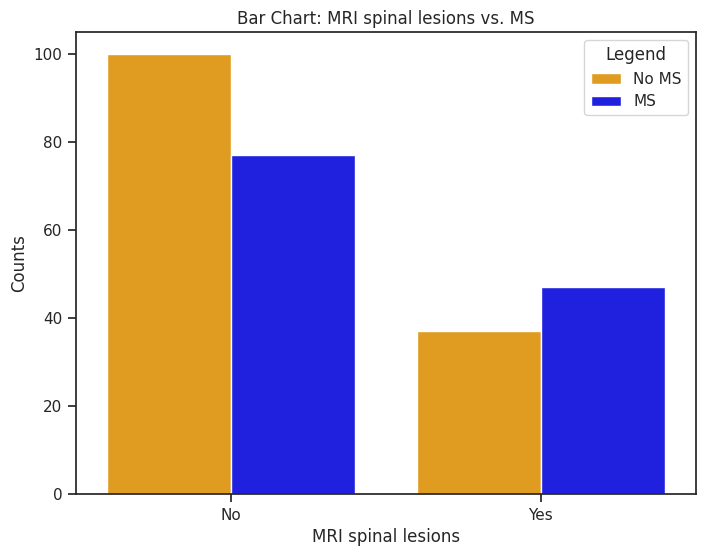

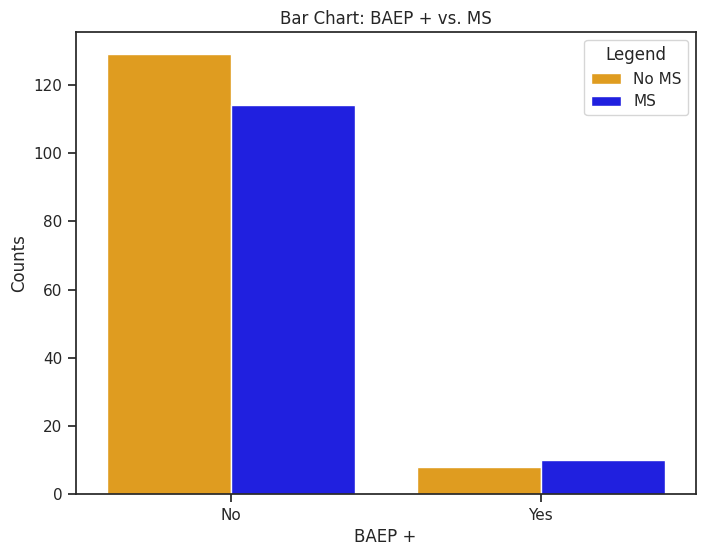

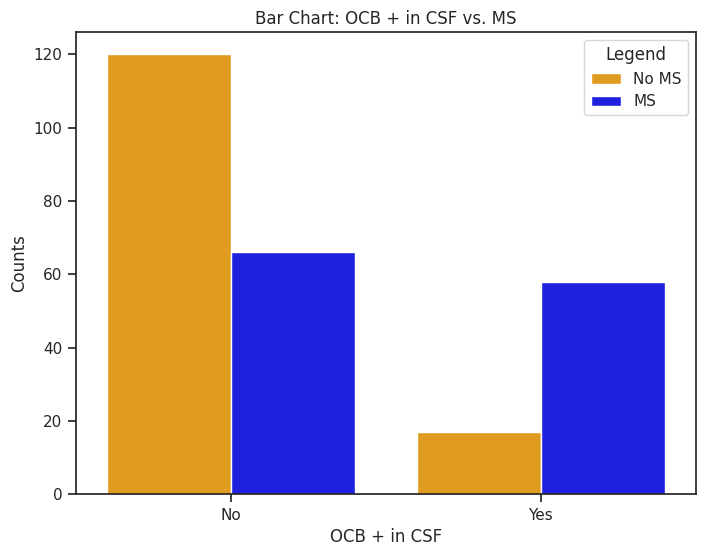

In [ ]:
#Import libraries
import seaborn as sns
import matplotlib.pyplot as plt

# Filter the data
filtered_df = imputed_df_train.copy()
filtered_df = filtered_df.dropna()

# Convert Sex values to strings
filtered_df['Sex'] = filtered_df['Sex'].replace({0.0: 'Female', 1.0: 'Male'})

# Plot bar graph
plt.figure(figsize=(8, 6))
sns.countplot(x='Sex', hue='MS', data=filtered_df, palette={"orange", "blue"})

plt.xlabel("Sex")
plt.ylabel("Counts")
plt.title("Bar Chart: Sex vs. MS")
plt.legend(title="MS", labels=["No MS", "MS"])

# Set x-axis tick labels
plt.xticks([0, 1], ["Female", "Male"])

plt.show()

# Setting style and palette for plots
sns.set(style="ticks")
sns.set_palette(["orange", "blue"])

# Define a function to convert values to 0.0 or 1.0
def convert_to_binary(value):
    if value == 0.0:
        return 0.0
    elif value == 1.0:
        return 1.0
    else:
        return None

# Filter the data and convert the variables to binary values
filtered_df = imputed_df_train.copy()
filtered_df['MRI spinal lesions'] = filtered_df['MRI spinal lesions'].apply(convert_to_binary)
filtered_df['OCB + in CSF'] = filtered_df['OCB + in CSF'].apply(convert_to_binary)
filtered_df['BAEP +'] = filtered_df['BAEP +'].apply(convert_to_binary)

# Remove rows with null values
filtered_df = filtered_df.dropna()

# Plot Bar chart for each variable
variables = ['MRI spinal lesions', 'BAEP +', 'OCB + in CSF']

for variable in variables:
    plt.figure(figsize=(8, 6))
    ax = sns.countplot(x=variable, hue='MS', data=filtered_df)
    ax.set_ylabel("Counts")
    ax.set_xlabel(variable)
    ax.set_xticks([0, 1])
    ax.set_xticklabels(["No", "Yes"])
    plt.title(f"Bar Chart: {variable} vs. MS")
    plt.legend(title="Legend", labels=["No MS", "MS"])
    plt.show()



Visualising correlation and multicollinearity as a correlation matrix, heatmap and Seaborn plots

In [ ]:
#Plotting a correlation matrix

#Import libraries
import seaborn as sns
import matplotlib.pyplot as plt

# Concatenate x and y
data = pd.concat([x, y], axis=1)

#Calculate and print the correlation matrix
print("Correlation Matrix")
data.corr()


Correlation Matrix


,MRI spinal lesions,OCB + in CSF,BAEP +,Sex,MS
MRI spinal lesions,1.000000,0.114599,0.051671,0.010913,0.075824
OCB + in CSF,0.114599,1.000000,0.230081,0.089504,0.444444
BAEP +,0.051671,0.230081,1.000000,0.078308,0.120500
Sex,0.010913,0.089504,0.078308,1.000000,0.217936
MS,0.075824,0.444444,0.120500,0.217936,1.000000


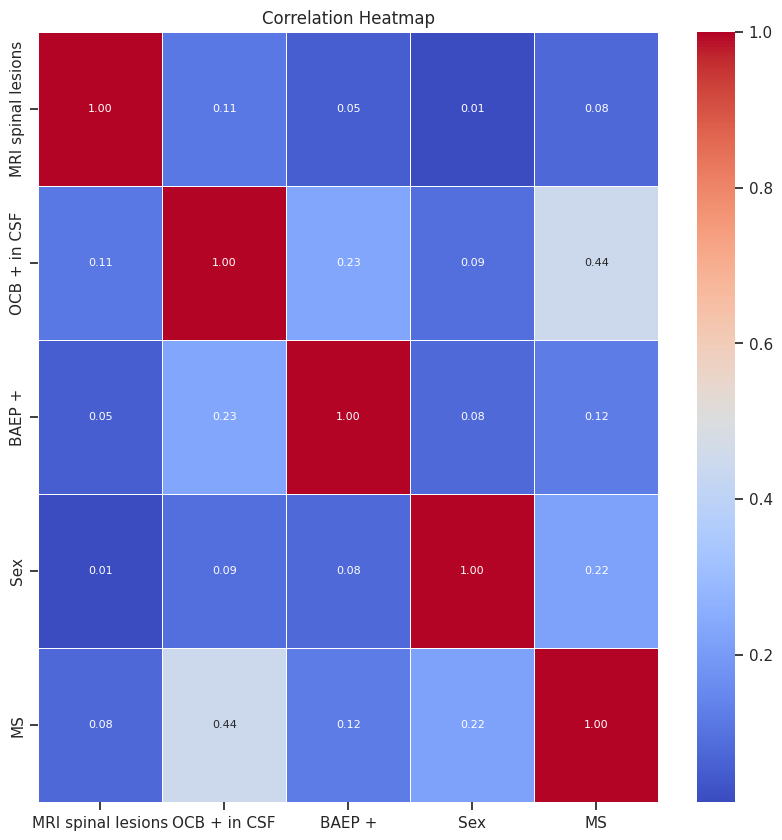

In [ ]:
#Visualise correlation and multicollinearity as a heatmap

#Import libraries
import seaborn as sns
import matplotlib.pyplot as plt

# Concatenate x and y
data = pd.concat([x, y], axis=1)

# Computing the correlation matrix
corr_matrix = data.corr()

# Plotting a heatmap
plt.figure(figsize=(10, 10))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5, annot_kws={"size": 8})
plt.title("Correlation Heatmap")
plt.show()

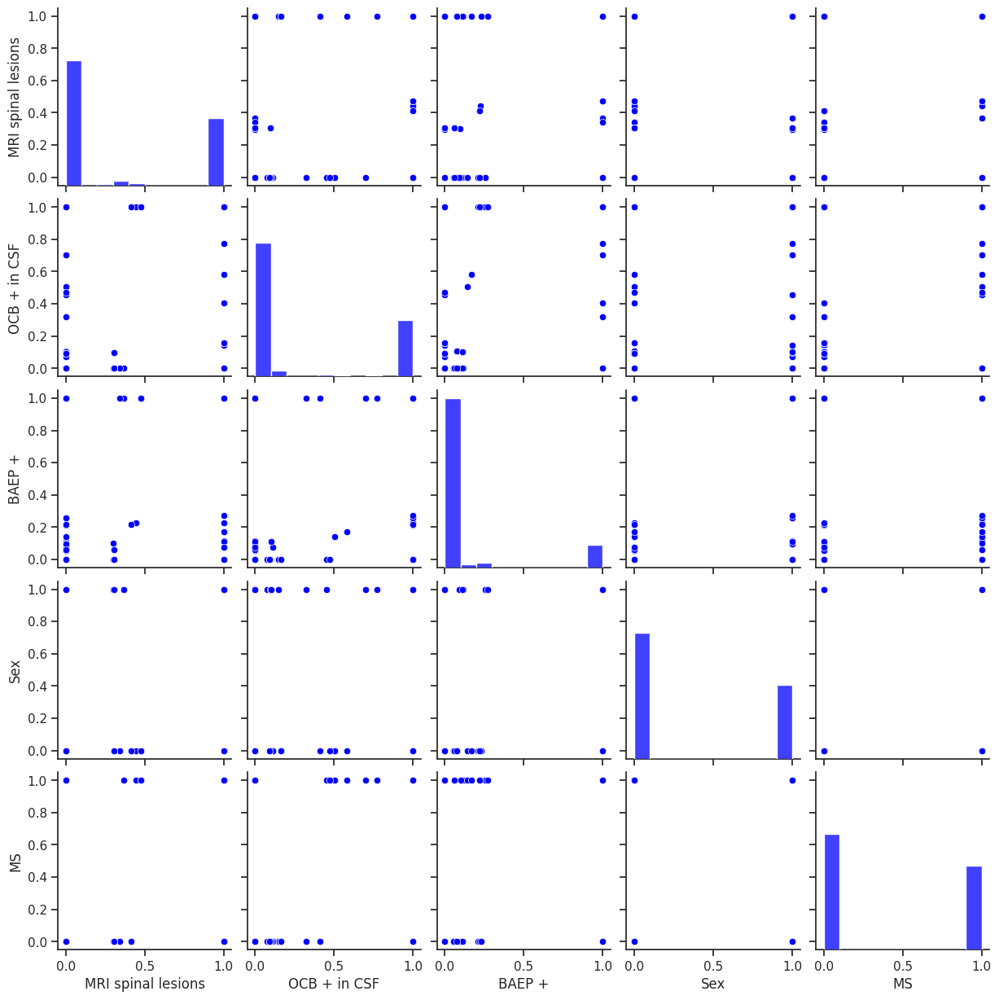

In [ ]:
# Import library
import seaborn as sns

# Concatenate x and y
data = pd.concat([x, y], axis=1)

# Set color
color = 'blue'

# Visualise plots
sns.pairplot(data, diag_kws={'color': color}, plot_kws={'color': color})


In [ ]:
# Print features with multicollinearity
highly_correlated_features = []
abs_corr_matrix = corr_matrix.abs()
for i in range(len(abs_corr_matrix.columns)):
    for j in range(i+1, len(abs_corr_matrix.columns)):
        if abs_corr_matrix.iloc[i, j] > 0.7:
            feature_i = abs_corr_matrix.columns[i]
            feature_j = abs_corr_matrix.columns[j]
            highly_correlated_features.append((feature_i, feature_j))

if len(highly_correlated_features) == 0:
    print("No Multicollinearity Observed")
else:
    print("Features with multicollinearity (absolute correlation coefficient > 0.7):")
    for feature_i, feature_j in highly_correlated_features:
        print(f"{feature_i} - {feature_j}")

No Multicollinearity Observed


Checking for imbalanced classes in the dataset

0.0    57.804878
1.0    42.195122
Name: MS, dtype: float64


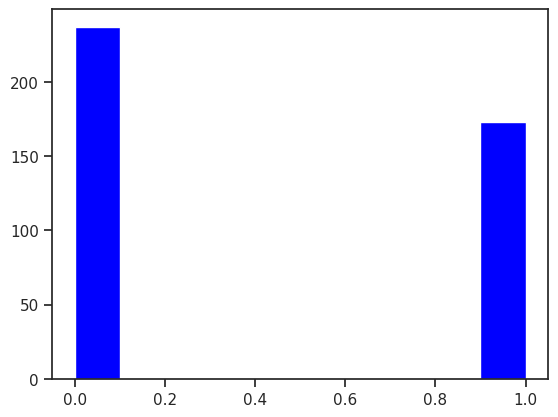

The baseline accuracy is: 0.5780487804878048


In [ ]:
# Check if dataset is imbalanced
print(y.value_counts() * 100.0 / len(y))

# Visualize dataset imbalance
import matplotlib.pyplot as plt
plt.hist(y, color='blue')
plt.grid(False)  # Remove grid lines
plt.show()

# Find baseline accuracy
from sklearn.dummy import DummyClassifier

clf = DummyClassifier(strategy='most_frequent')
clf.fit(x, y)
baseline_accuracy = clf.score(x, y)
print("The baseline accuracy is:", baseline_accuracy)



##Data Splitting

Split data into train and test sets

In [ ]:
#Import train_test_split function
from sklearn.model_selection import train_test_split

# Split data into train and test sets with stratification to resolve class imbalances
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=1, stratify=y, shuffle=True)

# Print dimensions
print('x_train:', x_train.shape)
print('x_test:', x_test.shape)
print('y_train:', y_train.shape)
print('y_test:', y_test.shape)

x_train: (328, 4)
x_test: (82, 4)
y_train: (328,)
y_test: (82,)


##Importing Libraries for Following Steps

In [ ]:
from sklearn.metrics import f1_score
import warnings
from sklearn.exceptions import ConvergenceWarning
import numpy as np
from sklearn.model_selection import StratifiedKFold
from sklearn.naive_bayes import GaussianNB
from sklearn.model_selection import GridSearchCV

# Ignore convergence warnings
warnings.filterwarnings("ignore", category=ConvergenceWarning)

##Hyperparameter tuning

In [ ]:
# Define parameters to tune for Naive Bayes
nb_param_grid = {'var_smoothing': [1e-12, 1e-11, 1e-10, 1e-9, 1e-8, 1e-7, 1e-6, 1e-5, 1e-4, 1e-3]}



##Stratified K-Fold Cross Validation:

In [ ]:
# Creating an instance of StratifiedKFold
nb_skfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=1)


##Training and Model Validation:



In [ ]:
# Creating lists to store evaluation metrics for each fold
train_f1_scores = []
val_f1_scores = []

# Iterating over each fold
for train_index, val_index in lr_skfold.split(x_train, y_train):
    x_train_fold, x_val_fold = x_train.iloc[train_index], x_train.iloc[val_index]
    y_train_fold, y_val_fold = y_train.iloc[train_index], y_train.iloc[val_index]

    # Create an instance of Logistic Regression model
    lr = LogisticRegression(random_state=1)

    # Create an instance of GridSearchCV for Logistic Regression Classifier
    lr_cv = GridSearchCV(lr, lr_param_grid, cv=lr_skfold)

    # Fit GridSearchCV on the training fold
    lr_cv.fit(x_train_fold, y_train_fold)

    # Get the best estimator from GridSearchCV
    best_lr_model = lr_cv.best_estimator_

    # Print best parameters and F1 score
    print("Best Parameters:", lr_cv.best_params_)
    print("F1 Score:", lr_cv.best_score_)

    # Fitting the best estimator on the training fold and making predictions
    y_train_pred = best_lr_model.predict(x_train_fold)

    # Calculating F1 score for the train set
    train_f1 = f1_score(y_train_fold, y_train_pred)

    # Appending train F1 score to the list
    train_f1_scores.append(train_f1)

    # Making predictions for the validation fold
    y_val_pred = best_lr_model.predict(x_val_fold)

    # Calculating F1 score for the validation set
    val_f1 = f1_score(y_val_fold, y_val_pred)

    # Appending validation F1 score to the list
    val_f1_scores.append(val_f1)


/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:378: FitFailedWarning: 
600 fits failed out of a total of 1200.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
100 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py", line 1162, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py", line 54, in _check_solver
    raise ValueError(
ValueError: S

Best Parameters: {'C': 0.1, 'class_weight': None, 'penalty': 'l1', 'random_state': None, 'solver': 'liblinear'}
F1 Score: 0.7328737300435414


/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:378: FitFailedWarning: 
600 fits failed out of a total of 1200.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
100 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py", line 1162, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py", line 54, in _check_solver
    raise ValueError(
ValueError: S

Best Parameters: {'C': 0.1, 'class_weight': 'balanced', 'penalty': 'l1', 'random_state': None, 'solver': 'saga'}
F1 Score: 0.7481857764876633


/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:378: FitFailedWarning: 
600 fits failed out of a total of 1200.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
100 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py", line 1162, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py", line 54, in _check_solver
    raise ValueError(
ValueError: S

Best Parameters: {'C': 0.1, 'class_weight': None, 'penalty': 'l1', 'random_state': None, 'solver': 'liblinear'}
F1 Score: 0.7592888243831639


/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:378: FitFailedWarning: 
600 fits failed out of a total of 1200.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
100 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py", line 1162, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py", line 54, in _check_solver
    raise ValueError(
ValueError: S

Best Parameters: {'C': 0.1, 'class_weight': None, 'penalty': 'l1', 'random_state': None, 'solver': 'liblinear'}
F1 Score: 0.749056603773585
Best Parameters: {'C': 0.1, 'class_weight': 'balanced', 'penalty': 'l1', 'random_state': None, 'solver': 'saga'}
F1 Score: 0.7257619738751815


/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:378: FitFailedWarning: 
600 fits failed out of a total of 1200.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
100 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py", line 1162, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py", line 54, in _check_solver
    raise ValueError(
ValueError: S

##Average F1 Scores and Standard Deviation:

In [ ]:
# Calculating the average and standard deviation of F1 scores for train and validation sets
avg_train_f1 = np.mean(train_f1_scores)
std_train_f1 = np.std(train_f1_scores)
avg_val_f1 = np.mean(val_f1_scores)
std_val_f1 = np.std(val_f1_scores)

# Print the average and standard deviation for train and validation F1 scores
print("Average Train F1 Score:", avg_train_f1)
print("Standard Deviation of Train F1 Score:", std_train_f1)
print("Average Validation F1 Score:", avg_val_f1)
print("Standard Deviation of Validation F1 Score:", std_val_f1)


Average Train F1 Score: 0.6425740282776998
Standard Deviation of Train F1 Score: 0.01671023577221399
Average Validation F1 Score: 0.6431511818137958
Standard Deviation of Validation F1 Score: 0.06093714282605967


##Model Predictions on Train and Test Sets:

In [ ]:
# Make predictions on the train set using best model
best_model = lr_cv.best_estimator_
y_train_pred = best_model.predict(x_train)

# Make predictions on the test set using best model
best_model = lr_cv.best_estimator_
y_test_pred = best_model.predict(x_test)

##Visualise Various Classification Metrics

In [ ]:
#Print Classification Report
from sklearn.metrics import classification_report
print("Classification Report of Train Data:")
print(classification_report(y_train, y_train_pred))

print()

print("Classification Report of Test Data: ")
print(classification_report(y_test, y_test_pred))


Classification Report of Train Data:
              precision    recall  f1-score   support

         0.0       0.73      0.88      0.80       190
         1.0       0.77      0.56      0.65       138

    accuracy                           0.74       328
   macro avg       0.75      0.72      0.72       328
weighted avg       0.75      0.74      0.74       328


Classification Report of Test Data: 
              precision    recall  f1-score   support

         0.0       0.71      0.89      0.79        47
         1.0       0.78      0.51      0.62        35

    accuracy                           0.73        82
   macro avg       0.75      0.70      0.71        82
weighted avg       0.74      0.73      0.72        82



Text(0.5, 1.0, 'Confusion Matrix of Test Data')

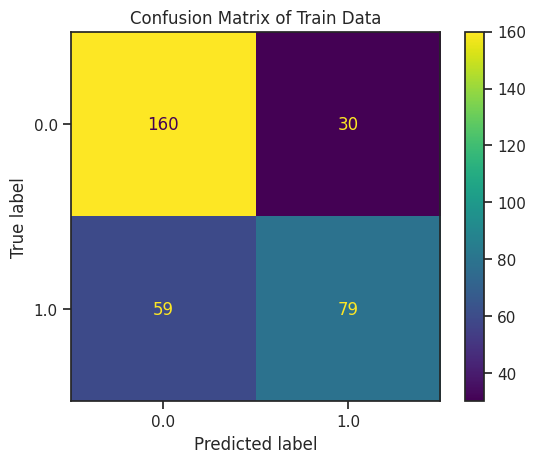

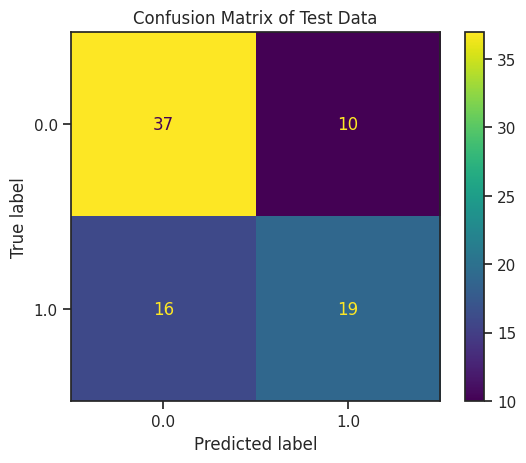

In [ ]:
#Plot Confusion Matrix for Train and Test Data
from sklearn.metrics import ConfusionMatrixDisplay

#Confusion Matrix of Train Data
ConfusionMatrixDisplay.from_predictions(y_train, y_train_pred)
plt.title('Confusion Matrix of Train Data')

#Confusion Matrix of Test Data
ConfusionMatrixDisplay.from_predictions(y_test, y_test_pred)
plt.title('Confusion Matrix of Test Data')

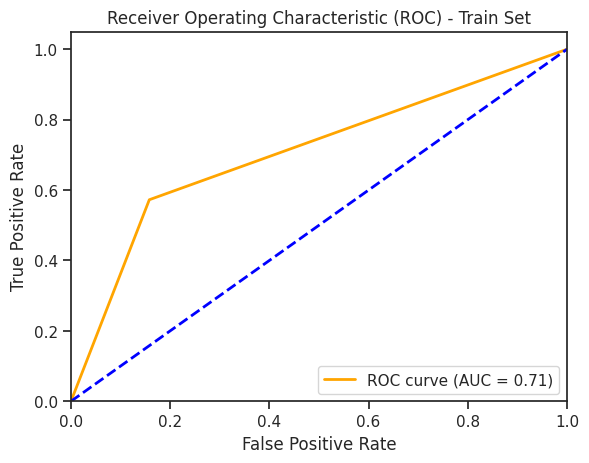

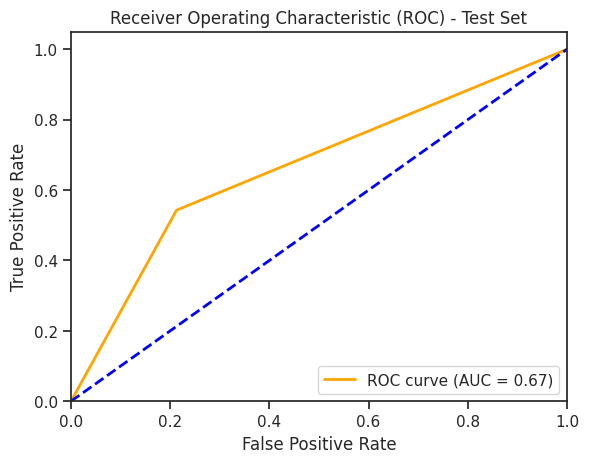

In [ ]:
#Plot ROC Curve for Train and Test Data
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve
from sklearn.metrics import auc

# Map actual "YES" and "NO" values to 1 and 0 respectively
mapping = {1.0: 1, 0.0: 0}
y_train_mapped = [mapping[val] for val in y_train]
y_test_mapped = [mapping[val] for val in y_test]

# Map predicted "YES" and "NO" values to 1 and 0 respectively
y_train_pred_mapped = [mapping[val] for val in y_train_pred]
y_test_pred_mapped = [mapping[val] for val in y_test_pred]

# ROC curve and AUC for train data
fpr_train, tpr_train, thresholds_train = roc_curve(y_train_mapped, y_train_pred_mapped)
roc_auc_train = auc(fpr_train, tpr_train)

# ROC curve and AUC for test data
fpr_test, tpr_test, thresholds_test = roc_curve(y_test_mapped, y_test_pred_mapped)
roc_auc_test = auc(fpr_test, tpr_test)

# Plot ROC curve for train data
plt.figure()
plt.plot(fpr_train, tpr_train, color='orange', lw=2, label='ROC curve (AUC = %0.2f)' % roc_auc_train)
plt.plot([0, 1], [0, 1], color='blue', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) - Train Set')
plt.legend(loc="lower right")

# Plot ROC curve for test data
plt.figure()
plt.plot(fpr_test, tpr_test, color='orange', lw=2, label='ROC curve (AUC = %0.2f)' % roc_auc_test)
plt.plot([0, 1], [0, 1], color='blue', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) - Test Set')
plt.legend(loc="lower right")

plt.show()

##Calculate Feature Importance Scores

Age: -0.00997
MRI spinal lesions: 0.00000
OCB + in CSF: 1.03489
BAEP +: 0.00000
Sex: 0.20209


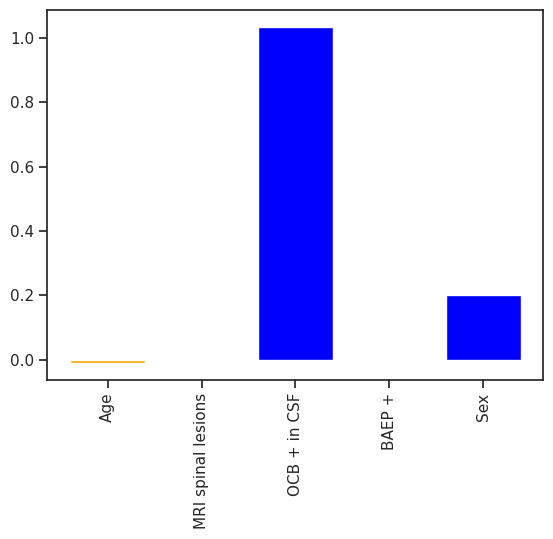

In [ ]:
importance = best_model.coef_[0]

# Summarize feature importance
for i, v in enumerate(importance):
    print('%s: %.5f' % (x_train.columns[i], v))

# Get feature names
feature_names = list(x_train.columns)

# Define colors for each bar
colors = ['blue' if v >= 0 else 'orange' for v in importance]

# Plot feature importances
plt.bar(feature_names, importance, color=colors)
plt.xticks(rotation=90)
plt.show()



#8. Using SMOTE Upsampling

##Data Loading

In [ ]:
#Connect to GDrive to load the dataset
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
#Specify file path and load it into a DataFrame
import pandas as pd
data=pd.read_excel('/content/drive/My Drive/Colab Notebooks/Research Project/Research Project Dataset.xlsx')
df=pd.DataFrame(data)

##Data Pre-processing

Ensuring Reproducibility

In [ ]:
# Import libraries
import random
import numpy as np

#Set seed value
random.seed(42)
np.random.seed(42)

Visualising the dataset and its dimensions

In [ ]:
# Visualise the dataset
df.head(140)

,Nr,Sex,Age,Fatigue,General weakness,Pain,Focal symptoms,Cranial Nerve Symptoms,CN3,CN4,...,Pathological CSF,Increased protein,Increased protein (g/l),Pleocytosis,Pleocytosis (cells/ml),OCB + in CSF,IgG levels in CSF,VEP +,BAEP +,MS
0,2,0,56,0,0,0,1,1,0,0,...,1,0,0.37,0,4,0,,0,0,0
1,3,0,47,0,0,1,1,0,0,0,...,0,0,0.28,0,0,0,22.9,0,1,0
2,4,0,43,0,0,1,1,1,0,0,...,0,0,0.38,0,2,,25.3,1,0,0
3,5,0,39,0,0,1,0,0,0,0,...,0,,,0,1,0,,,,0
4,6,0,61,0,0,1,1,0,0,0,...,1,1,0.57,0,0,1,,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
133,165,0,65,0,0,0,1,0,0,0,...,,,NaN,,NaN,,,1,0,0
134,166,1,61,0,0,0,0,1,1,0,...,1,1,0.96,1,6,0,117,,,0
135,167,0,28,0,1,1,0,0,0,0,...,0,0,0.23,0,4,,,0,,1
136,169,0,22,0,0,0,1,0,0,0,...,0,0,0.16,0,4,1,14.9,0,0,1


In [ ]:
# Number of observations and features in the dataset
print(df.shape)

(138, 44)


Dropping columns not needed for the analysis

In [ ]:
# Remove unnecessary columns
df = df.drop(['Nr', 'Increased protein (g/l)', 'Pleocytosis (cells/ml)', 'Sum of symptoms'], axis=1)

Converting the data type for use by the model

In [ ]:
# Convert all columns to numeric data types
df = df.apply(pd.to_numeric, errors='coerce')

# Check the data types of columns
print(df.dtypes)

Sex                                           int64
Age                                           int64
Fatigue                                       int64
General weakness                              int64
Pain                                          int64
Focal symptoms                                int64
Cranial Nerve Symptoms                        int64
CN3                                           int64
CN4                                           int64
CN5                                           int64
CN6                                           int64
CN8                                           int64
Pathological reflexes                         int64
Babinski's                                    int64
Rossolimo                                     int64
Muscle strength                               int64
Reflex asymmetry                              int64
Muscle tone abnormalities                     int64
Proprioception                              float64
Superficial 

Impute missing data

In [ ]:
#Install library for imputation
!pip install impyute

In [ ]:
#import library for Multiple Imputation by Chained Equations (MICE)
from impyute.imputation.cs import mice

# impute missing values using MICE
imputed_data = mice(df.values)

# convert imputed data back to a pandas DataFrame
imputed_df = pd.DataFrame(imputed_data, columns=df.columns)

Specify features and target variable

In [ ]:
#Specify x and y
x = imputed_df.drop('MS', axis=1)
y = imputed_df['MS']

#Print dimensions
print(x.shape)
print(y.shape)

(138, 39)
(138,)


Upsampling using SMOTE

In [ ]:
#Import libraries
from imblearn.over_sampling import SMOTE

# Upsample the minority class using SMOTE
smote = SMOTE()
x_resampled, y_resampled = smote.fit_resample(x, y)

# Print dimensions
print(x_resampled.shape)
print(y_resampled.shape)

(178, 39)
(178,)


Creating a new dataset with resampled x and y

In [ ]:
# Create a new DataFrame by concatenating x_resampled and y_resampled
new_df = pd.concat([pd.DataFrame(x_resampled, columns=x.columns), pd.DataFrame(y_resampled, columns=['MS'])], axis=1)

# Print dimensions
print(new_df.shape)

(178, 40)


Visualising correlation and multicollinearity as a correlation matrix, heatmap and Seaborn plots

In [ ]:
#Plotting a correlation matrix

#Import libraries
import seaborn as sns
import matplotlib.pyplot as plt

#Calculate and print the correlation matrix
print("Correlation Matrix")
new_df.corr()

Correlation Matrix


,Sex,Age,Fatigue,General weakness,Pain,Focal symptoms,Cranial Nerve Symptoms,CN3,CN4,CN5,...,Juxtacortical,MRI spinal lesions,Pathological CSF,Increased protein,Pleocytosis,OCB + in CSF,IgG levels in CSF,VEP +,BAEP +,MS
Sex,1.000000,0.010620,-0.109337,-0.239593,-0.175078,0.067085,0.133666,0.084957,0.101338,0.157769,...,-0.099616,0.101960,0.207631,0.247665,0.121860,-0.113693,0.070556,-0.010138,-0.063076,0.127650
Age,0.010620,1.000000,-0.054558,0.077789,0.075714,0.122295,0.003067,0.058251,-0.020865,0.074656,...,0.131720,-0.247841,0.029446,0.319144,0.082688,-0.126248,0.269734,0.229393,0.153326,-0.076559
Fatigue,-0.109337,-0.054558,1.000000,0.164268,0.019119,0.055345,0.023935,-0.047067,-0.055452,0.087120,...,0.231895,-0.230644,-0.025048,-0.123186,-0.074336,-0.048505,-0.035765,0.052095,0.047197,-0.121065
General weakness,-0.239593,0.077789,0.164268,1.000000,0.185050,-0.178443,-0.094047,-0.131439,-0.083904,0.002626,...,0.118592,-0.170105,0.029733,0.069025,-0.023168,0.113991,-0.069536,-0.244540,0.018654,0.076439
Pain,-0.175078,0.075714,0.019119,0.185050,1.000000,-0.113160,-0.081300,-0.070299,-0.138497,0.126708,...,0.073582,-0.165062,-0.027761,0.117943,-0.050383,-0.015215,0.054618,-0.053843,-0.183865,-0.143687
Focal symptoms,0.067085,0.122295,0.055345,-0.178443,-0.113160,1.000000,0.249777,0.043527,0.096363,0.016491,...,-0.132943,0.159417,0.034467,0.054851,-0.019224,0.054848,-0.021557,0.217293,0.222169,0.085606
Cranial Nerve Symptoms,0.133666,0.003067,0.023935,-0.094047,-0.081300,0.249777,1.000000,0.354386,0.184733,0.218405,...,0.053447,-0.064693,0.116045,0.096080,0.191009,-0.038498,-0.138224,0.132774,0.044713,0.044635
CN3,0.084957,0.058251,-0.047067,-0.131439,-0.070299,0.043527,0.354386,1.000000,0.551034,-0.089668,...,0.103633,0.081282,-0.017990,0.106074,0.048693,0.064214,0.039325,0.023618,-0.024712,0.053127
CN4,0.101338,-0.020865,-0.055452,-0.083904,-0.138497,0.096363,0.184733,0.551034,1.000000,-0.054399,...,0.003921,0.060232,-0.223134,-0.010849,-0.125632,-0.170007,-0.146385,-0.066285,0.035807,-0.134503
CN5,0.157769,0.074656,0.087120,0.002626,0.126708,0.016491,0.218405,-0.089668,-0.054399,1.000000,...,-0.007891,0.148228,0.097985,0.100661,0.069537,-0.046460,-0.061054,-0.007745,-0.066428,0.058681


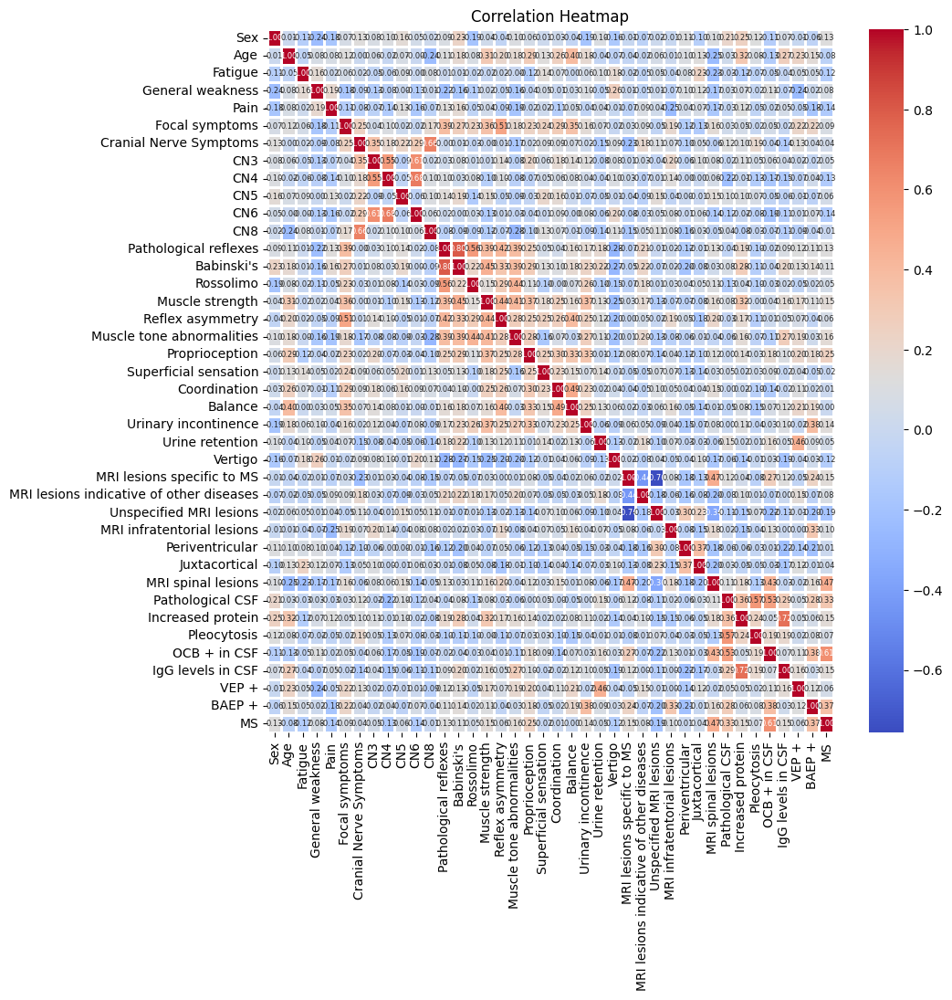

In [ ]:
#Visualise correlation and multicollinearity as a heatmap

#Import libraries
import seaborn as sns
import matplotlib.pyplot as plt

# Computing the correlation matrix
corr_matrix = new_df.corr()

# Plotting a heatmap
plt.figure(figsize=(10, 10))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=1.0, annot_kws={"size": 6})
plt.title("Correlation Heatmap")
plt.show()

In [ ]:
# Import library
import seaborn as sns

# Set color
color = 'blue'

# Visualise plots
sns.pairplot(new_df, diag_kws={'color': color}, plot_kws={'color': color})

In [ ]:
# Print features with multicollinearity
highly_correlated_features = []
abs_corr_matrix = corr_matrix.abs()
for i in range(len(abs_corr_matrix.columns)):
    for j in range(i+1, len(abs_corr_matrix.columns)):
        if abs_corr_matrix.iloc[i, j] > 0.7:
            feature_i = abs_corr_matrix.columns[i]
            feature_j = abs_corr_matrix.columns[j]
            highly_correlated_features.append((feature_i, feature_j))

if len(highly_correlated_features) == 0:
    print("No Multicollinearity Observed")
else:
    print("Features with multicollinearity (absolute correlation coefficient > 0.7):")
    for feature_i, feature_j in highly_correlated_features:
        print(f"{feature_i} - {feature_j}")

Features with multicollinearity (absolute correlation coefficient > 0.7):
Pathological reflexes - Babinski's
MRI lesions specific to MS - Unspecified MRI lesions
Increased protein - IgG levels in CSF


Checking for imbalanced classes in the dataset

0.0    50.0
1.0    50.0
Name: MS, dtype: float64


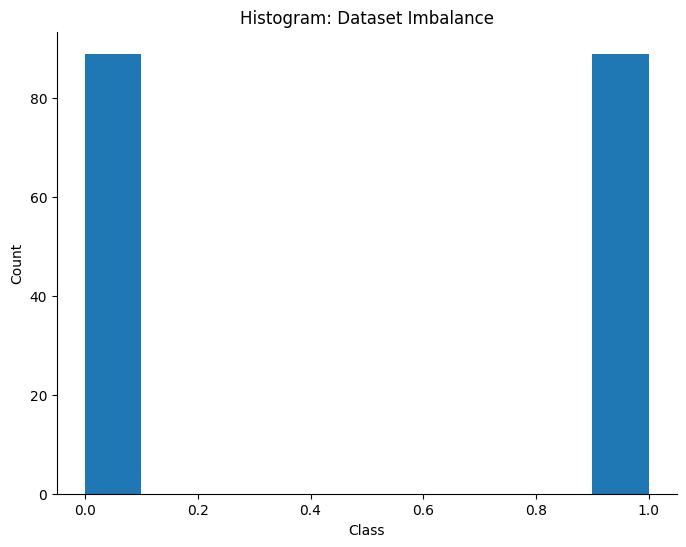

The baseline accuracy is: 0.5


In [ ]:
# Check if dataset is imbalanced
print(y_resampled.value_counts() * 100.0 / len(y_resampled))

# Visualize dataset imbalance
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 6))
ax = y_resampled.hist(grid=False)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel("Class")
ax.set_ylabel("Count")
plt.title("Histogram: Dataset Imbalance")
plt.show()

# Find baseline accuracy
from sklearn.dummy import DummyClassifier

clf = DummyClassifier(strategy='most_frequent')
clf.fit(x_resampled, y_resampled)
baseline_accuracy = clf.score(x_resampled, y_resampled)
print("The baseline accuracy is:", baseline_accuracy)


##Data Splitting

Split data into train and test sets

In [ ]:
#Import train_test_split function
from sklearn.model_selection import train_test_split

# Split data into train and test sets
x_train, x_test, y_train, y_test = train_test_split(x_resampled, y_resampled, test_size=0.2, random_state=1,shuffle=True)

# Print dimensions
print('x_train:', x_train.shape)
print('x_test:', x_test.shape)
print('y_train:', y_train.shape)
print('y_test:', y_test.shape)

x_train: (142, 39)
x_test: (36, 39)
y_train: (142,)
y_test: (36,)


##Importing Libraries for Following Steps

In [ ]:
# Import libraries
from sklearn.metrics import f1_score
import warnings
from sklearn.exceptions import ConvergenceWarning
import numpy as np
from sklearn.model_selection import StratifiedKFold
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV

# Ignore convergence warnings
warnings.filterwarnings("ignore", category=ConvergenceWarning)

##Hyperparameter tuning

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV

# Define parameters to tune for Random Forest Classifier
rf_param_grid = {
    'n_estimators': [100, 200, 300],
    'criterion': ['gini', 'entropy'],
    'max_depth': [None, 5, 10, 15],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'class_weight': [None, 'balanced'],
    'random_state': [None, 42]
}


##Stratified K-Fold Cross Validation:

In [ ]:
# Creating an instance of StratifiedKFold
rf_skfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=1)

##Training and Model Validation:



In [ ]:
# Creating lists to store evaluation metrics for each fold
train_f1_scores = []
val_f1_scores = []

# Iterating over each fold
for train_index, val_index in rf_skfold.split(x_train, y_train):
    x_train_fold, x_val_fold = x_train.iloc[train_index], x_train.iloc[val_index]
    y_train_fold, y_val_fold = y_train.iloc[train_index], y_train.iloc[val_index]

    # Create an instance of Random Forest model
    rf = RandomForestClassifier(random_state=1)

    # Create an instance of GridSearchCV for Random Forest Classifier
    rf_cv = GridSearchCV(rf, rf_param_grid, cv=rf_skfold)

    # Fit GridSearchCV on the training fold
    rf_cv.fit(x_train_fold, y_train_fold)

    # Get the best estimator from GridSearchCV
    best_rf_model = rf_cv.best_estimator_

    # Print best parameters and F1 score
    print("Best Parameters:", rf_cv.best_params_)
    print("F1 Score:", rf_cv.best_score_)

    # Fitting the best estimator on the training fold and making predictions
    y_train_pred = best_rf_model.predict(x_train_fold)

    # Calculating F1 score for the train set
    train_f1 = f1_score(y_train_fold, y_train_pred)

    # Appending train F1 score to the list
    train_f1_scores.append(train_f1)

    # Making predictions for the validation fold
    y_val_pred = best_rf_model.predict(x_val_fold)

    # Calculating F1 score for the validation set
    val_f1 = f1_score(y_val_fold, y_val_pred)

    # Appending validation F1 score to the list
    val_f1_scores.append(val_f1)


Best Parameters: {'class_weight': 'balanced', 'criterion': 'entropy', 'max_depth': None, 'min_samples_leaf': 2, 'min_samples_split': 5, 'n_estimators': 100, 'random_state': 42}
F1 Score: 0.8411067193675889
Best Parameters: {'class_weight': 'balanced', 'criterion': 'entropy', 'max_depth': 15, 'min_samples_leaf': 2, 'min_samples_split': 10, 'n_estimators': 100, 'random_state': None}
F1 Score: 0.8403162055335969
Best Parameters: {'class_weight': 'balanced', 'criterion': 'gini', 'max_depth': None, 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 100, 'random_state': 42}
F1 Score: 0.8339920948616599
Best Parameters: {'class_weight': None, 'criterion': 'entropy', 'max_depth': None, 'min_samples_leaf': 2, 'min_samples_split': 5, 'n_estimators': 100, 'random_state': None}
F1 Score: 0.8339920948616599
Best Parameters: {'class_weight': None, 'criterion': 'gini', 'max_depth': None, 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 100, 'random_state': 42}
F1 Score: 0.87

##Average F1 Scores and Standard Deviation:

In [ ]:
# Calculating the average and standard deviation of F1 scores for train and validation sets
avg_train_f1 = np.mean(train_f1_scores)
std_train_f1 = np.std(train_f1_scores)
avg_val_f1 = np.mean(val_f1_scores)
std_val_f1 = np.std(val_f1_scores)

# Print the average and standard deviation for train and validation F1 scores
print("Average Train F1 Score:", avg_train_f1)
print("Standard Deviation of Train F1 Score:", std_train_f1)
print("Average Validation F1 Score:", avg_val_f1)
print("Standard Deviation of Validation F1 Score:", std_val_f1)


Average Train F1 Score: 0.9835192991156292
Standard Deviation of Train F1 Score: 0.009016149085469402
Average Validation F1 Score: 0.7848351648351648
Standard Deviation of Validation F1 Score: 0.0524360784747111


##Model Training and Prediction:

Using Unseen Data with x_resampled

In [ ]:
# Make predictions on the train set using best model
best_model = rf_cv.best_estimator_
y_train_pred = best_model.predict(x_resampled)

# Make predictions on the test set using best model
best_model = rf_cv.best_estimator_
y_test_pred = best_model.predict(x_test)

##Visualise Various Classification Metrics

In [ ]:
#Print Classification Report
from sklearn.metrics import classification_report
print("Classification Report of Train Data:")
print(classification_report(y_resampled, y_train_pred))

print()

print("Classification Report of Test Data: ")
print(classification_report(y_test, y_test_pred))


Classification Report of Train Data:
              precision    recall  f1-score   support

         0.0       0.92      0.92      0.92        89
         1.0       0.92      0.92      0.92        89

    accuracy                           0.92       178
   macro avg       0.92      0.92      0.92       178
weighted avg       0.92      0.92      0.92       178


Classification Report of Test Data: 
              precision    recall  f1-score   support

         0.0       0.76      0.81      0.79        16
         1.0       0.84      0.80      0.82        20

    accuracy                           0.81        36
   macro avg       0.80      0.81      0.80        36
weighted avg       0.81      0.81      0.81        36



Using Unseen Data with x_resampled

Text(0.5, 1.0, 'Confusion Matrix of Test Data')

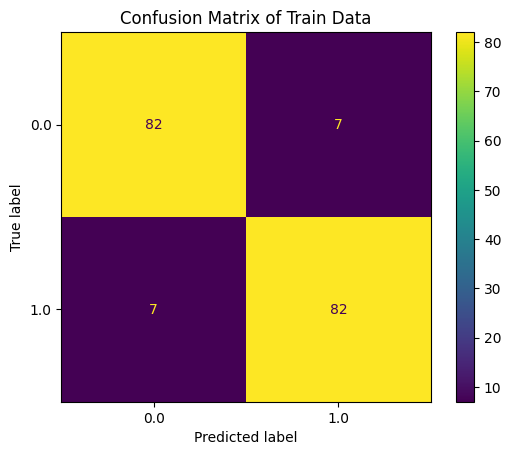

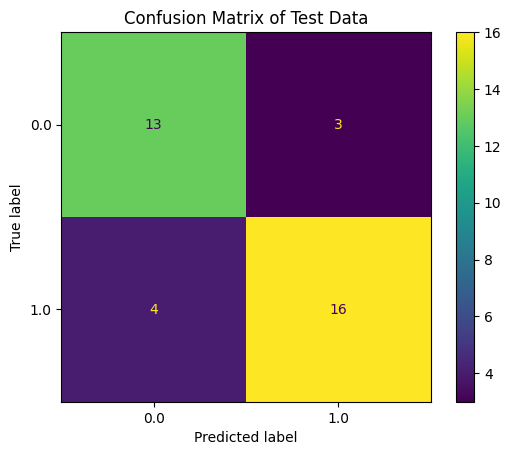

In [ ]:
#Plot Confusion Matrix for Train and Test Data
from sklearn.metrics import ConfusionMatrixDisplay
import matplotlib.pyplot as plt

#Confusion Matrix of Train Data
ConfusionMatrixDisplay.from_predictions(y_resampled, y_train_pred)
plt.title('Confusion Matrix of Train Data')

#Confusion Matrix of Test Data
ConfusionMatrixDisplay.from_predictions(y_test, y_test_pred)
plt.title('Confusion Matrix of Test Data')

Using Unseen Data with x_resampled

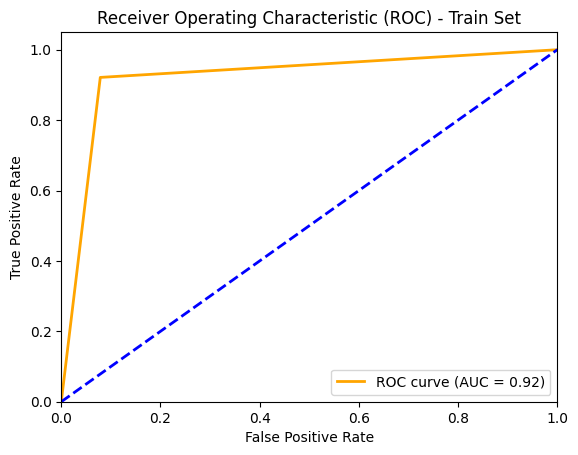

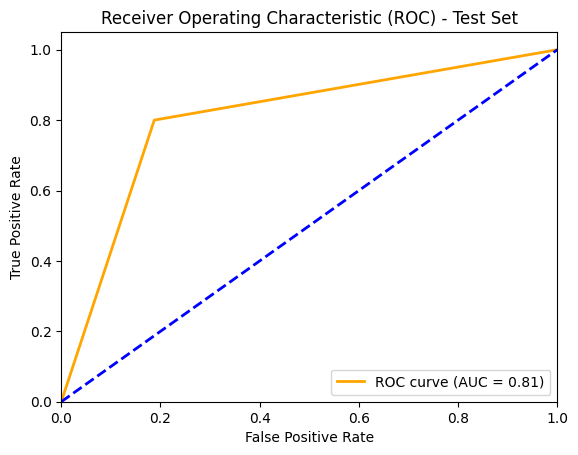

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc

# Map actual "YES" and "NO" values to 1 and 0 respectively
mapping = {1.0: 1, 0.0: 0}
y_train_mapped = [mapping[val] for val in y_resampled]  # Use y_resampled instead of y_train
y_test_mapped = [mapping[val] for val in y_test]

# Map predicted "YES" and "NO" values to 1 and 0 respectively
y_train_pred_mapped = [mapping[val] for val in y_train_pred]
y_test_pred_mapped = [mapping[val] for val in y_test_pred]

# ROC curve and AUC for train data
fpr_train, tpr_train, thresholds_train = roc_curve(y_train_mapped, y_train_pred_mapped)
roc_auc_train = auc(fpr_train, tpr_train)

# ROC curve and AUC for test data
fpr_test, tpr_test, thresholds_test = roc_curve(y_test_mapped, y_test_pred_mapped)
roc_auc_test = auc(fpr_test, tpr_test)

# Plot ROC curve for train data
plt.figure()
plt.plot(fpr_train, tpr_train, color='orange', lw=2, label='ROC curve (AUC = %0.2f)' % roc_auc_train)
plt.plot([0, 1], [0, 1], color='blue', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) - Train Set')
plt.legend(loc="lower right")

# Plot ROC curve for test data
plt.figure()
plt.plot(fpr_test, tpr_test, color='orange', lw=2, label='ROC curve (AUC = %0.2f)' % roc_auc_test)
plt.plot([0, 1], [0, 1], color='blue', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) - Test Set')
plt.legend(loc="lower right")

plt.show()


##Calculate Feature Importance Scores

Using Unseen Data with x_resampled

Sex: 0.03623
Age: 0.03125
Fatigue: 0.00252
General weakness: 0.00720
Pain: 0.00498
Focal symptoms: 0.00794
Cranial Nerve Symptoms: 0.02760
CN3: 0.00533
CN4: 0.00016
CN5: 0.00256
CN6: 0.01328
CN8: 0.01206
Pathological reflexes: 0.01229
Babinski's: 0.01200
Rossolimo: 0.00938
Muscle strength: 0.01519
Reflex asymmetry: 0.01636
Muscle tone abnormalities: 0.00836
Proprioception: 0.04780
Superficial sensation: 0.01406
Coordination: 0.01797
Balance: 0.01436
Urinary incontinence: 0.00401
Urine retention: 0.00245
Vertigo: 0.01270
MRI lesions specific to MS: 0.01892
MRI lesions indicative of other diseases: 0.01188
Unspecified MRI lesions: 0.01856
MRI infratentorial lesions: 0.01763
Periventricular: 0.02557
Juxtacortical: 0.02623
MRI spinal lesions: 0.10837
Pathological CSF: 0.05978
Increased protein: 0.02098
Pleocytosis: 0.01977
OCB + in CSF: 0.17636
IgG levels in CSF: 0.06150
VEP +: 0.03664
BAEP +: 0.05972


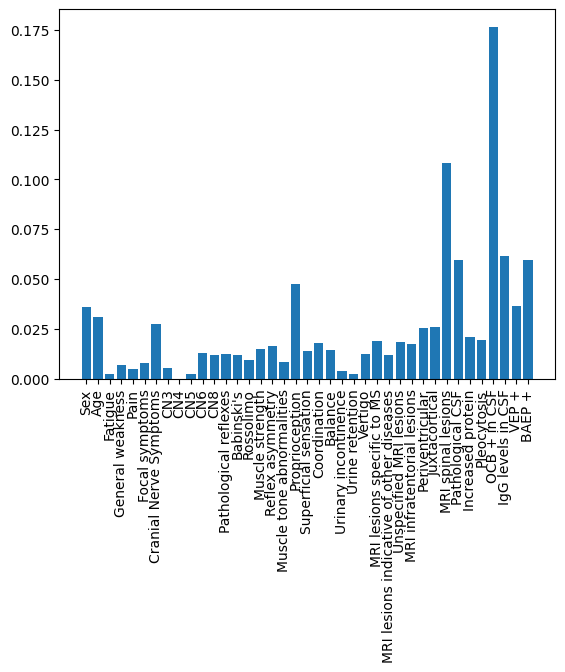

In [ ]:
importance = best_model.feature_importances_

#Summarise feature importance
for i, v in enumerate(importance):
    print('%s: %.5f' % (x_train.columns[i], v))

# Get feature names
feature_names = list(x_train.columns)

# Plot feature importances
plt.bar(feature_names, importance)
plt.xticks(rotation=90)
plt.show()
